<a href="https://colab.research.google.com/github/VijaySarathy/Deep-Learning/blob/master/GAN_GenAI_Basics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Fri Nov 22 17:19:42 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import pdb

def processname(name):
  pdb.set_trace()
  when = "today"
  print(name,"is using the google colab",when)

processname("Vijay")

> <ipython-input-3-d3b4f66bfa05>(5)processname()
      3 def processname(name):
      4   pdb.set_trace()
----> 5   when = "today"
      6   print(name,"is using the google colab",when)
      7 

ipdb> 
ipdb> today
*** NameError: name 'today' is not defined
ipdb> when
*** NameError: name 'when' is not defined
ipdb> l
      1 import pdb
      2 
      3 def processname(name):
      4   pdb.set_trace()
----> 5   when = "today"
      6   print(name,"is using the google colab",when)
      7 
      8 processname("Vijay")

ipdb> n
> <ipython-input-3-d3b4f66bfa05>(6)processname()
      4   pdb.set_trace()
      5   when = "today"
----> 6   print(name,"is using the google colab",when)
      7 
      8 processname("Vijay")

ipdb> when
'today'
ipdb> c



PYDEV DEBUGGER WARNING:
sys.settrace() should not be used when the debugger is being used.
This may cause the debugger to stop working correctly.
If this is needed, please check: 
http://pydev.blogspot.com/2007/06/why-cant-pydev-debugger-work-with.html
to see how to restore the debug tracing back correctly.
Call Location:
  File "/usr/lib/python3.10/bdb.py", line 347, in set_continue
    sys.settrace(None)



Vijay is using the google colab today


Simple GAN network

In [ ]:
# import the libraries

import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [ ]:
#visualization function
def show(tensor, ch=1, size=(28,28),num=16):
  #tensor 128 x 784
  data = tensor.detach().cpu().view(-1,ch,*size) #128 x 1 x 28 x 28
  grid = make_grid(data[:num],nrow = 4).permute(1,2,0) #16, 1, 28 x 28
  plt.imshow(grid)
  plt.show()

In [ ]:
# setup of the main parameters and hyper parameters

epochs = 300
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),shuffle=True, batch_size=bs)


# number of steps = 60000 / 128 = 468.75 ~ 469


In [ ]:
# declare our models

#Generator

def genBlock(inp,out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace = True) #Non linear function
  )


class Generator(nn.Module):
  def __init__(self,z_dim=64,i_dim=784,h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim), #64, 128
        genBlock(h_dim, h_dim*2), #128, 256
        genBlock(h_dim*2, h_dim*4), #256, 512
        genBlock(h_dim*4, h_dim*8), #512, 1024
        nn.Linear(h_dim*8, i_dim), #1028, 784(28x28)
        nn.Sigmoid(),
    )

  def forward(self, noise):
      return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

# Descriminator

def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc = nn.Sequential(
        discBlock(i_dim, h_dim*4), #784, 1024
        discBlock(h_dim*4, h_dim*2), # 1024, 512
        discBlock(h_dim*2, h_dim), #512, 256
        nn.Linear(h_dim, 1) #256 , 1
    )

  def forward(self, image):
      return self.disc(image)



In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [ ]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([5, 1, 1, 6, 2, 4, 2, 1, 8, 2])


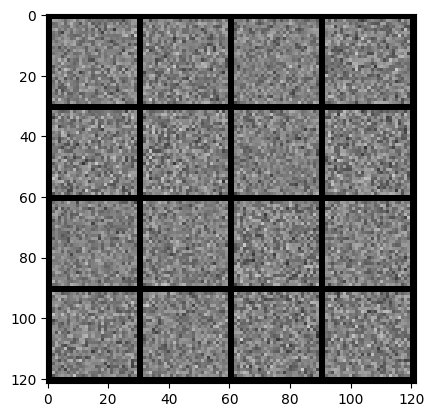

In [ ]:
x,y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [ ]:
#calculating the loss

#generator loss

def calc_gen_loss(loss_func, gen, disc,number, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  pred = disc(fake)
  targets = torch.ones_like(pred)
  gen_loss = loss_func(pred, targets)

  return gen_loss

def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise = gen_noise(number, z_dim)
  fake = gen(noise)
  disc_fake = disc(fake.detach())
  disc_fake_targets = torch.zeros_like(disc_fake)
  disc_fake_loss = loss_func(disc_fake, disc_fake_targets)

  disc_real = disc(real)
  disc_real_targets = torch.ones_like(disc_real)
  disc_real_loss = loss_func(disc_real, disc_real_targets)
  disc_loss = (disc_fake_loss + disc_real_loss)/2

  return disc_loss


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


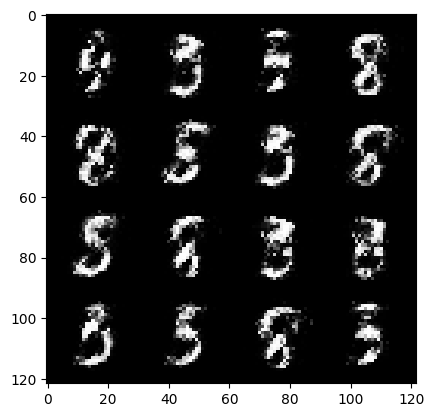

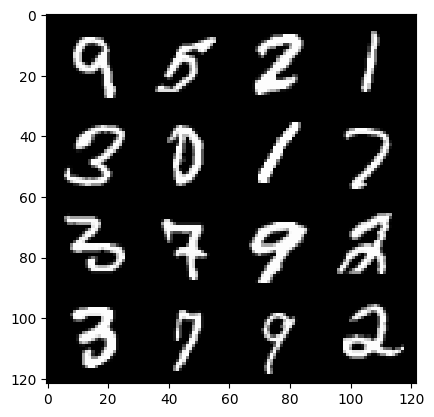

0: step 300/ Gen loss: 109.52162121216426 / Disc loss: 0.501106719923361


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


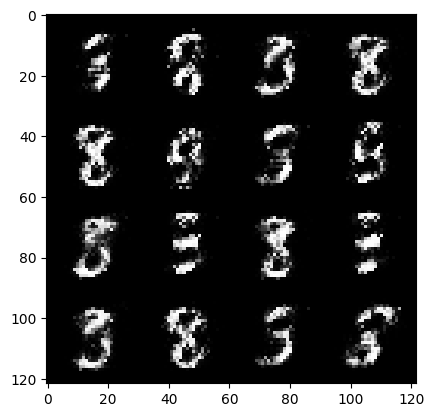

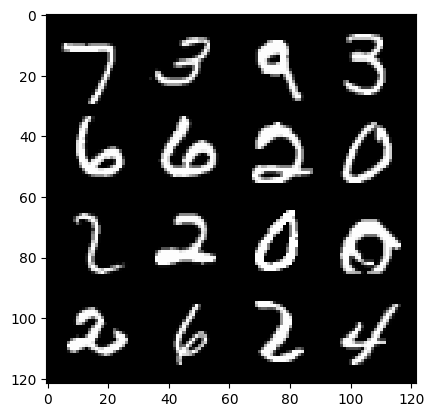

1: step 600/ Gen loss: 5.612076493899028 / Disc loss: 0.03282918712279449
stepped in to the loop


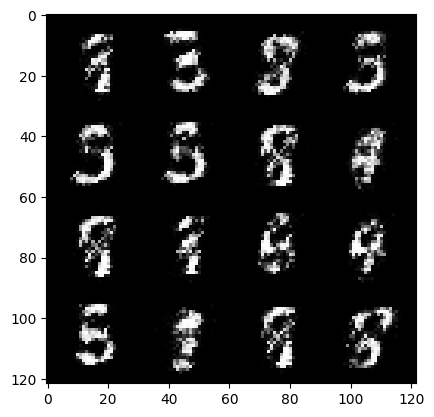

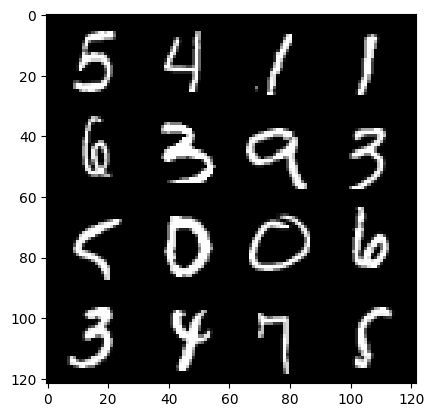

1: step 900/ Gen loss: 6.0524964284896905 / Disc loss: 0.03199227546962599


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


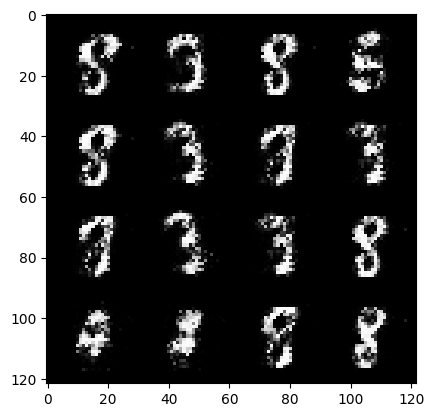

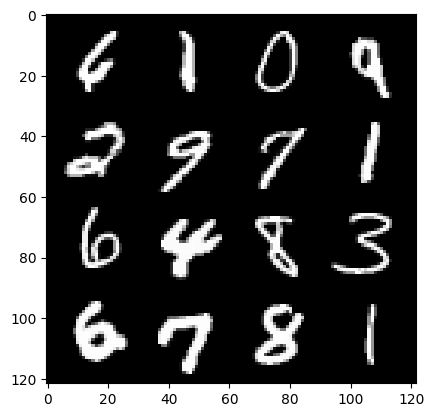

2: step 1200/ Gen loss: 5.315494041442869 / Disc loss: 0.042204414258400595


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


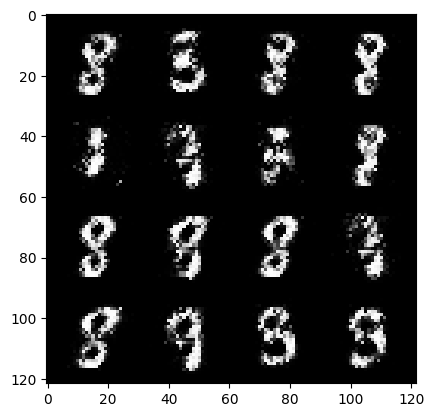

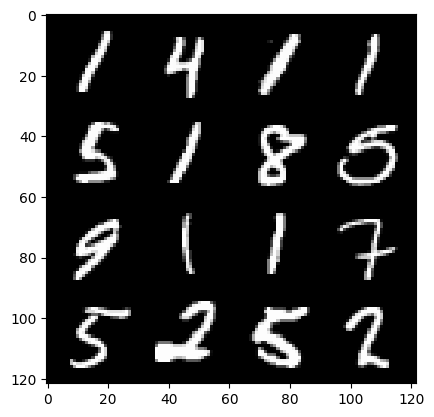

3: step 1500/ Gen loss: 5.61446924050649 / Disc loss: 0.03389465224929153
stepped in to the loop


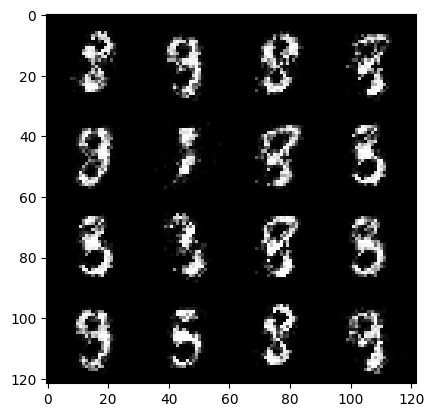

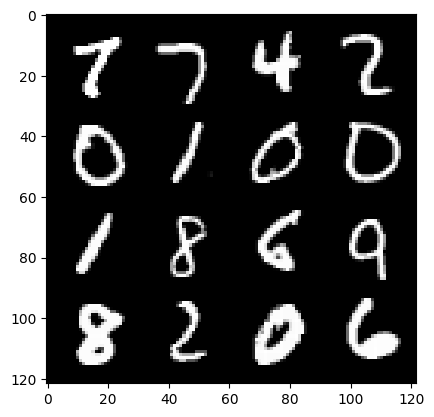

3: step 1800/ Gen loss: 5.714933536847432 / Disc loss: 0.03770320879761131


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


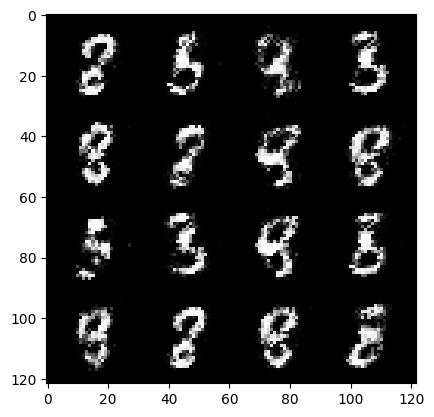

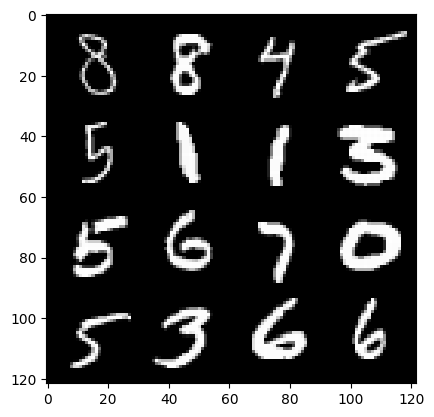

4: step 2100/ Gen loss: 5.834345943133037 / Disc loss: 0.03559522463629644


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


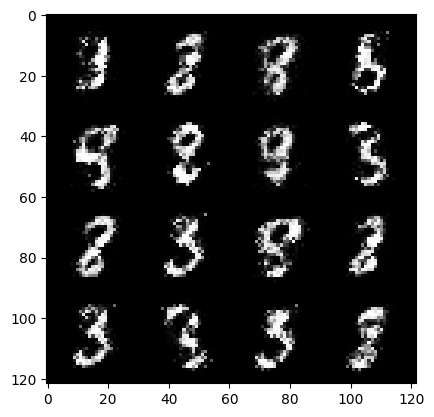

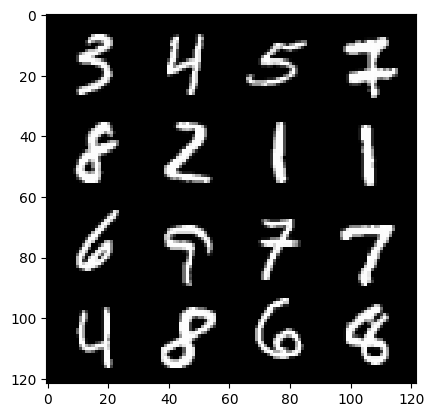

5: step 2400/ Gen loss: 5.583907915751139 / Disc loss: 0.046856236107026536
stepped in to the loop


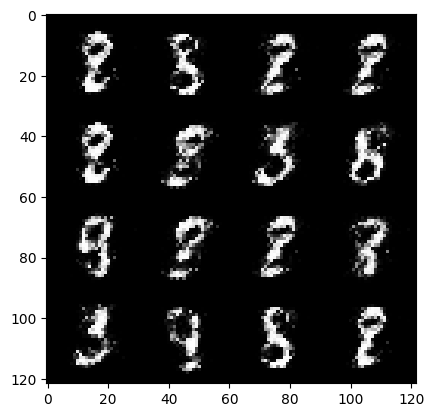

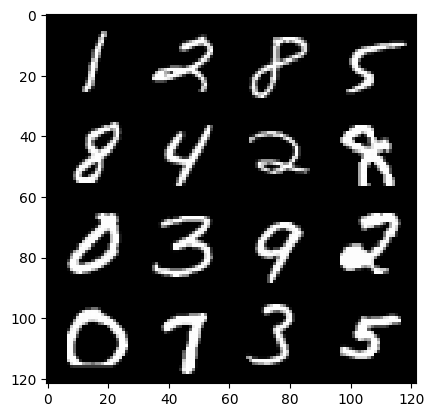

5: step 2700/ Gen loss: 5.5206400044759105 / Disc loss: 0.04192147893675914


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


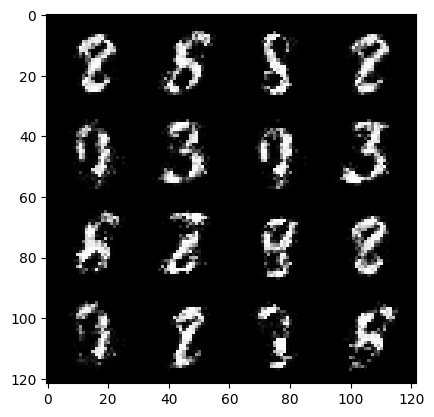

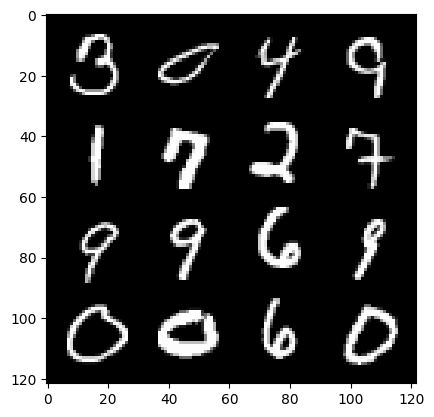

6: step 3000/ Gen loss: 5.51668919483821 / Disc loss: 0.04202988727639118


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


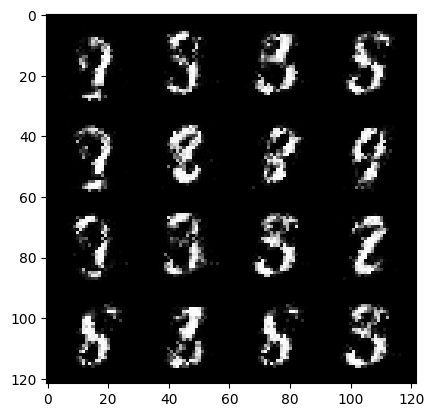

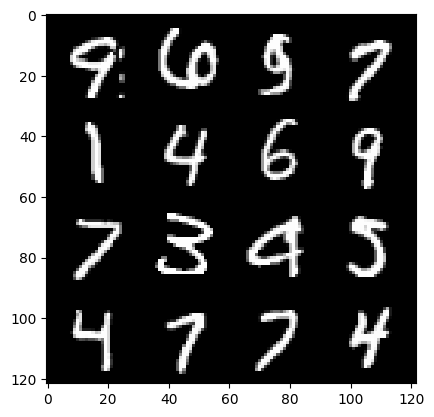

7: step 3300/ Gen loss: 5.490052636464441 / Disc loss: 0.0409086024388671
stepped in to the loop


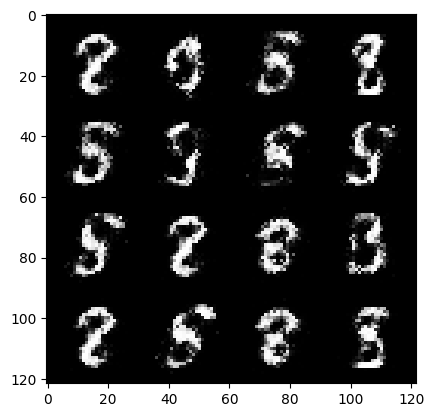

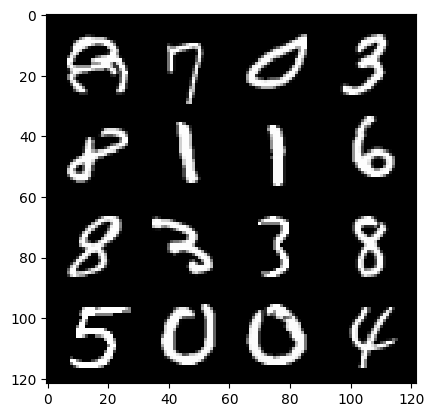

7: step 3600/ Gen loss: 5.526049683888752 / Disc loss: 0.04122374171701572


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


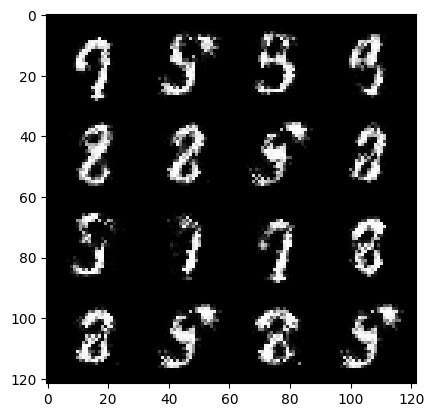

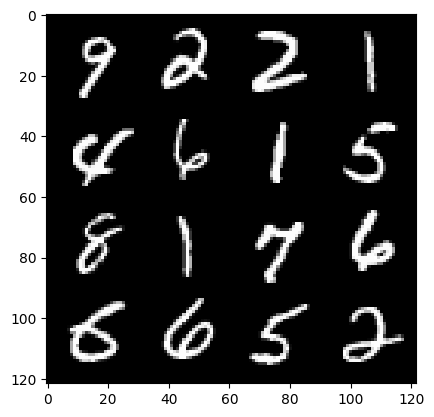

8: step 3900/ Gen loss: 5.5596718939145395 / Disc loss: 0.03874871339338522
stepped in to the loop


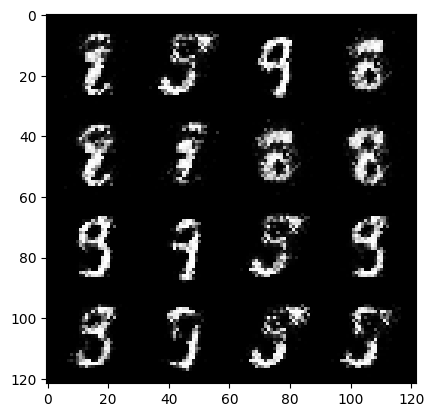

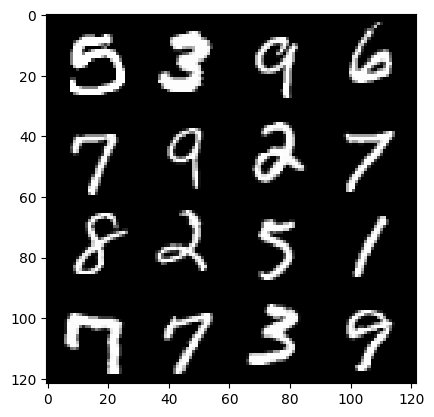

8: step 4200/ Gen loss: 5.557868987719217 / Disc loss: 0.03824890765671928


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


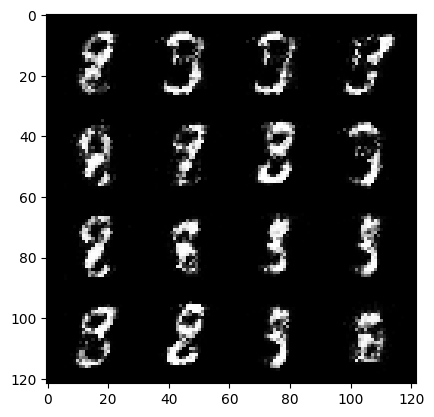

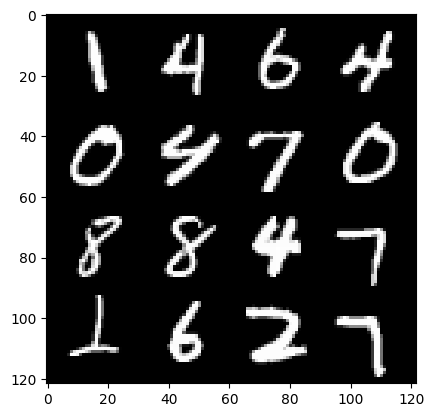

9: step 4500/ Gen loss: 5.931208016077677 / Disc loss: 0.041480531406899286


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


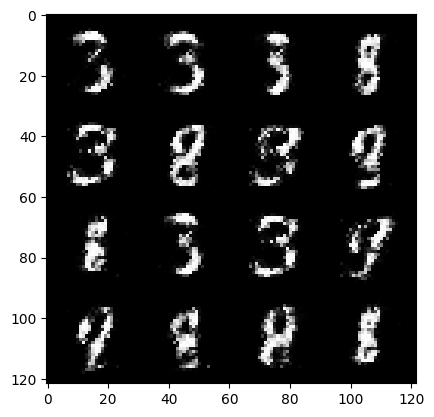

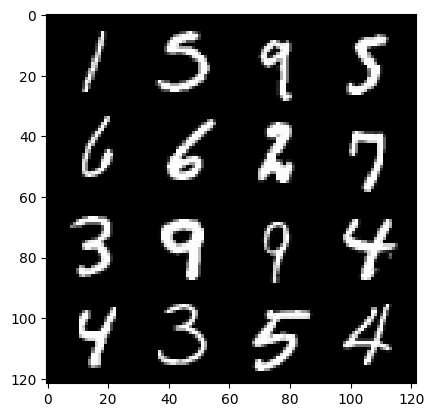

10: step 4800/ Gen loss: 5.7537367995580055 / Disc loss: 0.05408265147358179
stepped in to the loop


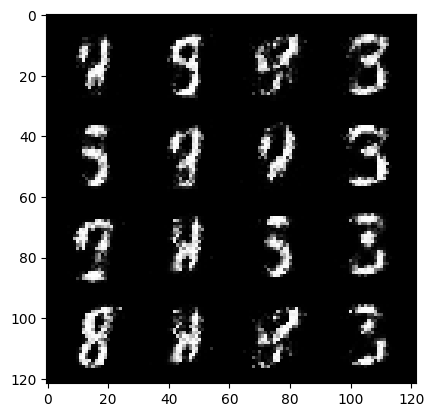

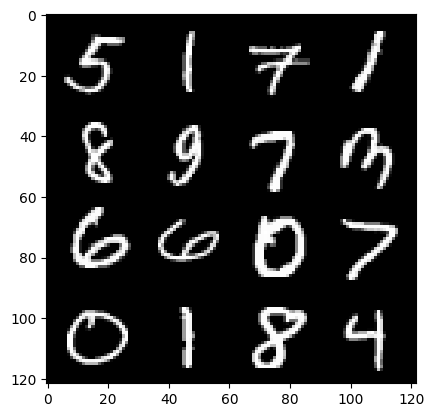

10: step 5100/ Gen loss: 5.84430712858836 / Disc loss: 0.046591976947772


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


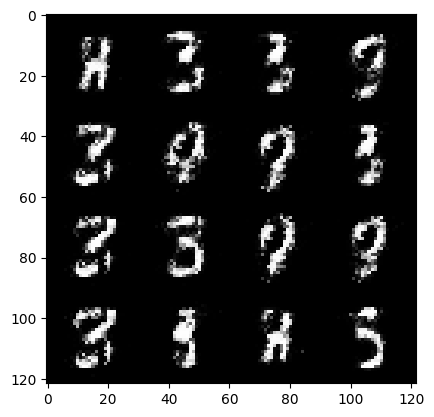

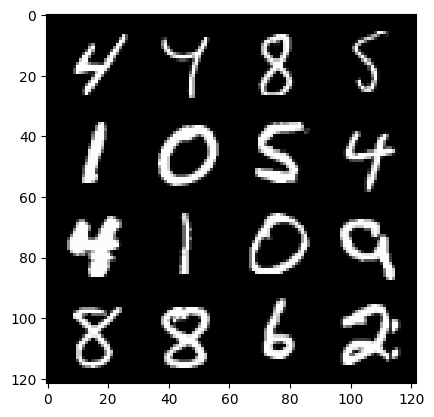

11: step 5400/ Gen loss: 5.253723657925922 / Disc loss: 0.04432710876067481


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


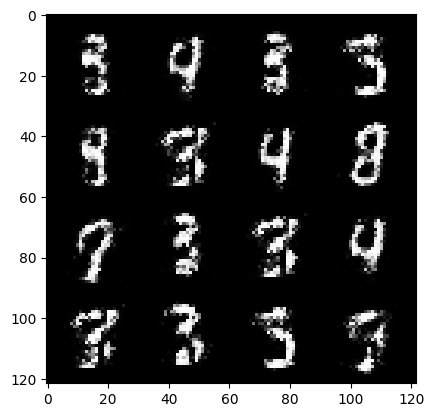

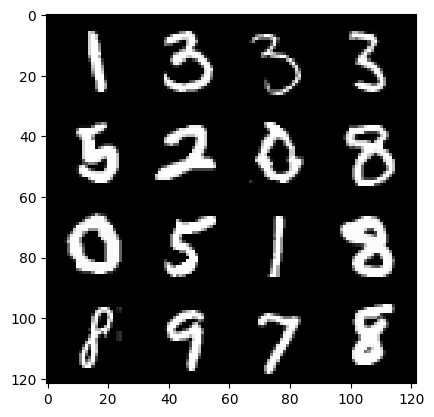

12: step 5700/ Gen loss: 5.351201062202453 / Disc loss: 0.045999664294843846
stepped in to the loop


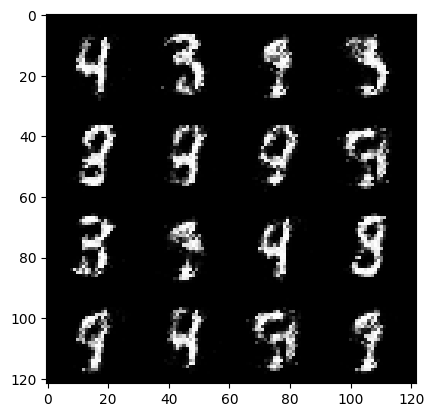

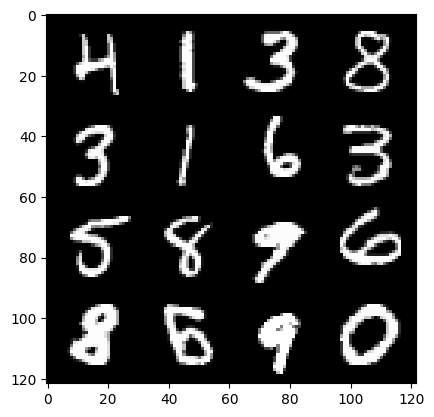

12: step 6000/ Gen loss: 5.379892026583349 / Disc loss: 0.05009294557385143


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


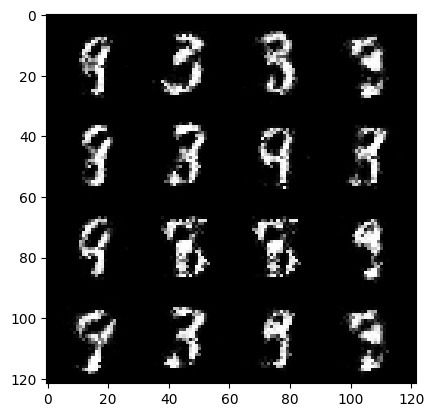

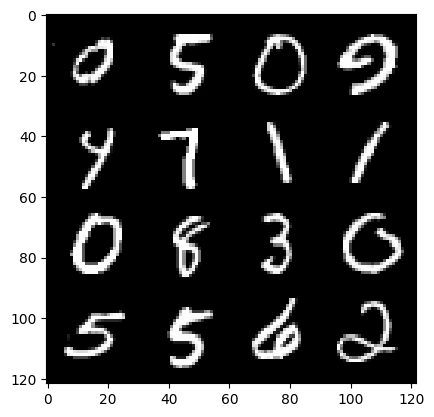

13: step 6300/ Gen loss: 5.320104193687442 / Disc loss: 0.04887394819408656


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


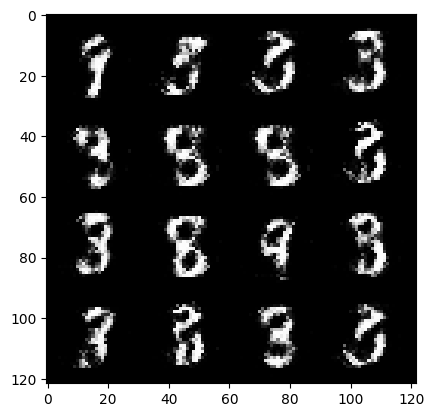

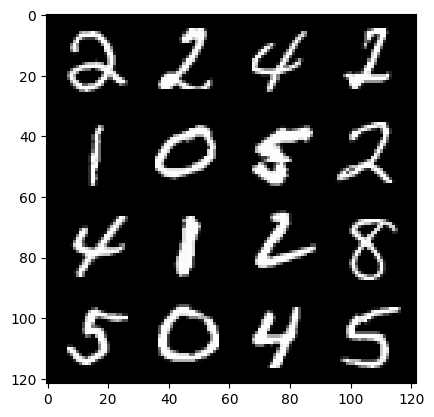

14: step 6600/ Gen loss: 5.27290726502736 / Disc loss: 0.05814895638885597
stepped in to the loop


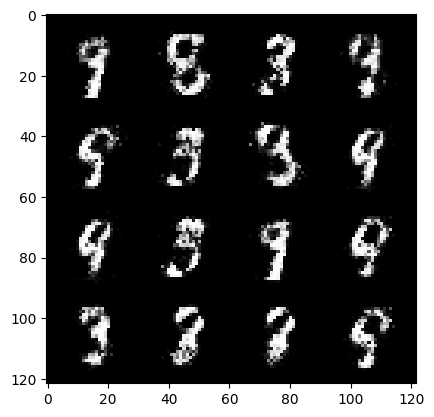

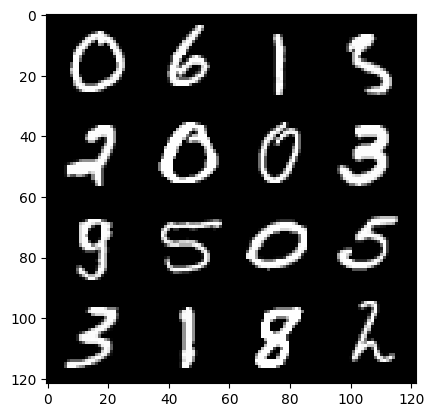

14: step 6900/ Gen loss: 5.096447427272795 / Disc loss: 0.06704967741233606


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


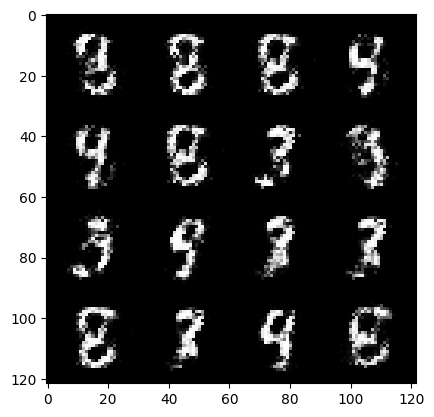

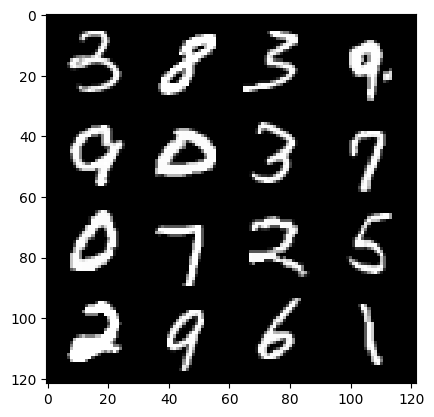

15: step 7200/ Gen loss: 5.048818353017171 / Disc loss: 0.05681877457226316
stepped in to the loop


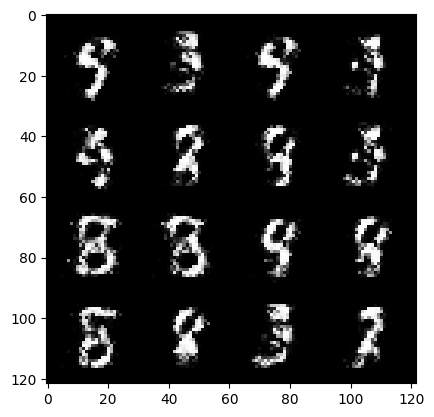

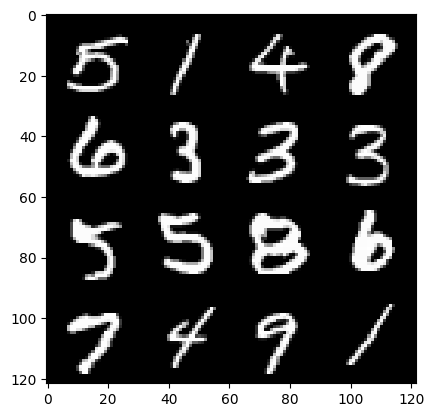

15: step 7500/ Gen loss: 5.236681221326195 / Disc loss: 0.06561280478723353


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


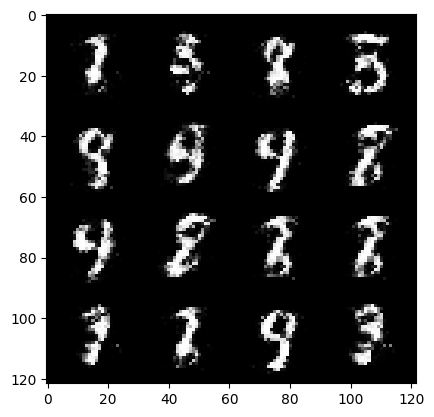

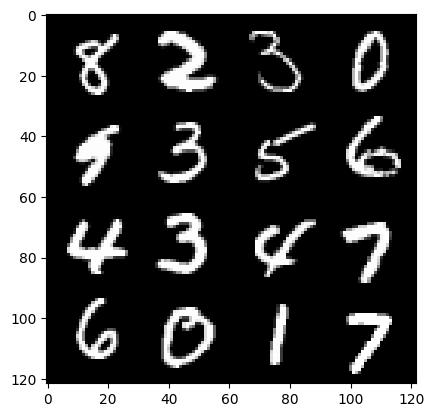

16: step 7800/ Gen loss: 4.990523131688435 / Disc loss: 0.06724897705018519


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


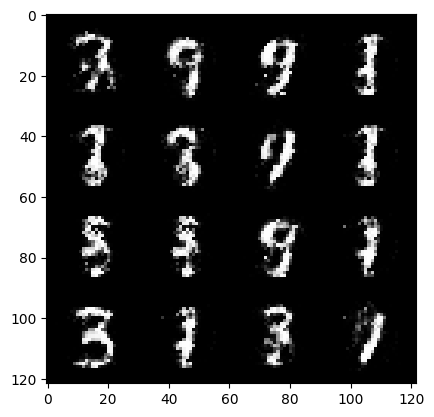

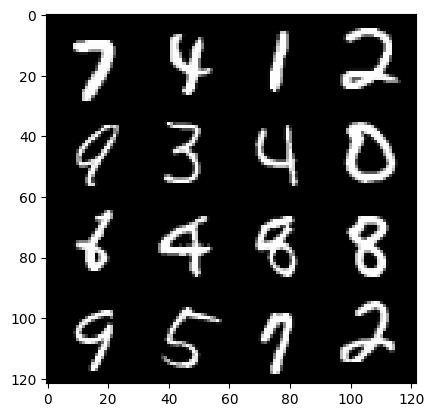

17: step 8100/ Gen loss: 5.181874608993532 / Disc loss: 0.0592558881205817
stepped in to the loop


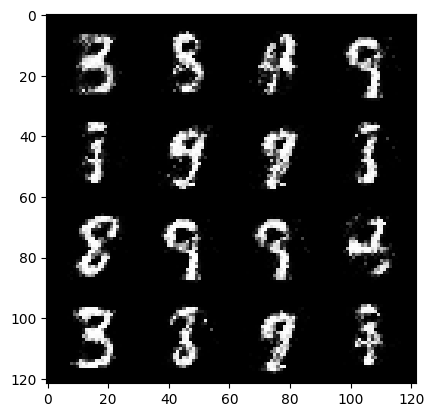

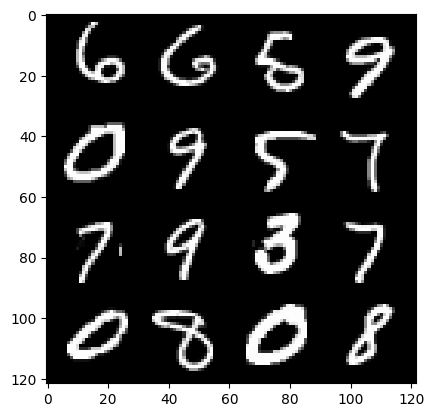

17: step 8400/ Gen loss: 5.157890640099845 / Disc loss: 0.06273675730451941


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


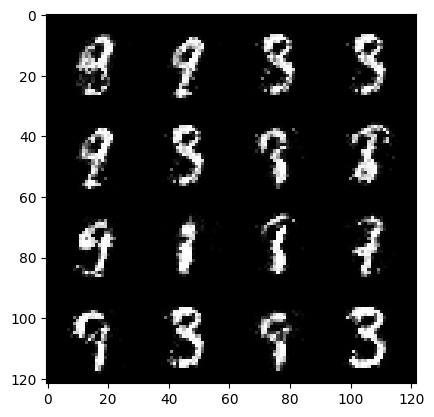

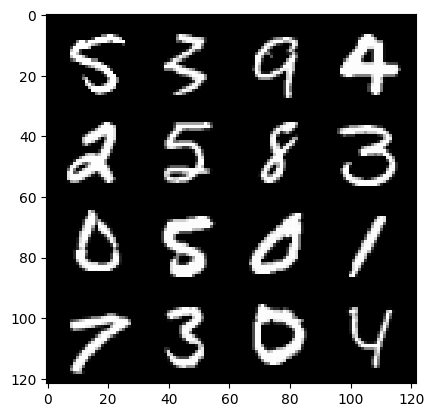

18: step 8700/ Gen loss: 4.972424141565959 / Disc loss: 0.06602828945343696


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


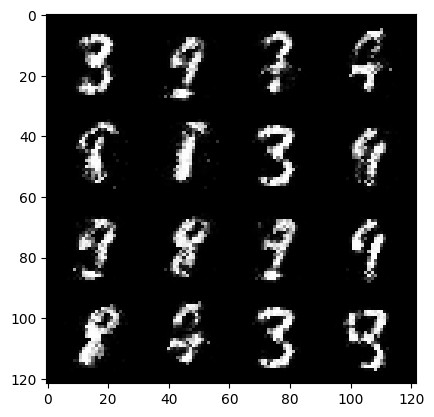

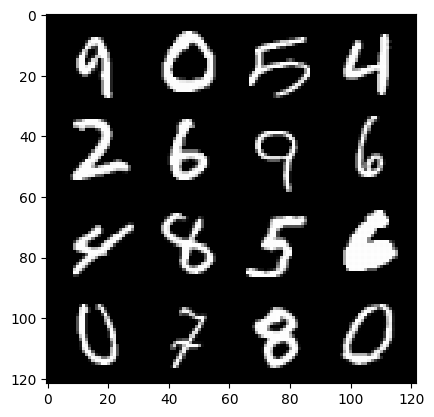

19: step 9000/ Gen loss: 5.049915649890902 / Disc loss: 0.07346440122773251
stepped in to the loop


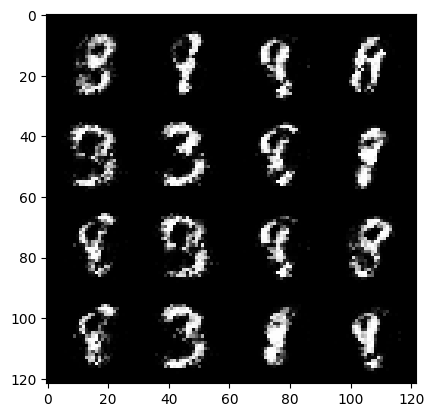

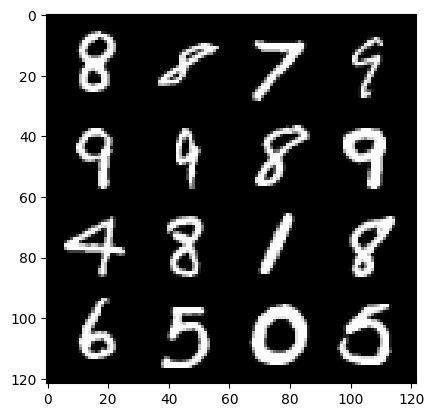

19: step 9300/ Gen loss: 5.011759179433183 / Disc loss: 0.07828962144131463


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


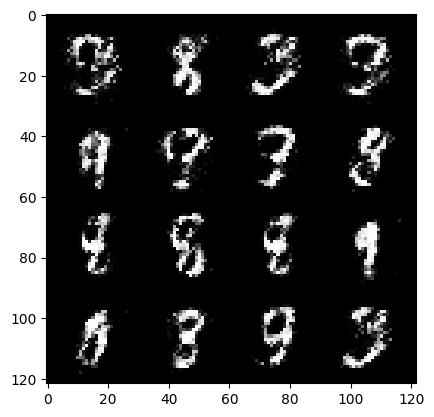

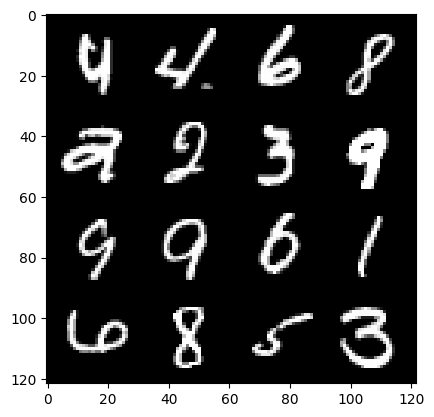

20: step 9600/ Gen loss: 4.965194144248962 / Disc loss: 0.07444928859670961


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


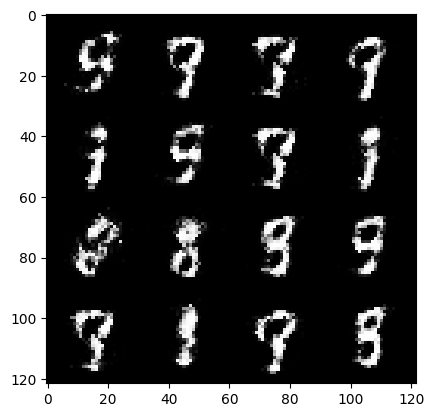

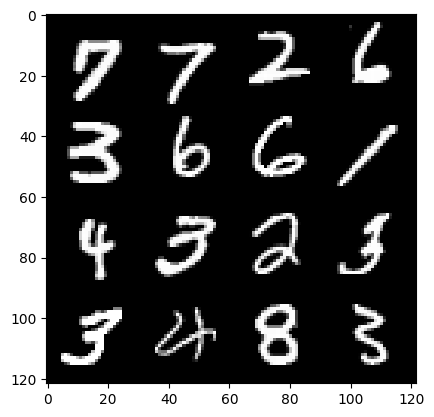

21: step 9900/ Gen loss: 5.046467669010163 / Disc loss: 0.07780459947884073
stepped in to the loop


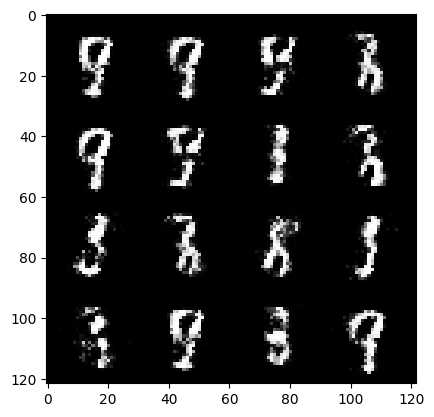

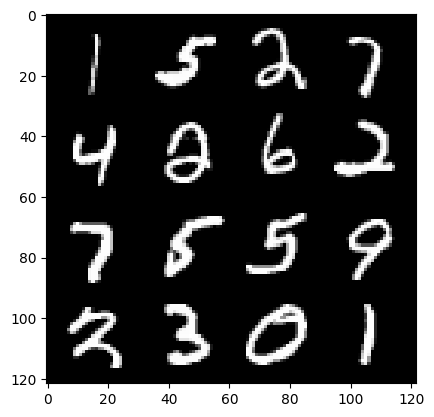

21: step 10200/ Gen loss: 4.768991727828981 / Disc loss: 0.06775708482290306


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


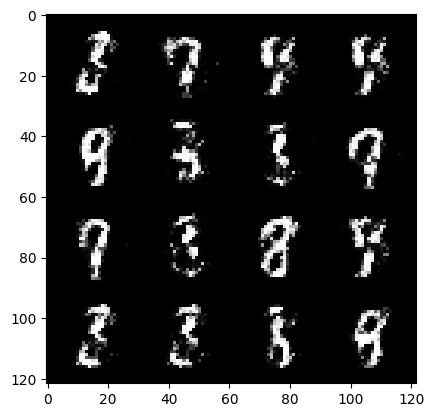

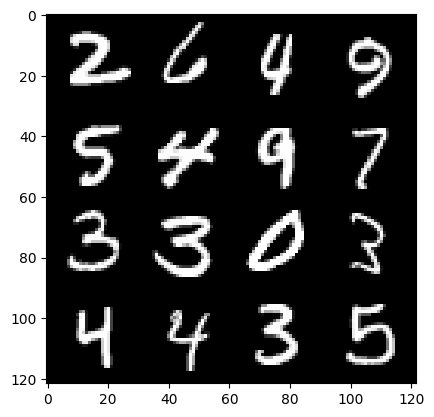

22: step 10500/ Gen loss: 5.045811293125152 / Disc loss: 0.06736582058792312


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


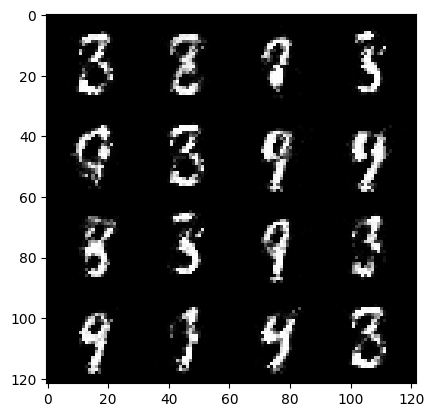

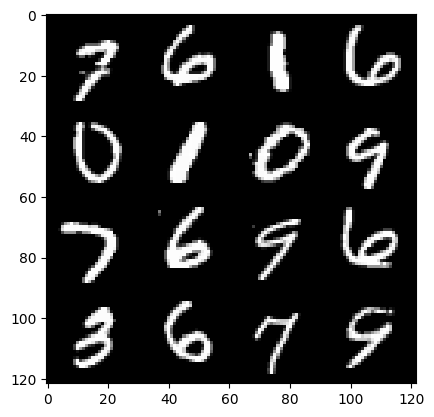

23: step 10800/ Gen loss: 4.729631232420601 / Disc loss: 0.06434757471705474
stepped in to the loop


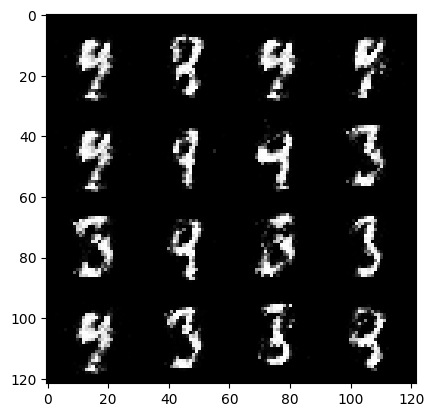

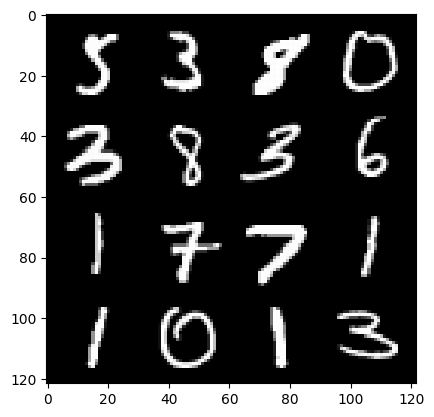

23: step 11100/ Gen loss: 4.72526761452357 / Disc loss: 0.07777991874143483


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


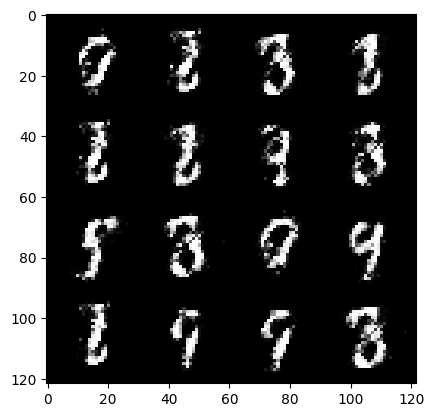

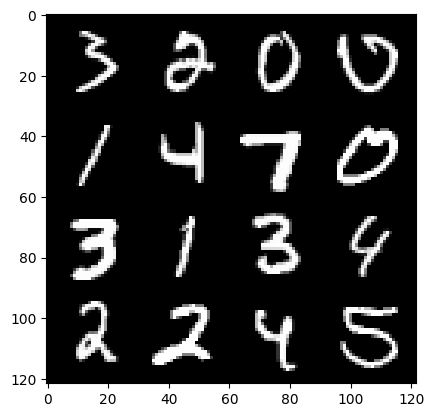

24: step 11400/ Gen loss: 4.640287288029991 / Disc loss: 0.08636053571477537
stepped in to the loop


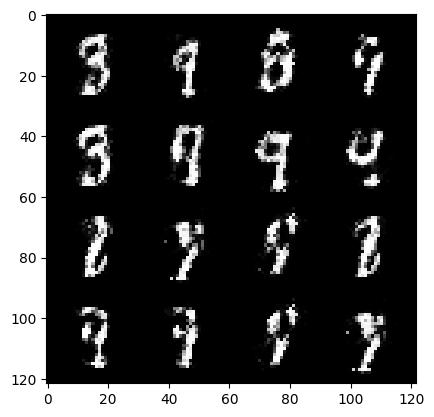

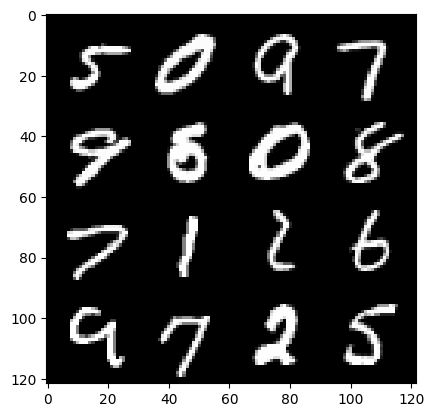

24: step 11700/ Gen loss: 4.594125494162244 / Disc loss: 0.0942213783040643


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


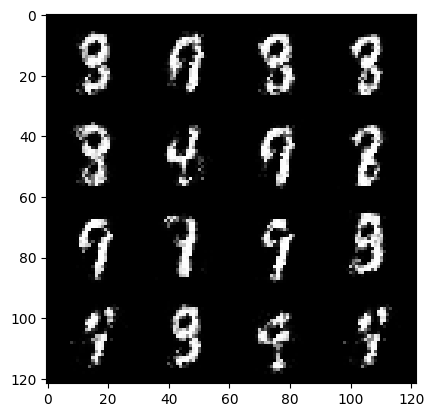

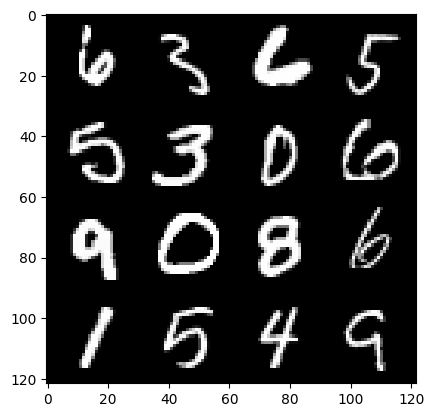

25: step 12000/ Gen loss: 4.346134052276612 / Disc loss: 0.09452128453801074


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


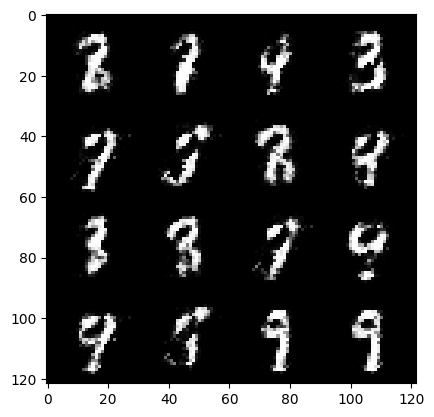

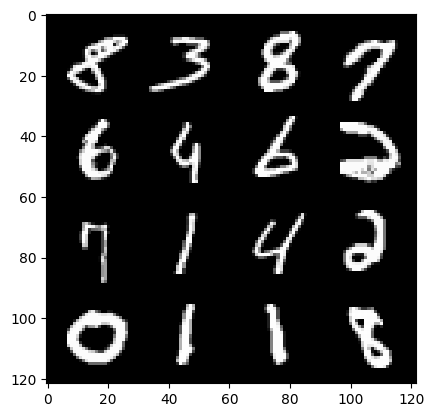

26: step 12300/ Gen loss: 4.470976254940034 / Disc loss: 0.09879758003478246
stepped in to the loop


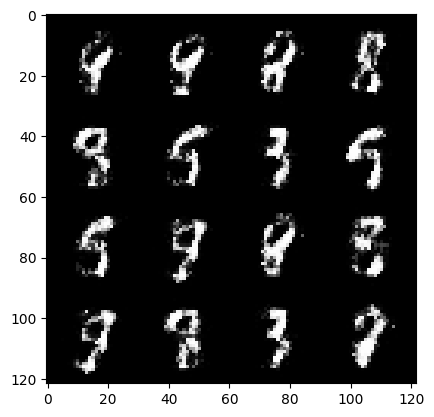

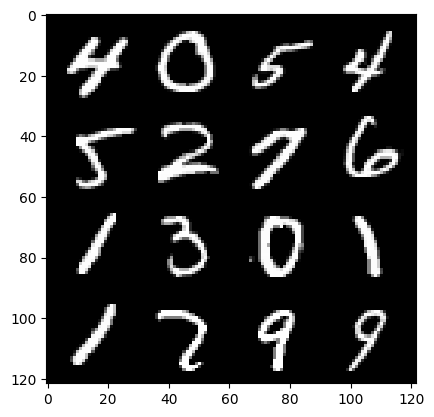

26: step 12600/ Gen loss: 4.276477886835733 / Disc loss: 0.11013650060941785


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


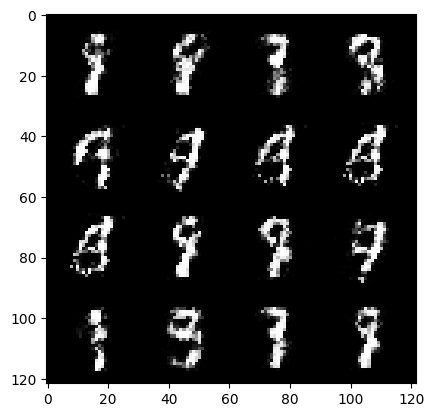

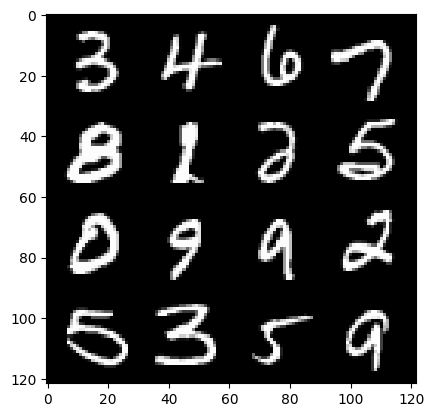

27: step 12900/ Gen loss: 4.317928153673806 / Disc loss: 0.09687011770904061


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


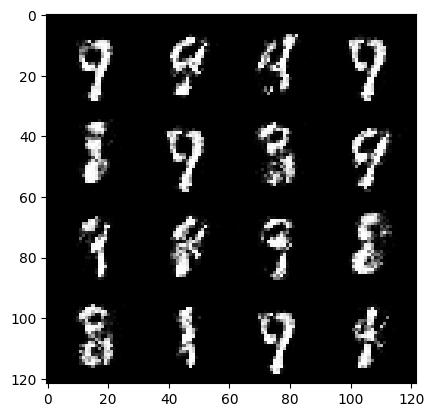

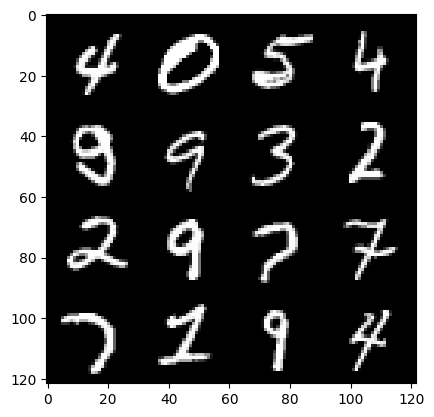

28: step 13200/ Gen loss: 4.359460888703663 / Disc loss: 0.09562720747043685
stepped in to the loop


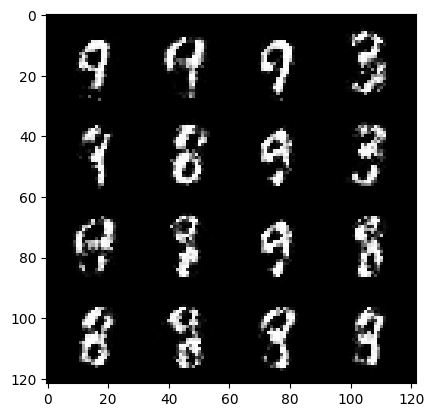

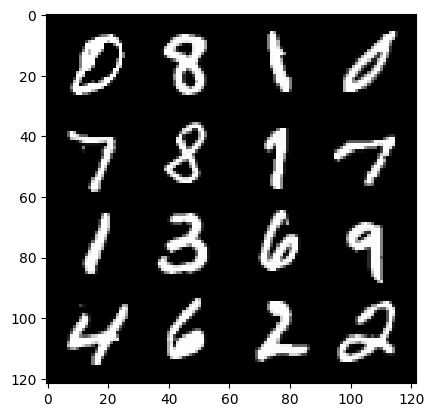

28: step 13500/ Gen loss: 4.032031825383502 / Disc loss: 0.11300398325547578


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


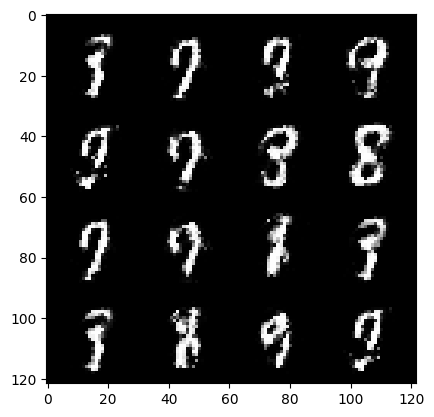

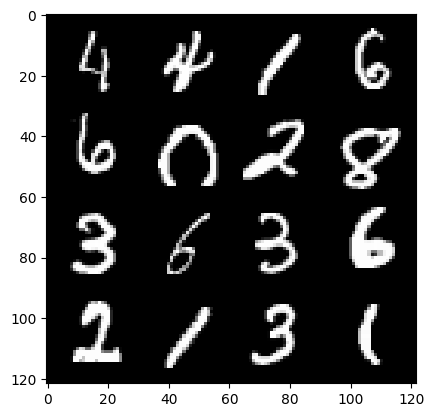

29: step 13800/ Gen loss: 4.142542169888815 / Disc loss: 0.10981317029645042


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


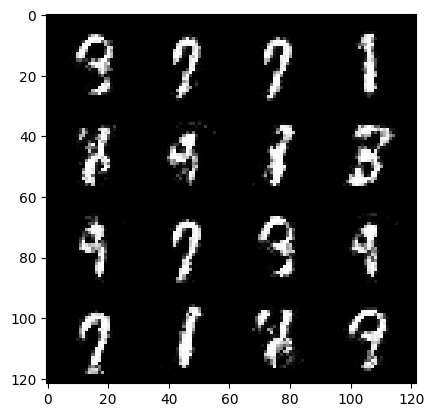

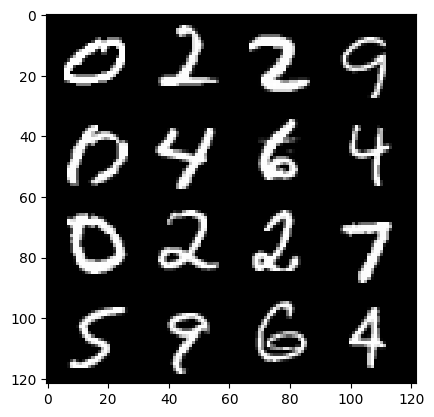

30: step 14100/ Gen loss: 3.8665297571818056 / Disc loss: 0.12269212080786622
stepped in to the loop


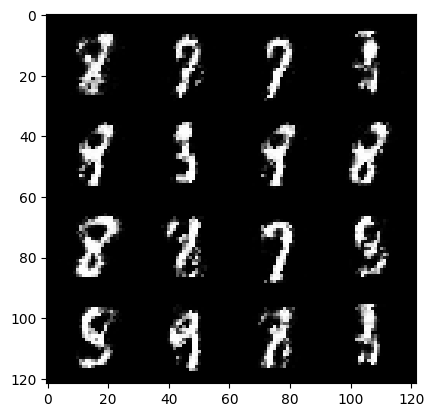

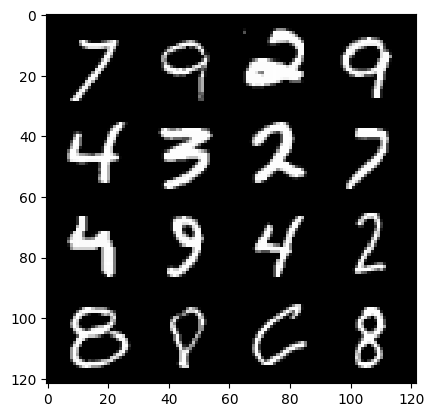

30: step 14400/ Gen loss: 4.047551821072898 / Disc loss: 0.1058344790587823


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


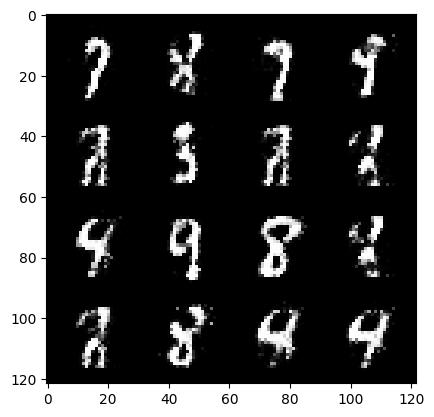

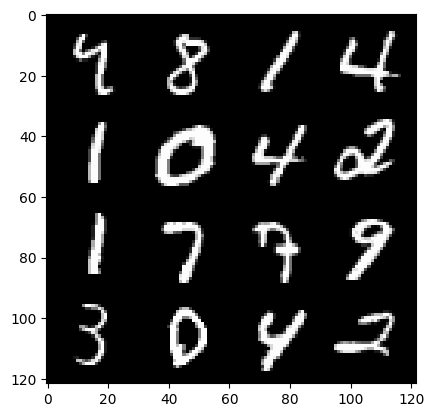

31: step 14700/ Gen loss: 4.085927401383717 / Disc loss: 0.10629012281696
stepped in to the loop


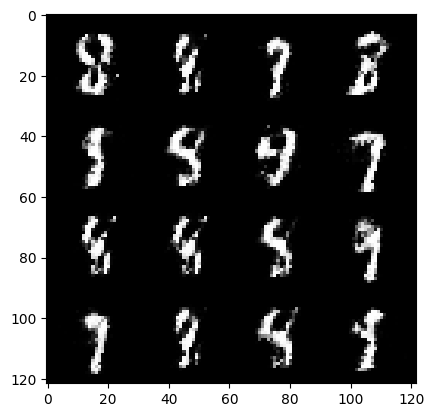

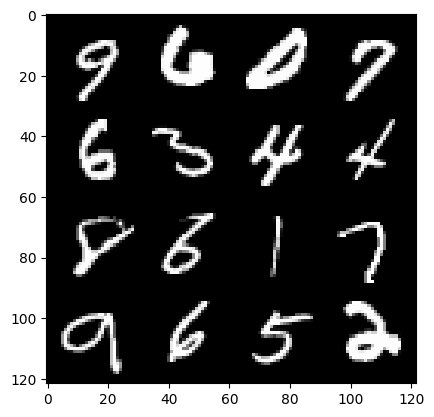

31: step 15000/ Gen loss: 3.996564993063607 / Disc loss: 0.10916170830527934


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


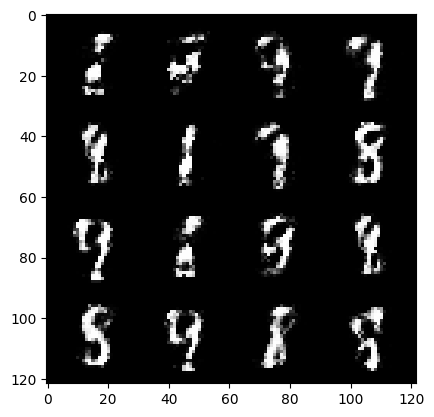

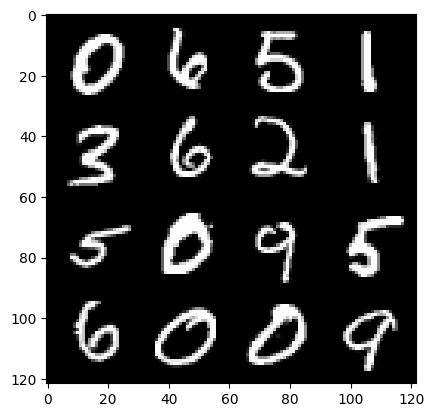

32: step 15300/ Gen loss: 4.123675607840219 / Disc loss: 0.09719549386451644


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


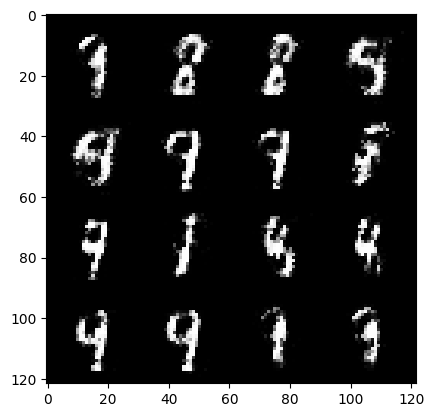

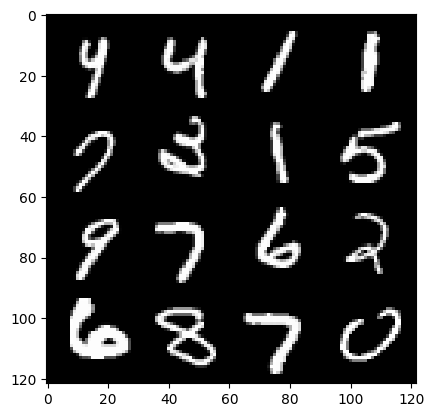

33: step 15600/ Gen loss: 4.079199760754905 / Disc loss: 0.08822199179480474
stepped in to the loop


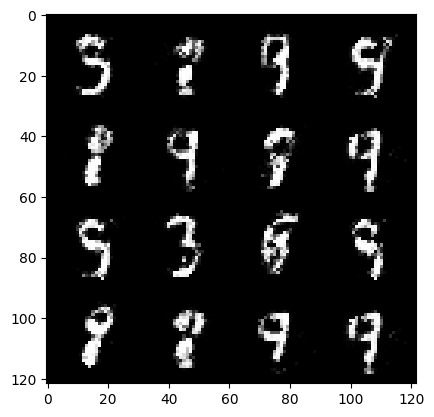

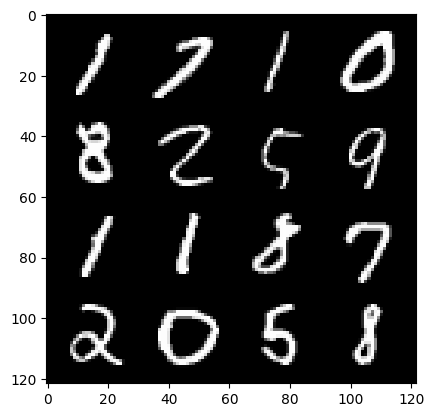

33: step 15900/ Gen loss: 4.2145601240793855 / Disc loss: 0.09528057351708412


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


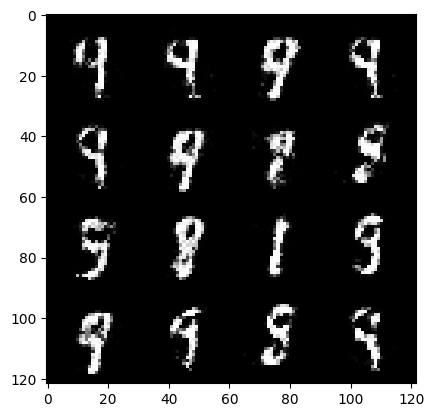

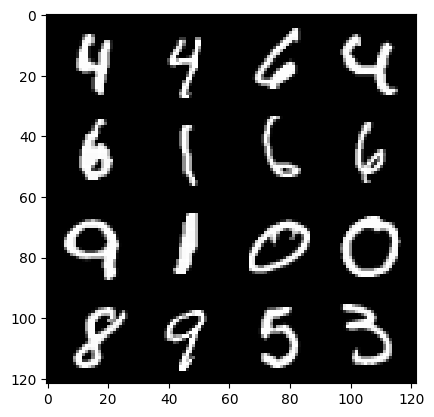

34: step 16200/ Gen loss: 4.126018190383908 / Disc loss: 0.10796489782631395


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


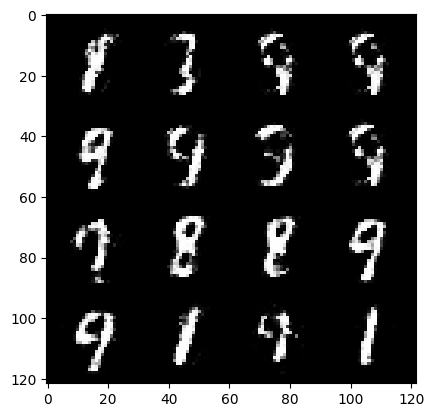

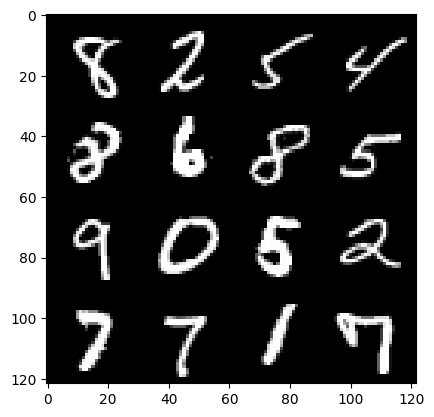

35: step 16500/ Gen loss: 4.052544252077741 / Disc loss: 0.11535633376489077
stepped in to the loop


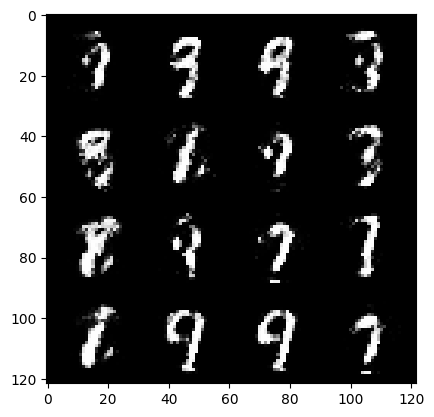

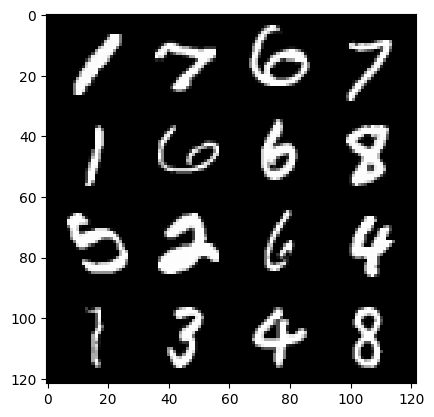

35: step 16800/ Gen loss: 3.9360889244079598 / Disc loss: 0.1138699084396163


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


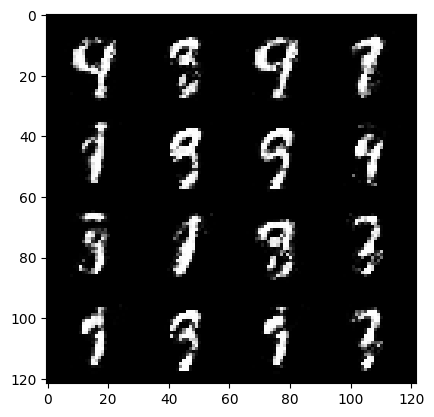

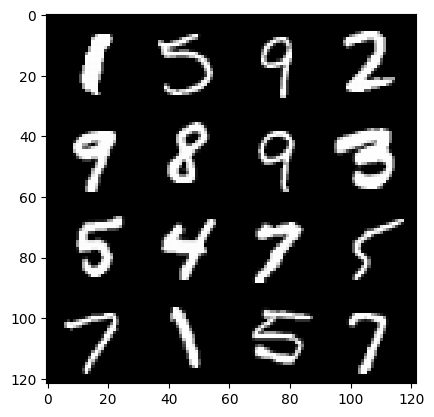

36: step 17100/ Gen loss: 3.7864839824040732 / Disc loss: 0.11050229368110497


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


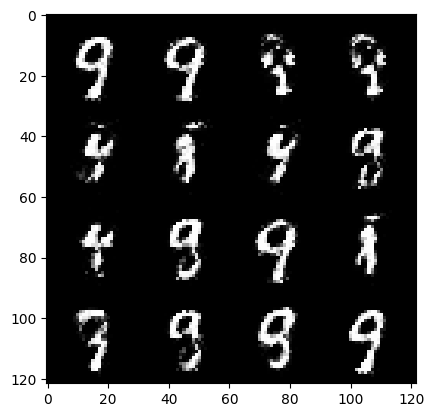

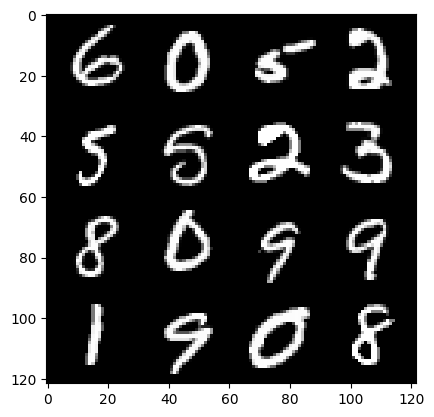

37: step 17400/ Gen loss: 3.949986547629041 / Disc loss: 0.10379454358170427
stepped in to the loop


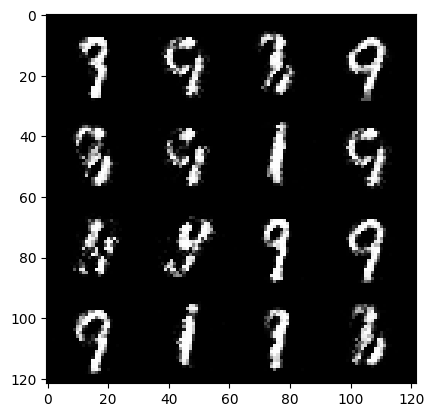

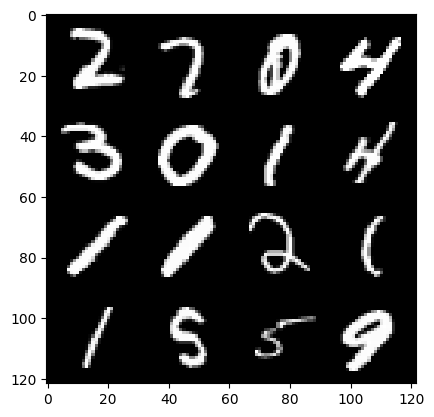

37: step 17700/ Gen loss: 3.9948702390988666 / Disc loss: 0.11398515682667498


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


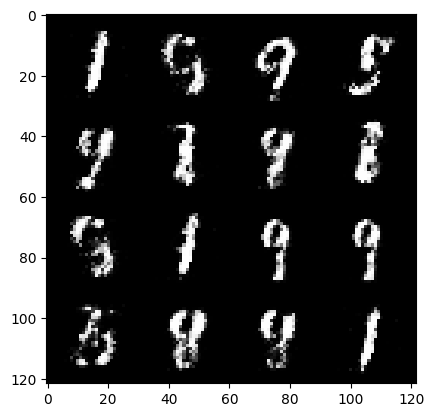

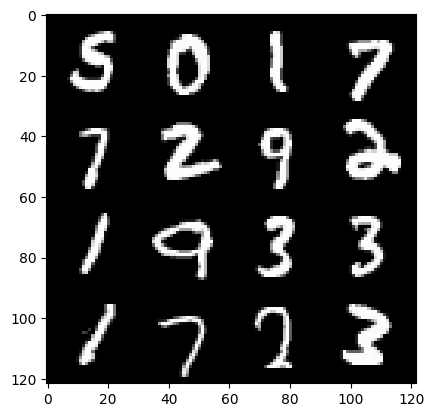

38: step 18000/ Gen loss: 3.904584004084268 / Disc loss: 0.12800404359896975


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


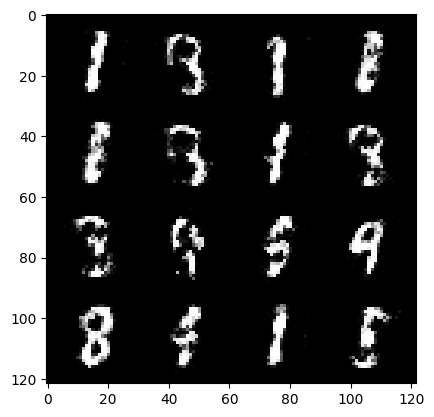

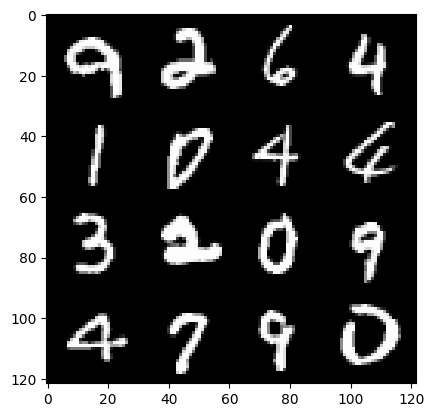

39: step 18300/ Gen loss: 3.8839380327860518 / Disc loss: 0.1195875436191757
stepped in to the loop


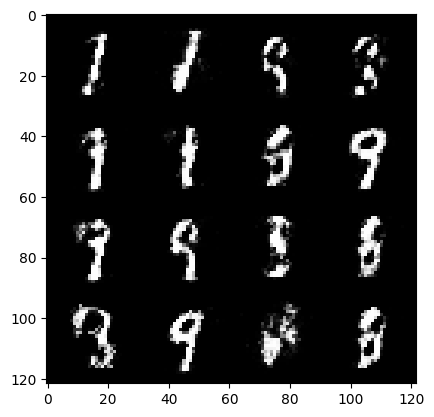

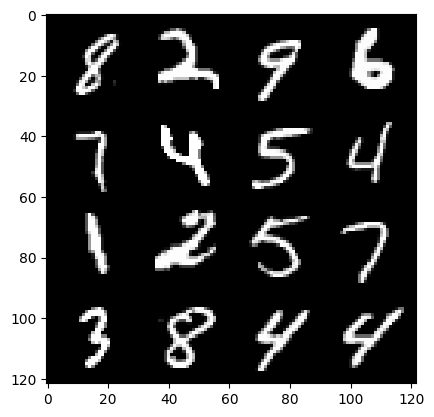

39: step 18600/ Gen loss: 3.8253235665957135 / Disc loss: 0.1311326717585325


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


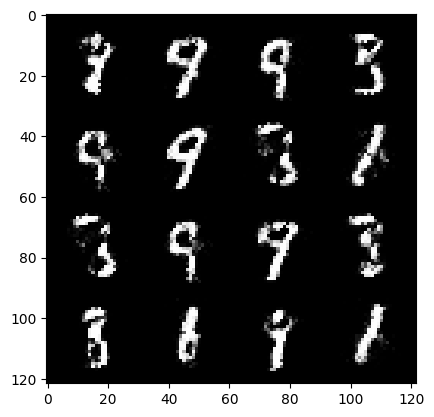

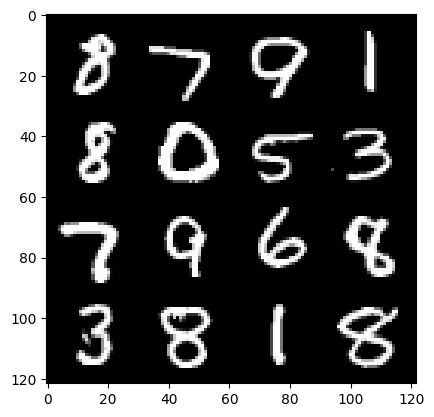

40: step 18900/ Gen loss: 3.546572135289512 / Disc loss: 0.1472457543512185
stepped in to the loop


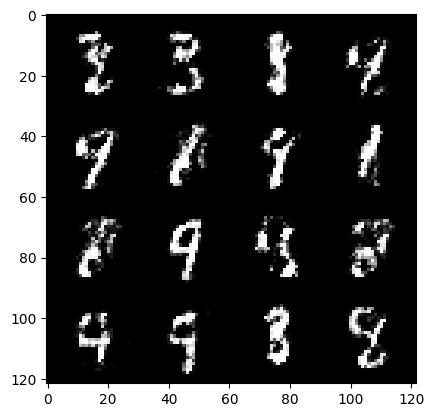

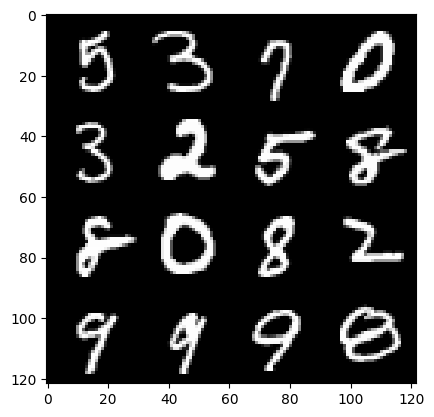

40: step 19200/ Gen loss: 3.6327045607566837 / Disc loss: 0.1265482947727045


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


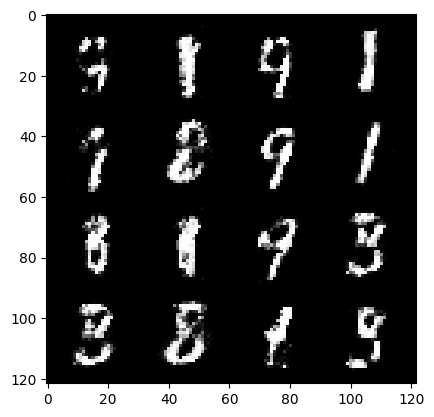

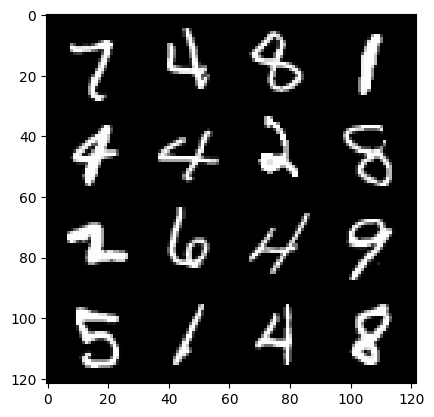

41: step 19500/ Gen loss: 3.640787413120271 / Disc loss: 0.13038987538466856


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


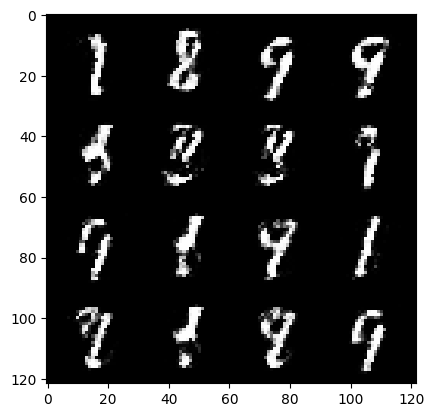

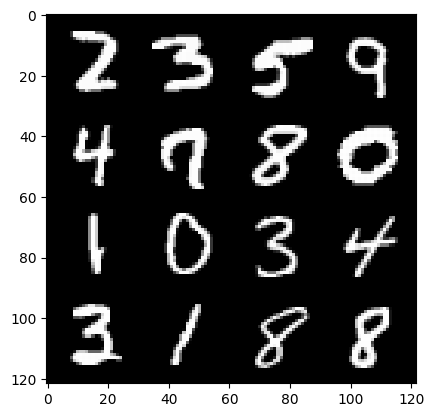

42: step 19800/ Gen loss: 3.6493956263860086 / Disc loss: 0.13407416241864362
stepped in to the loop


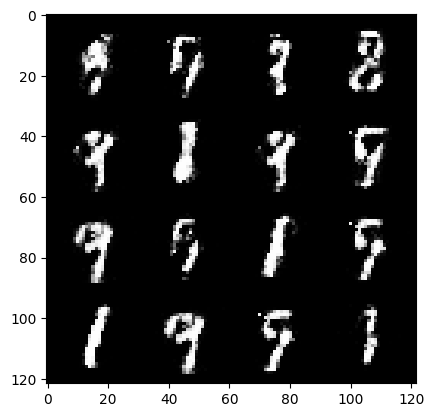

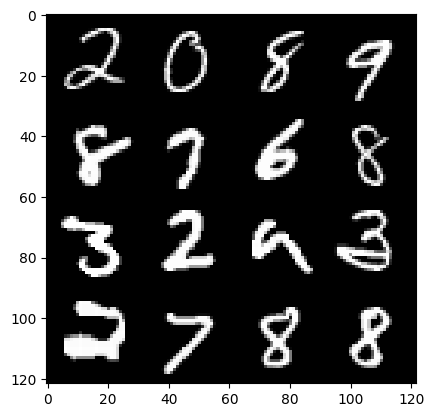

42: step 20100/ Gen loss: 3.318651187419892 / Disc loss: 0.1716979687660932


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


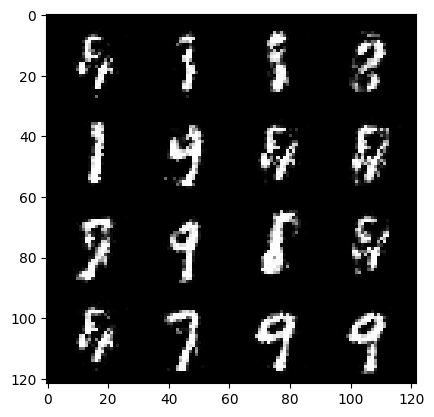

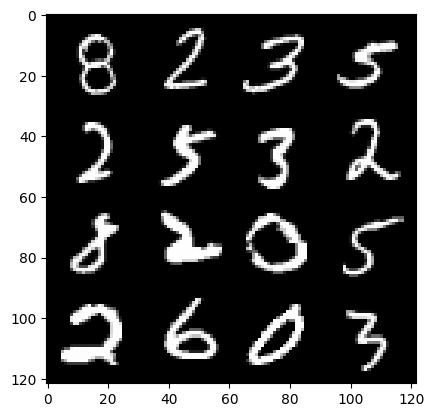

43: step 20400/ Gen loss: 3.407615606784821 / Disc loss: 0.15521553893884024


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


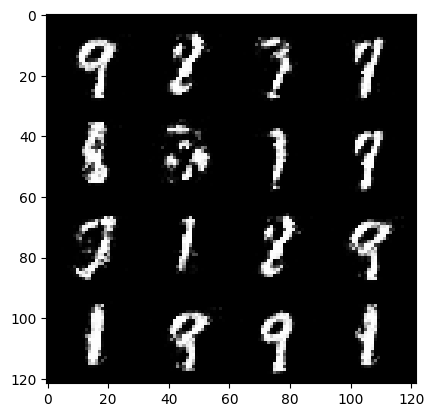

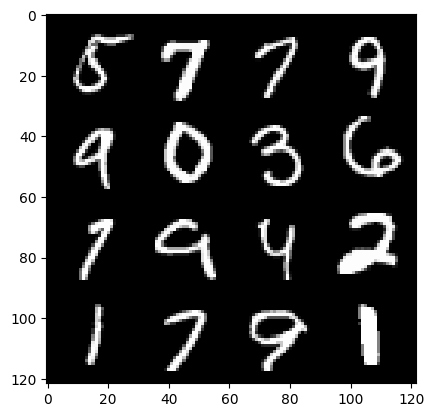

44: step 20700/ Gen loss: 3.669522876739502 / Disc loss: 0.14527102359881006
stepped in to the loop


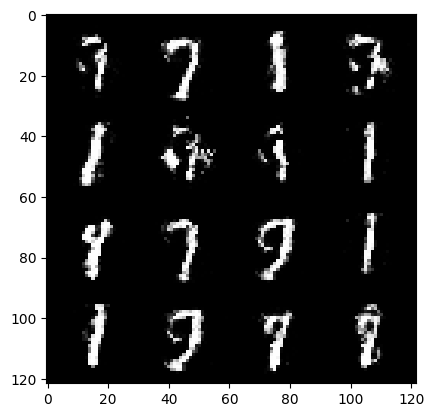

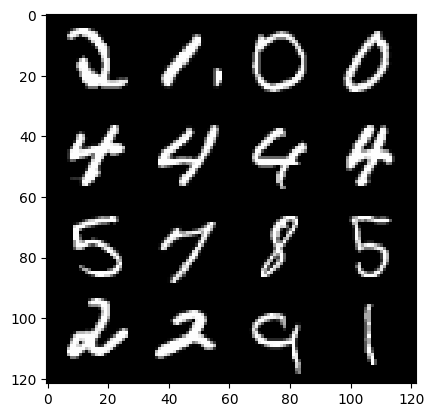

44: step 21000/ Gen loss: 3.496436734994252 / Disc loss: 0.14289582346876473


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


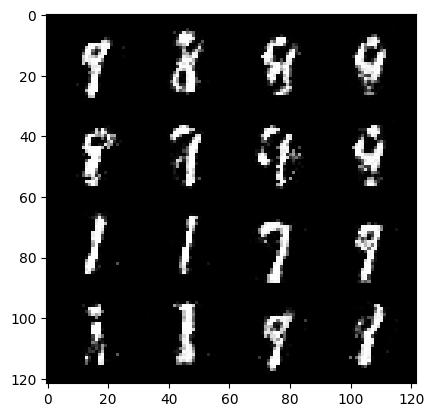

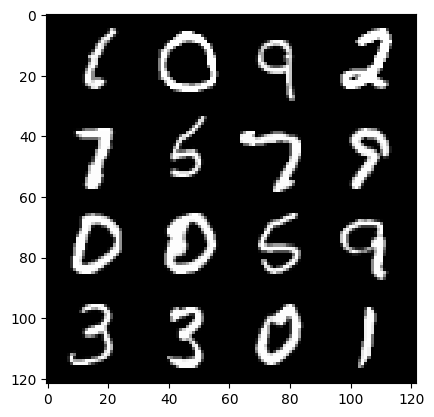

45: step 21300/ Gen loss: 3.5617000309626285 / Disc loss: 0.13952086776494976


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


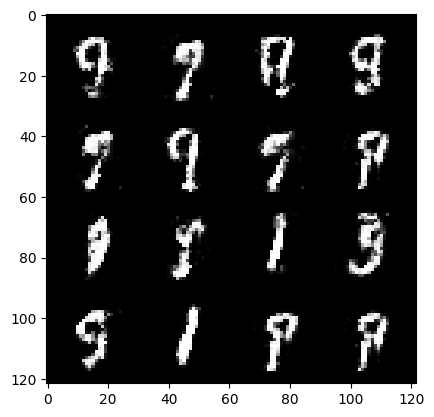

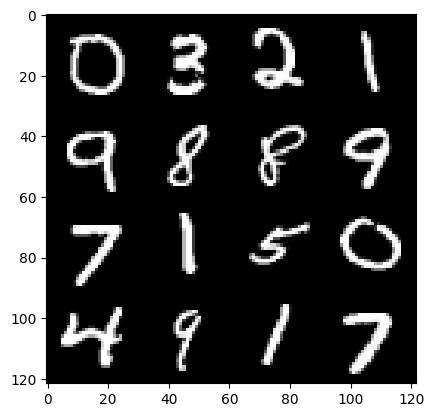

46: step 21600/ Gen loss: 3.431892459392546 / Disc loss: 0.14939124347021168
stepped in to the loop


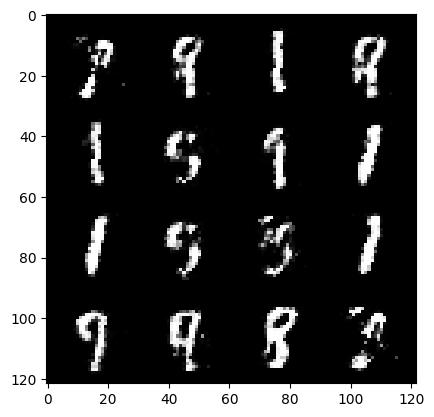

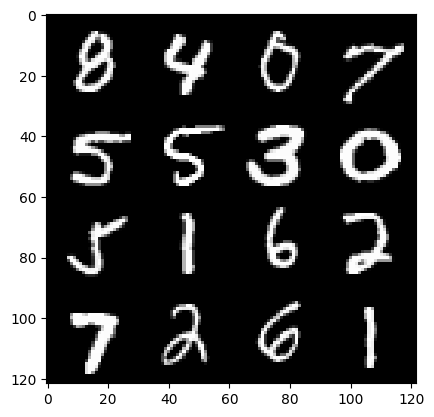

46: step 21900/ Gen loss: 3.2564345399538683 / Disc loss: 0.1667957631250223


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


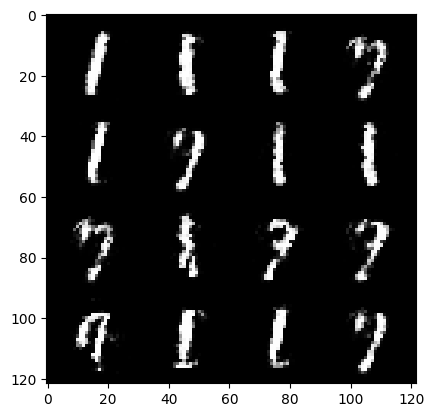

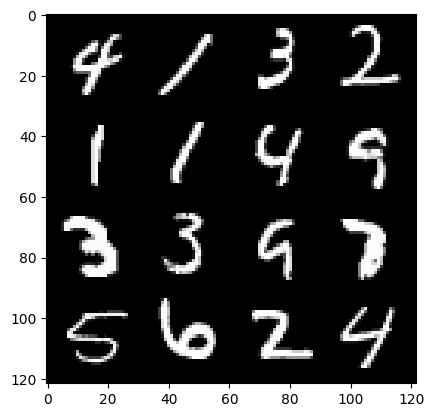

47: step 22200/ Gen loss: 3.2992710653940867 / Disc loss: 0.15984449212749796
stepped in to the loop


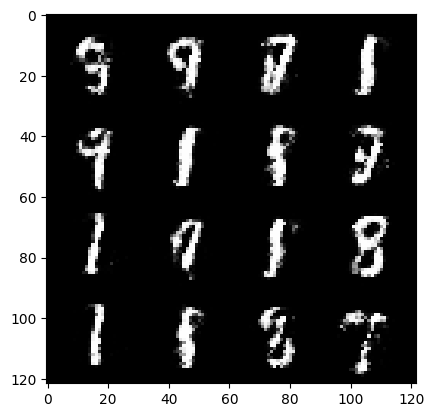

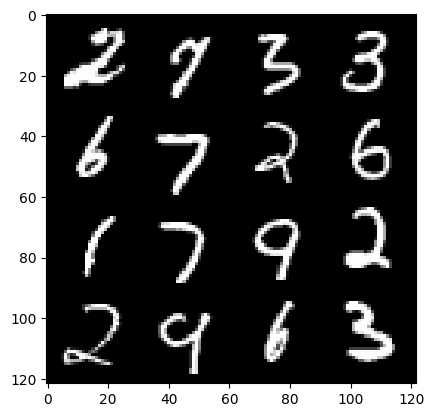

47: step 22500/ Gen loss: 3.25642543554306 / Disc loss: 0.16469324347873524


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


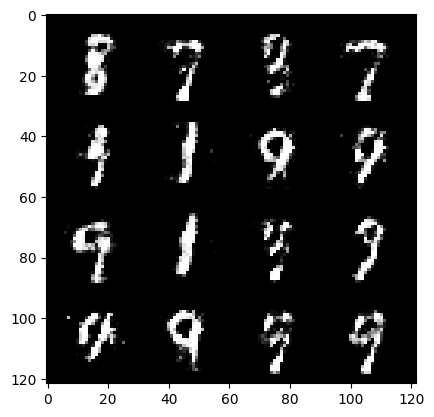

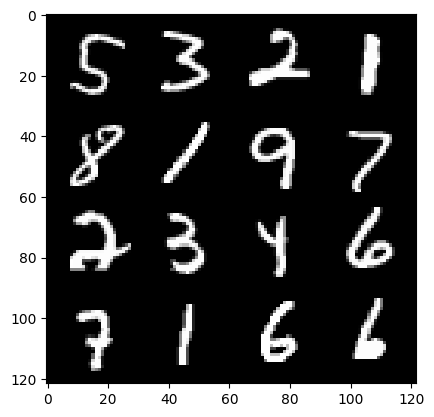

48: step 22800/ Gen loss: 3.1759244656562817 / Disc loss: 0.16473179588715225


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


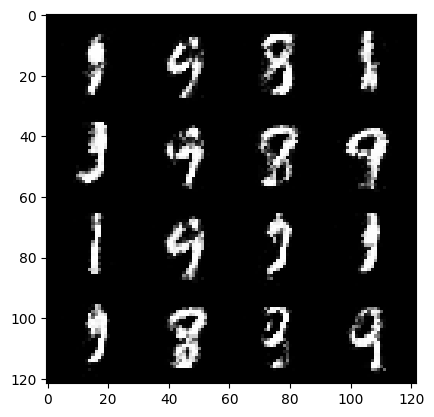

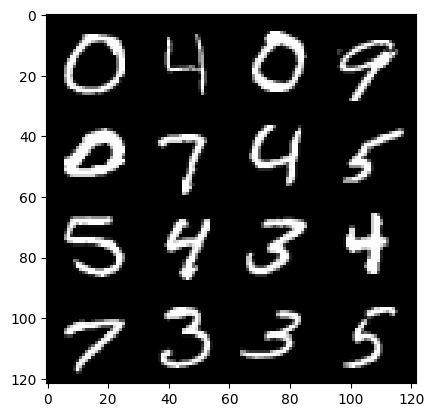

49: step 23100/ Gen loss: 3.178728501001995 / Disc loss: 0.16685064603885022
stepped in to the loop


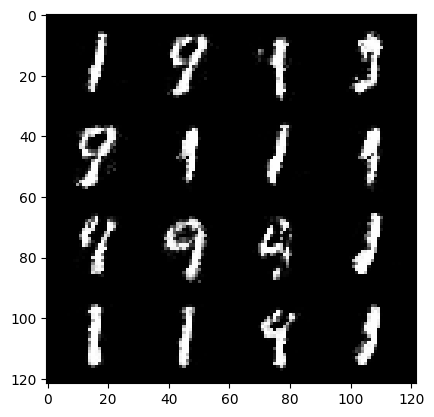

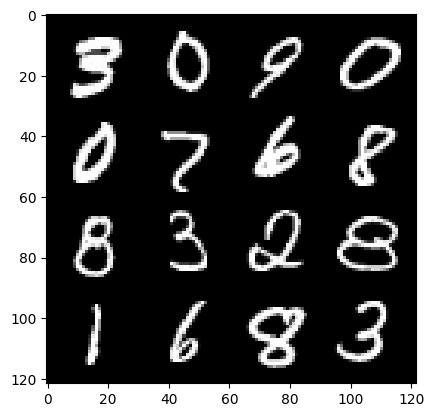

49: step 23400/ Gen loss: 3.0104173898696893 / Disc loss: 0.1796880623946588


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


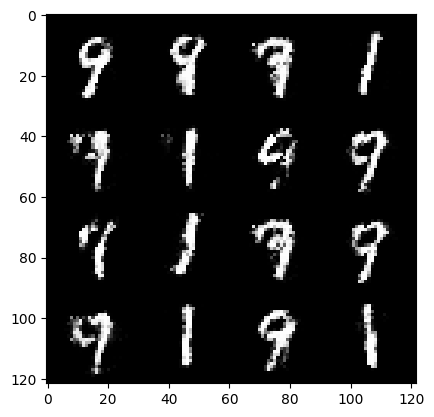

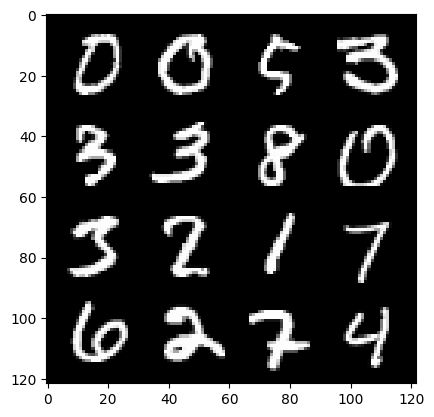

50: step 23700/ Gen loss: 3.2027608124415083 / Disc loss: 0.15682769419004527


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


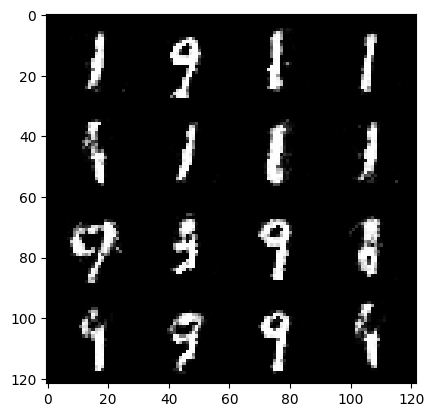

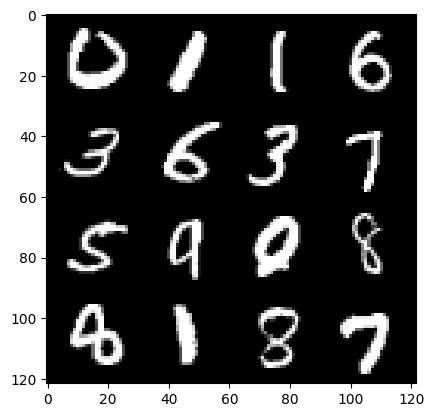

51: step 24000/ Gen loss: 3.087592597802477 / Disc loss: 0.1901234264175097
stepped in to the loop


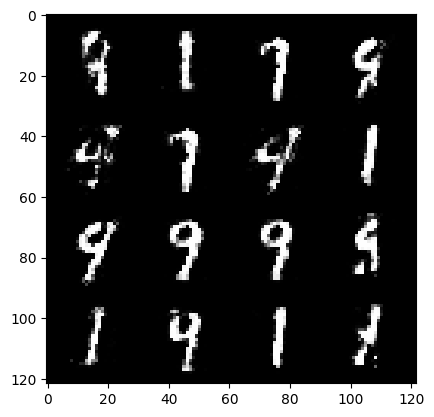

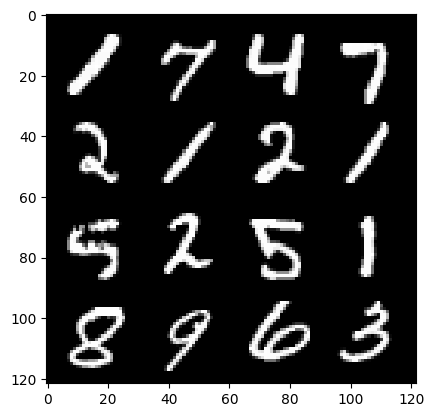

51: step 24300/ Gen loss: 2.9149291054407733 / Disc loss: 0.2047915833691757


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


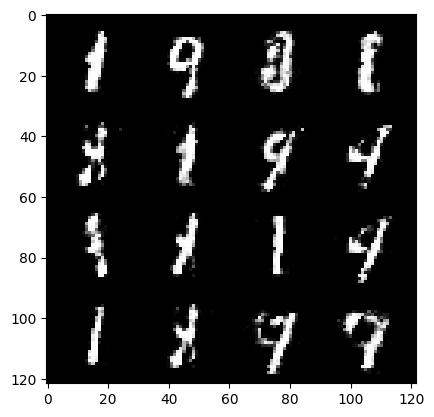

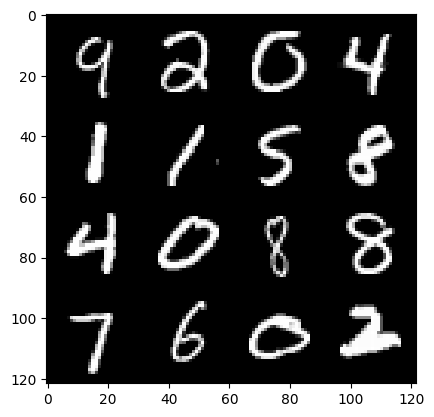

52: step 24600/ Gen loss: 2.9051875495910653 / Disc loss: 0.19697034279505413


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


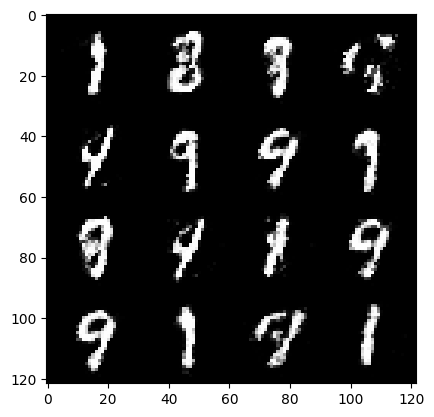

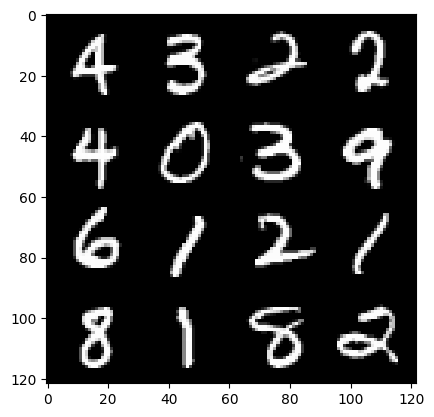

53: step 24900/ Gen loss: 2.8736045511563613 / Disc loss: 0.20656024945278953
stepped in to the loop


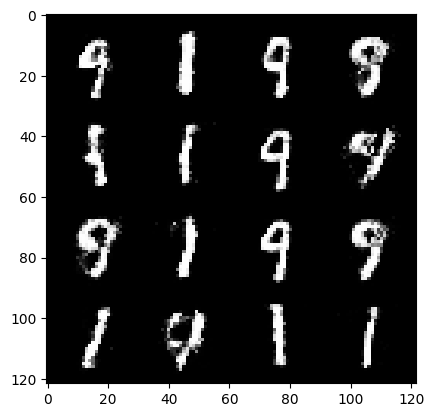

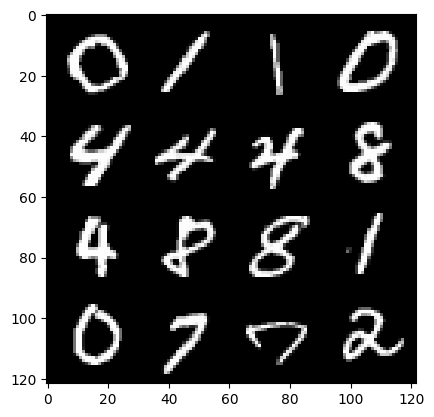

53: step 25200/ Gen loss: 2.8774783253669747 / Disc loss: 0.19742646607259906


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


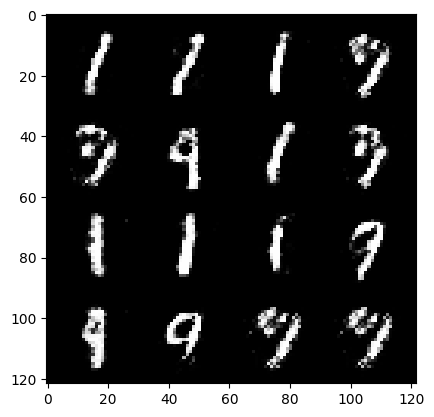

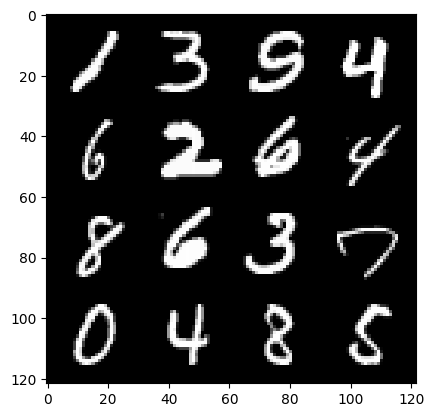

54: step 25500/ Gen loss: 2.826917737325034 / Disc loss: 0.20580679729580864


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


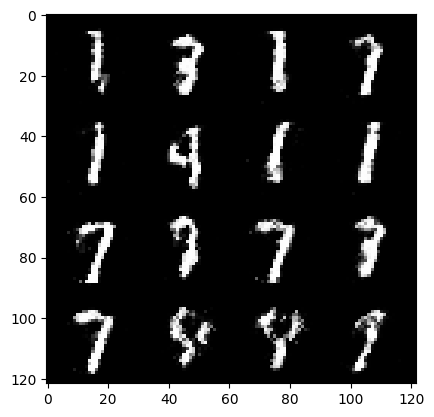

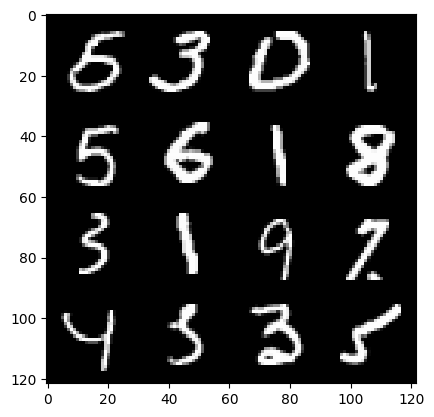

55: step 25800/ Gen loss: 2.900540044307709 / Disc loss: 0.19829842321574698
stepped in to the loop


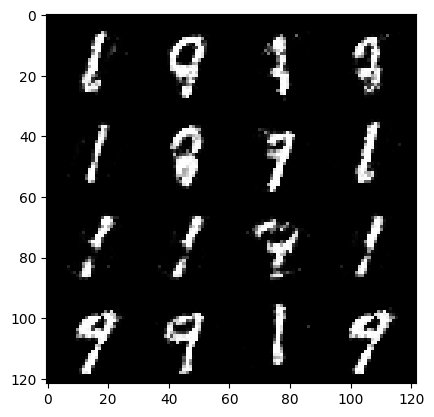

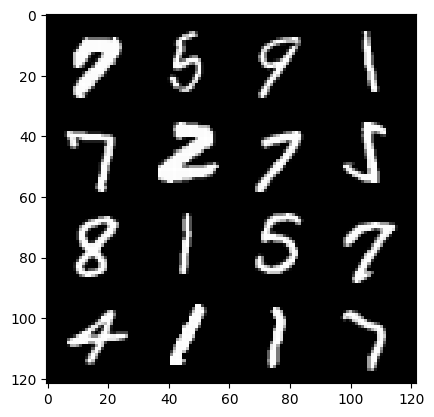

55: step 26100/ Gen loss: 2.7756867472330726 / Disc loss: 0.21144856770833337


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


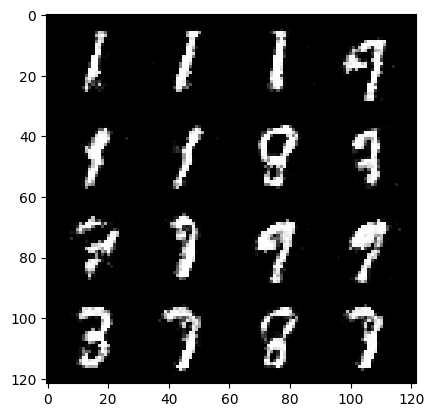

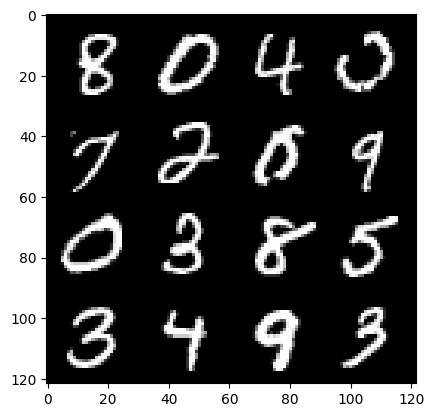

56: step 26400/ Gen loss: 2.7937349232037856 / Disc loss: 0.2109870974719523
stepped in to the loop


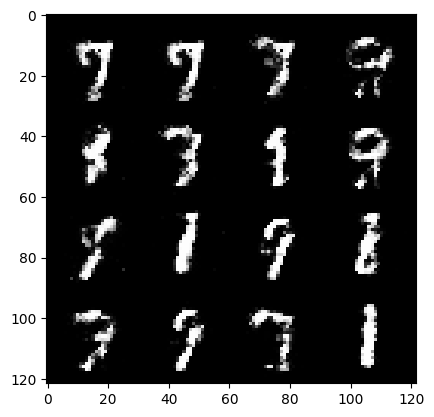

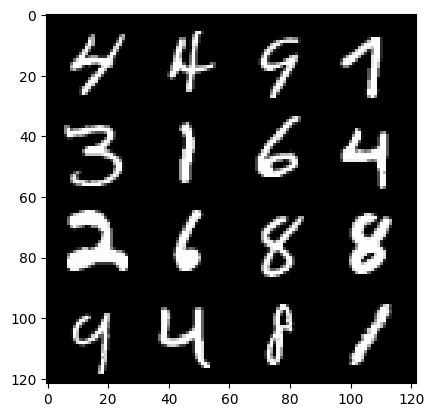

56: step 26700/ Gen loss: 2.7188279430071516 / Disc loss: 0.22847504590948417


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


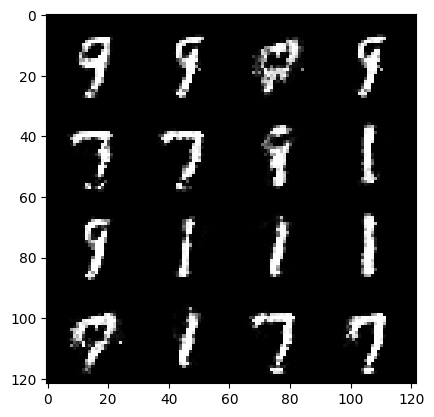

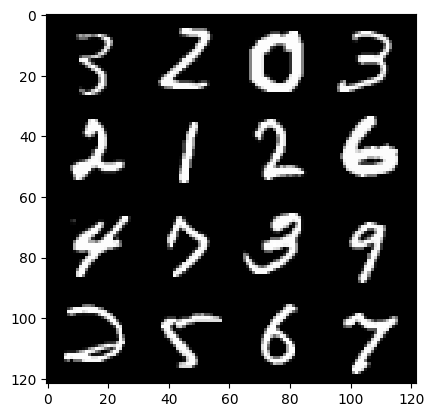

57: step 27000/ Gen loss: 2.7777747853597 / Disc loss: 0.20963483343521744


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


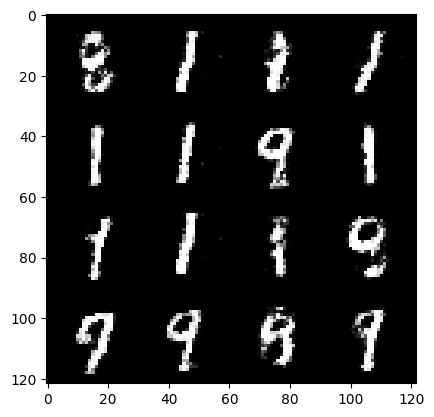

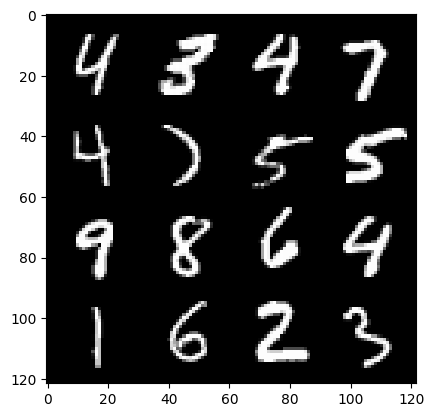

58: step 27300/ Gen loss: 2.8197191842397076 / Disc loss: 0.2019915239264568
stepped in to the loop


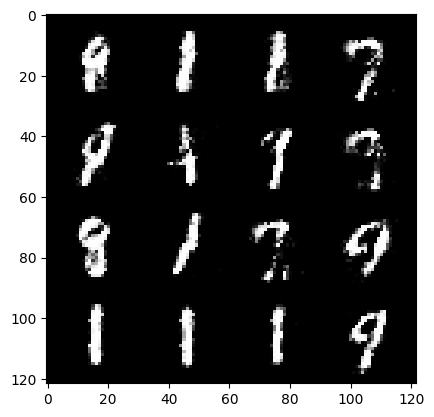

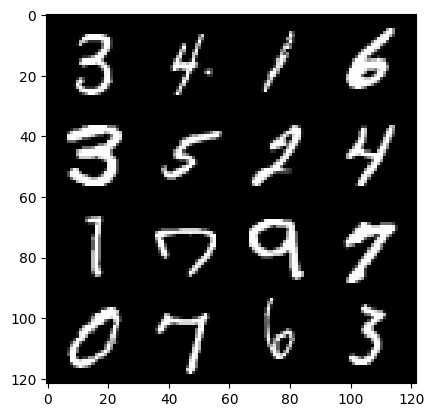

58: step 27600/ Gen loss: 2.739460330804189 / Disc loss: 0.20764338572820026


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


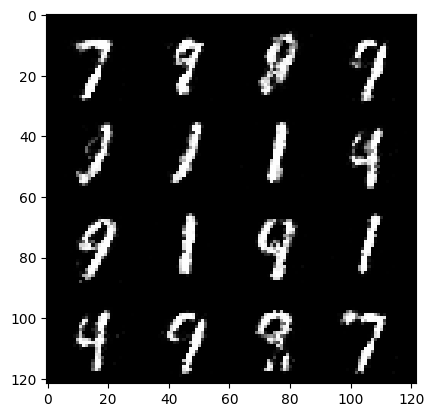

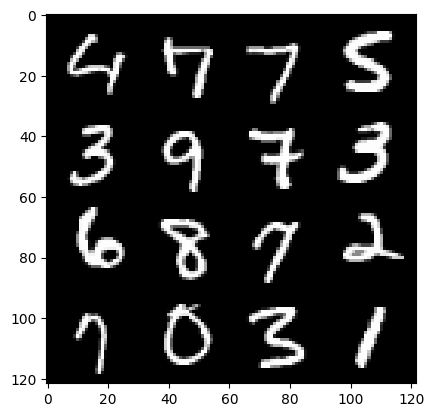

59: step 27900/ Gen loss: 2.7296046757698065 / Disc loss: 0.21069278498490657


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


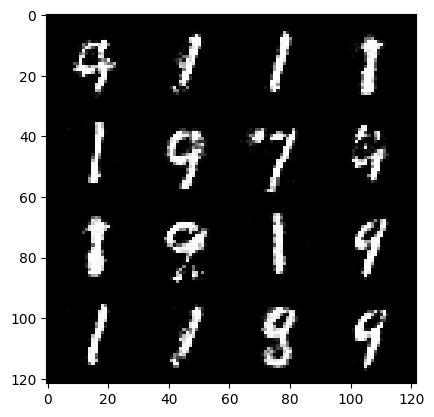

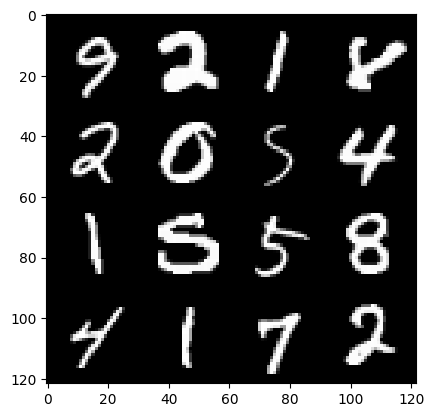

60: step 28200/ Gen loss: 2.6390674805641186 / Disc loss: 0.21900130718946448
stepped in to the loop


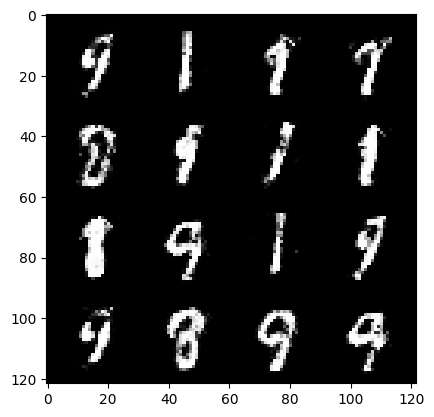

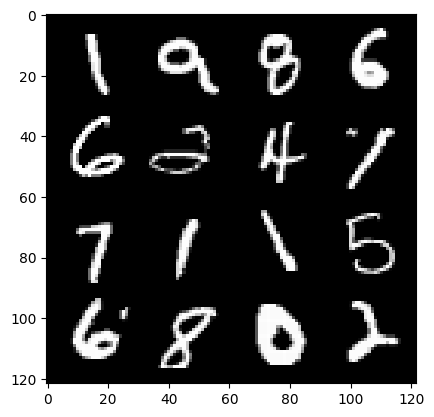

60: step 28500/ Gen loss: 2.631001651287079 / Disc loss: 0.21585255319873486


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


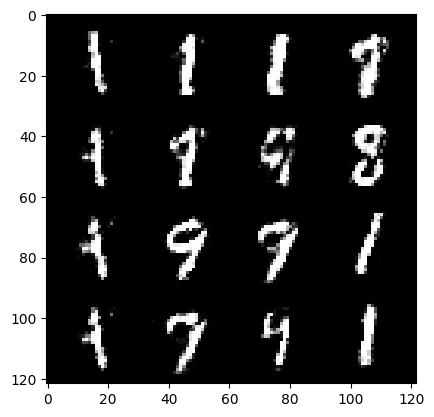

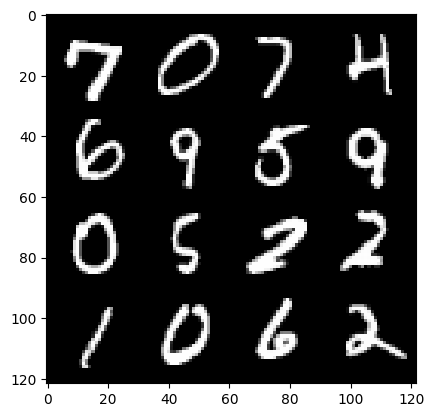

61: step 28800/ Gen loss: 2.601800142923991 / Disc loss: 0.21986857915918034


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


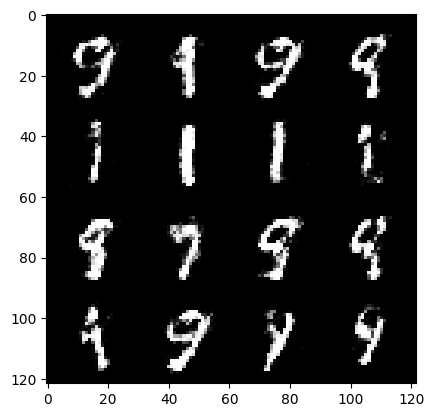

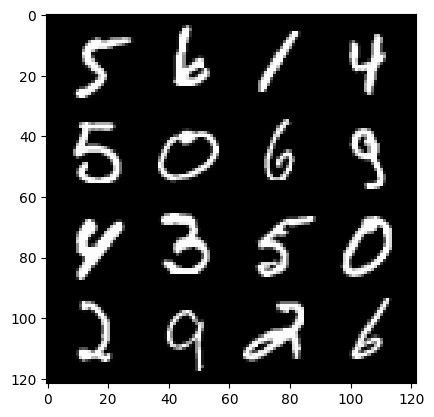

62: step 29100/ Gen loss: 2.538932388226194 / Disc loss: 0.2288152840236823
stepped in to the loop


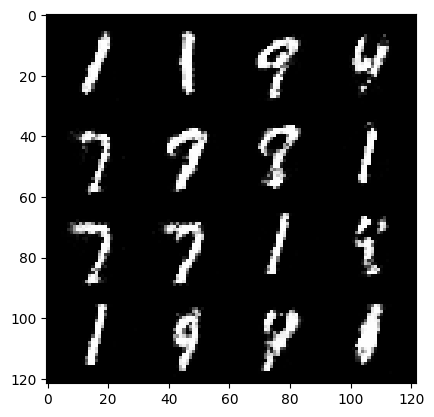

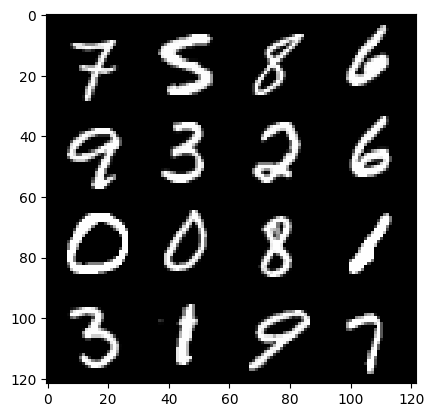

62: step 29400/ Gen loss: 2.5974782141049686 / Disc loss: 0.22207787103950982


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


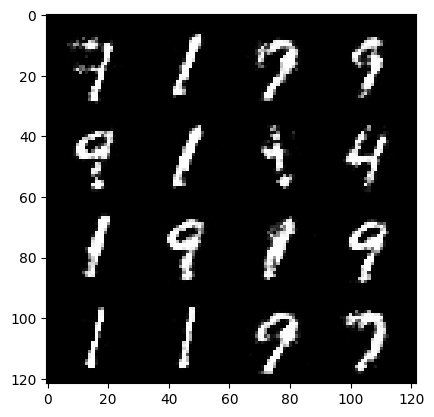

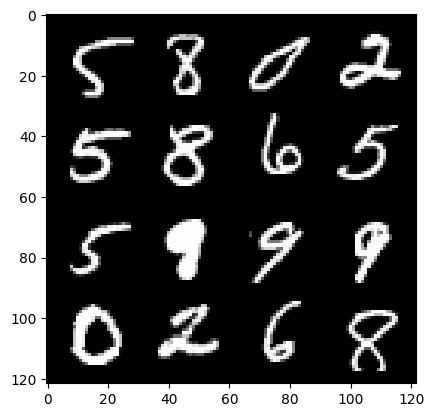

63: step 29700/ Gen loss: 2.486388095617293 / Disc loss: 0.24244042217731493
stepped in to the loop


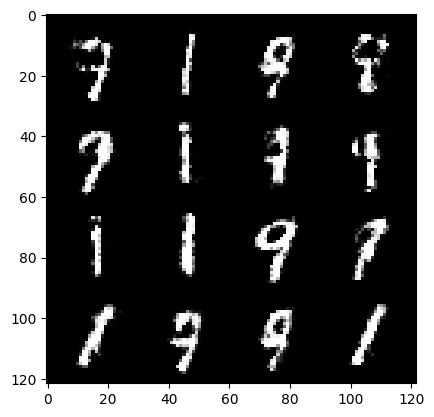

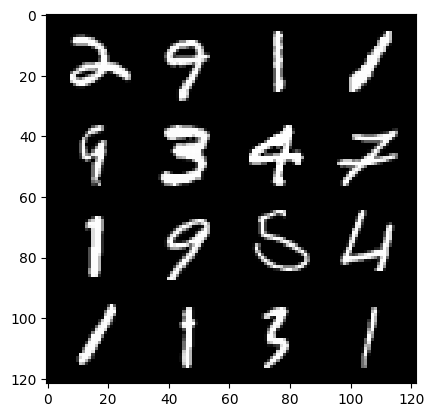

63: step 30000/ Gen loss: 2.5104414327939346 / Disc loss: 0.2248429937660695


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


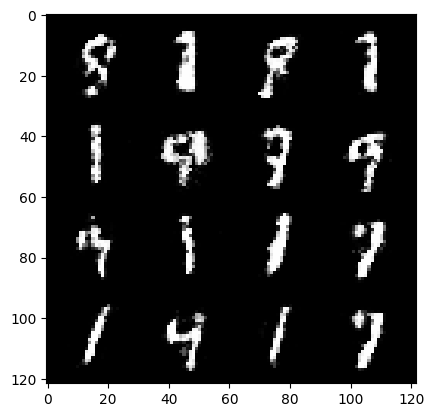

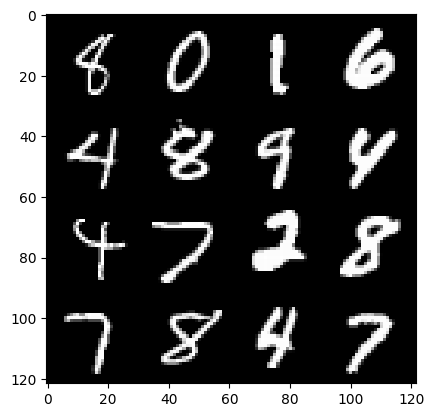

64: step 30300/ Gen loss: 2.450807540416717 / Disc loss: 0.2252103005846342


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


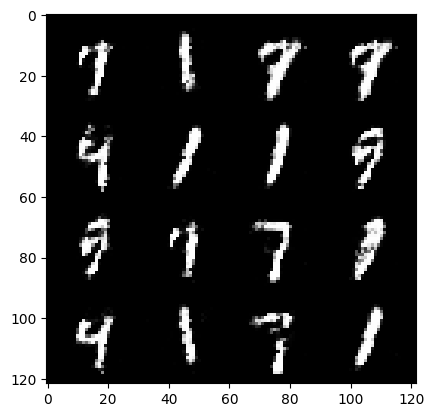

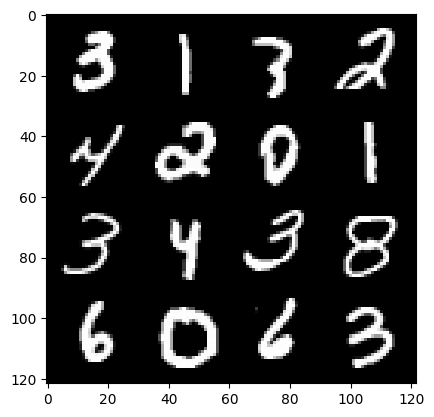

65: step 30600/ Gen loss: 2.392408446470897 / Disc loss: 0.23625033343831714
stepped in to the loop


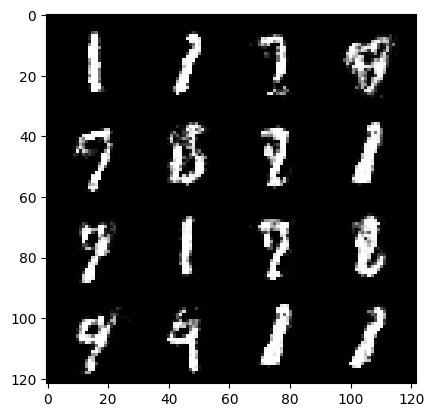

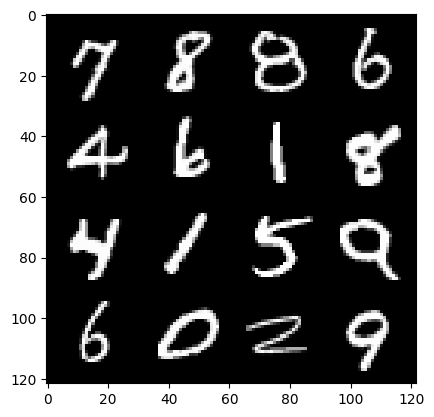

65: step 30900/ Gen loss: 2.3804172754287727 / Disc loss: 0.2502572686970233


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


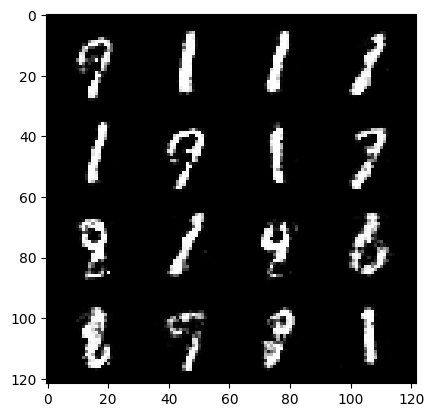

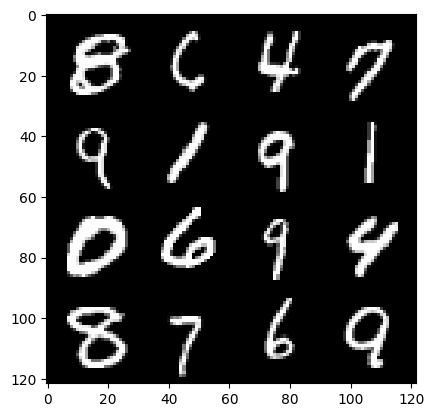

66: step 31200/ Gen loss: 2.3742803307374323 / Disc loss: 0.25322332188487057


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


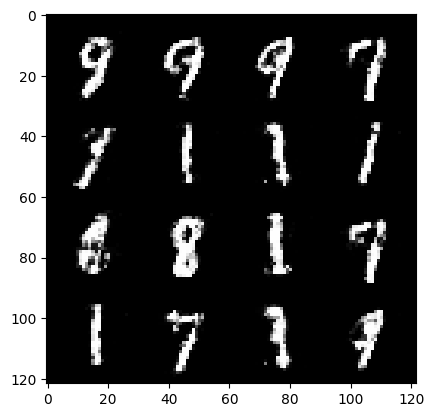

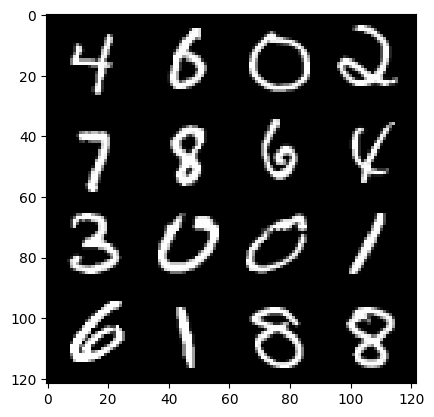

67: step 31500/ Gen loss: 2.3966900726159417 / Disc loss: 0.238385066340367
stepped in to the loop


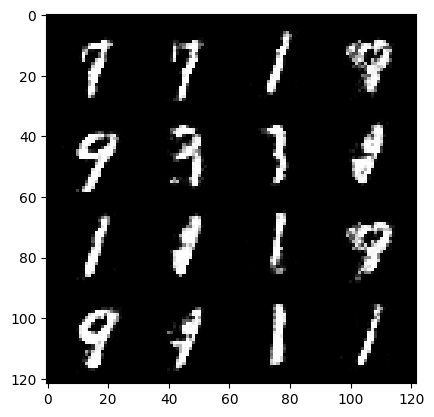

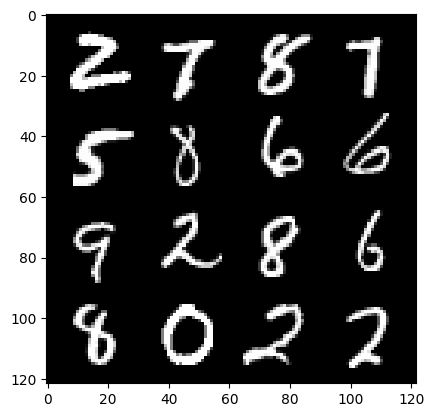

67: step 31800/ Gen loss: 2.318604170481366 / Disc loss: 0.24891933053731927


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


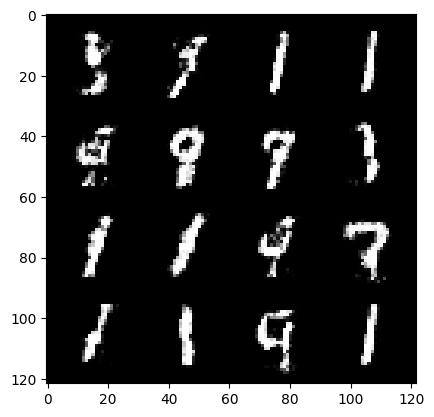

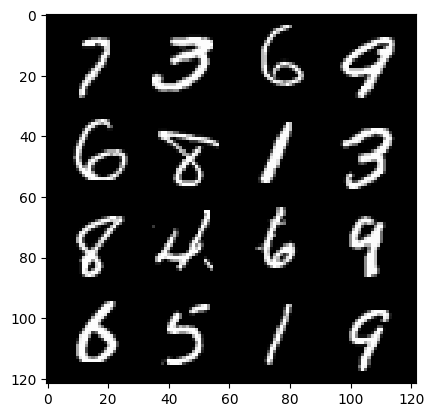

68: step 32100/ Gen loss: 2.361781774361928 / Disc loss: 0.2355317690968514


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


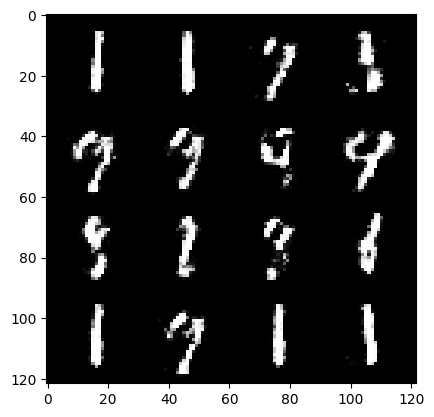

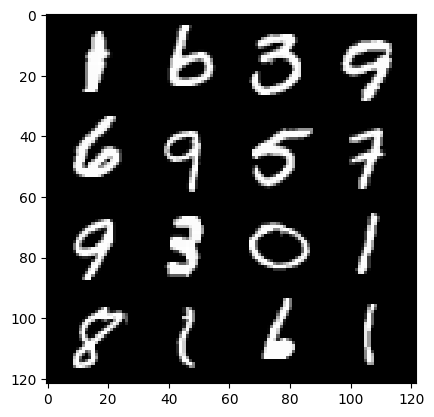

69: step 32400/ Gen loss: 2.3405392646789545 / Disc loss: 0.23521381855010973
stepped in to the loop


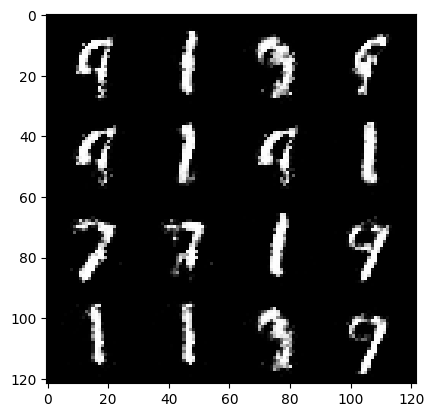

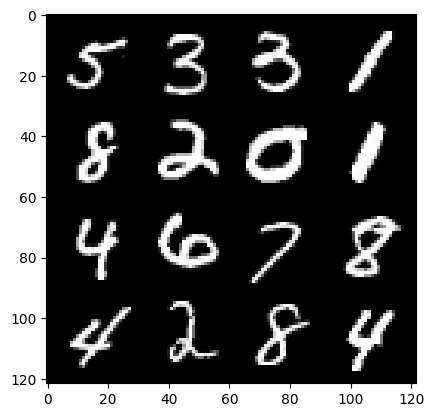

69: step 32700/ Gen loss: 2.4578164867560073 / Disc loss: 0.2339209612707297


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


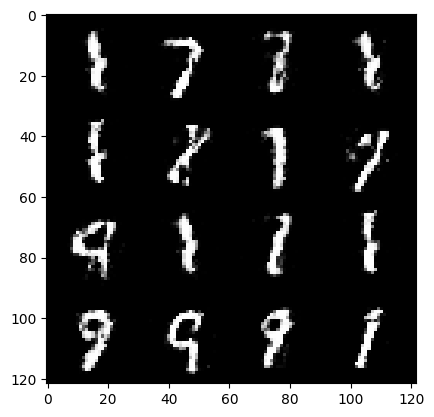

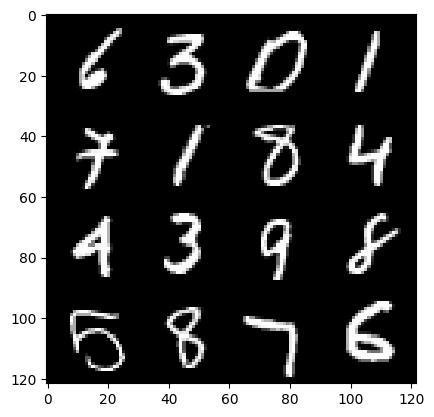

70: step 33000/ Gen loss: 2.5479390398661286 / Disc loss: 0.22058263803521805


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


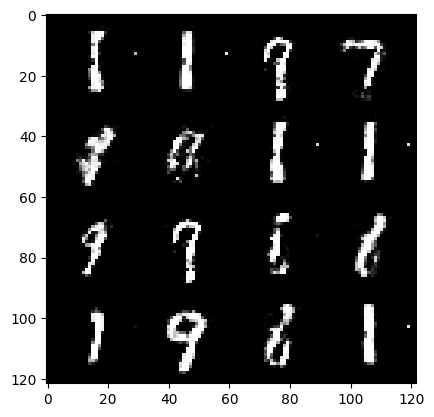

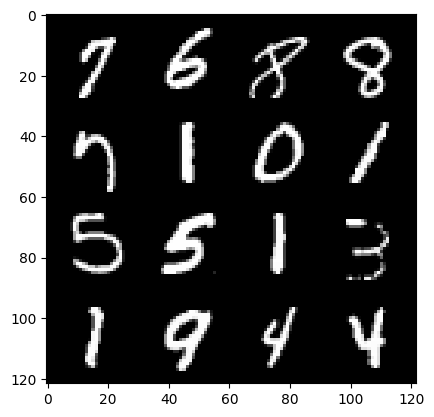

71: step 33300/ Gen loss: 2.411269948482514 / Disc loss: 0.23214089637001348
stepped in to the loop


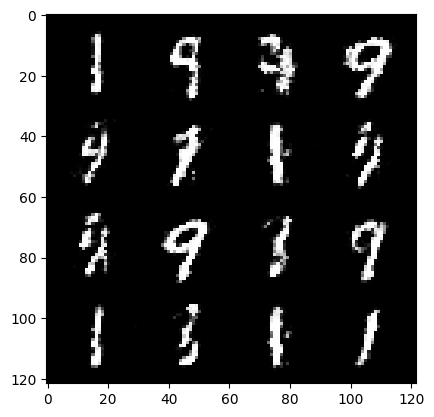

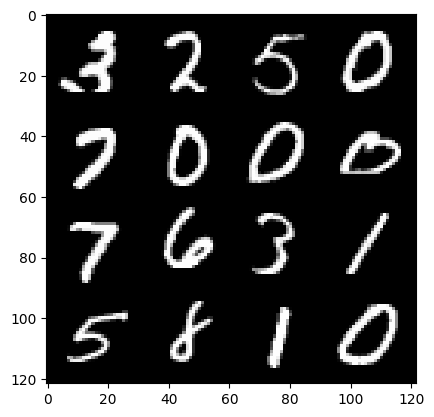

71: step 33600/ Gen loss: 2.4017281985282892 / Disc loss: 0.23079174871246025


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


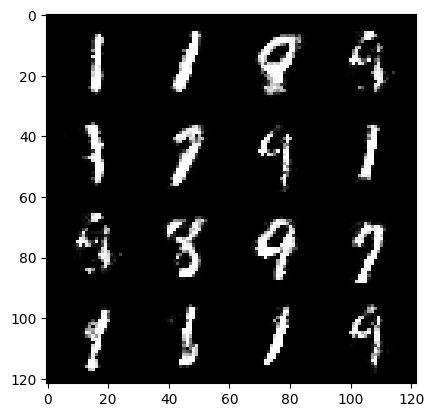

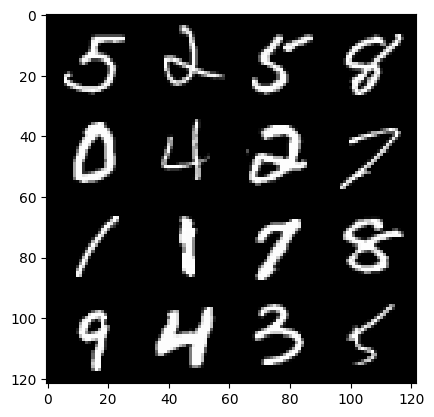

72: step 33900/ Gen loss: 2.3358292710781097 / Disc loss: 0.2517838488519191
stepped in to the loop


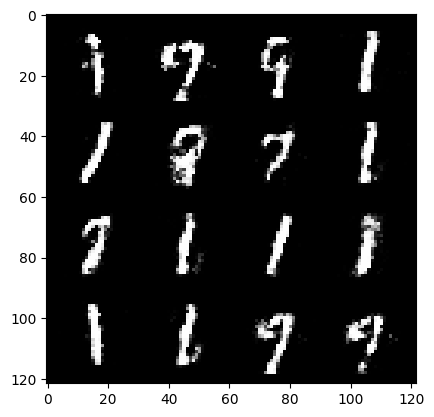

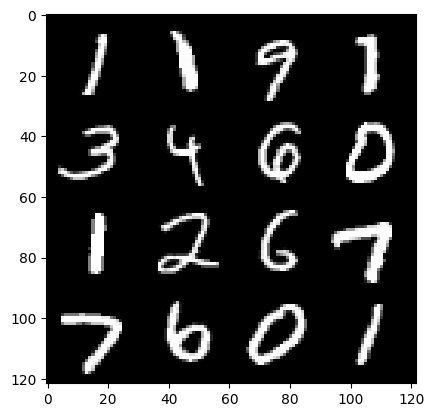

72: step 34200/ Gen loss: 2.230657193263371 / Disc loss: 0.2594318472842377


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


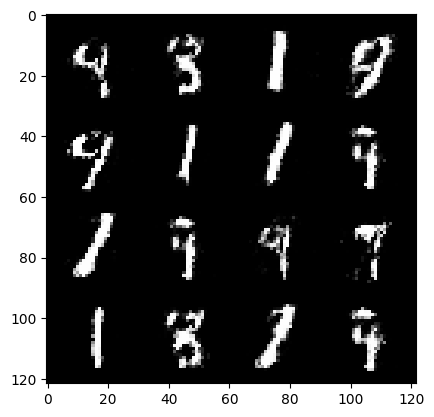

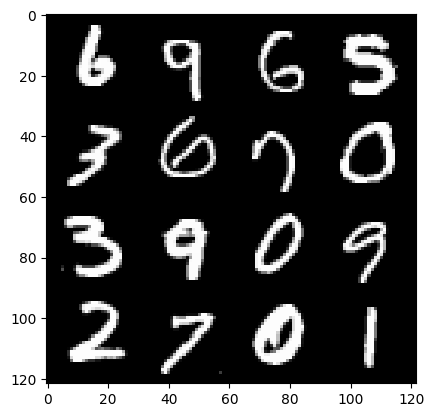

73: step 34500/ Gen loss: 2.4159353729089115 / Disc loss: 0.22481333374977103


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


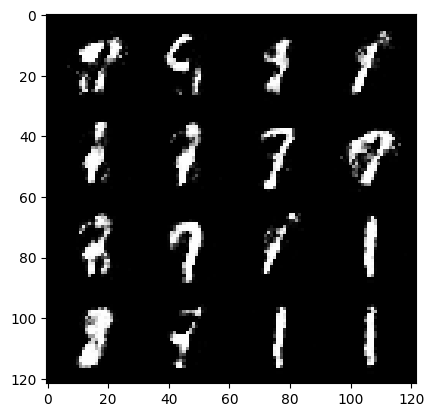

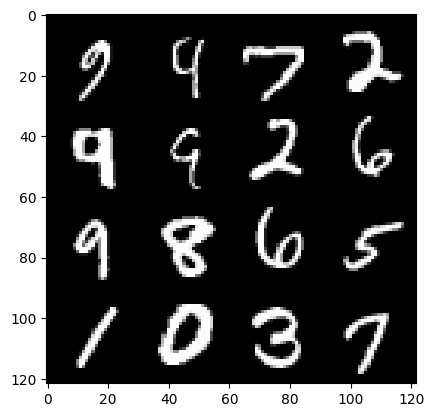

74: step 34800/ Gen loss: 2.2860557019710552 / Disc loss: 0.25216270744800573
stepped in to the loop


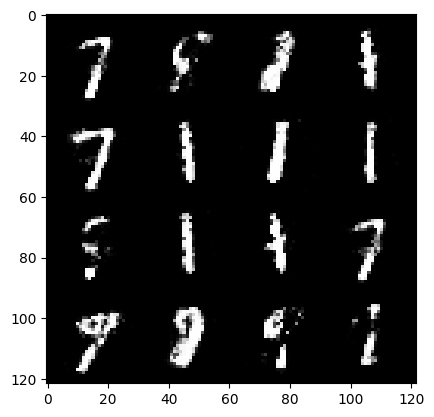

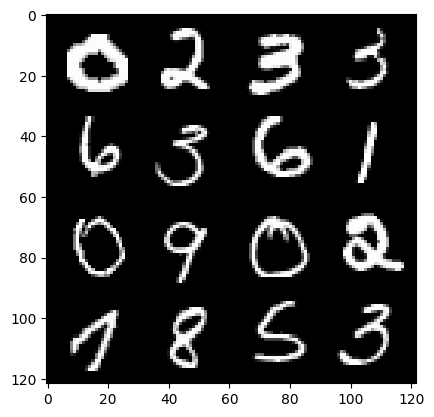

74: step 35100/ Gen loss: 2.2613789010047904 / Disc loss: 0.25563141117493315


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


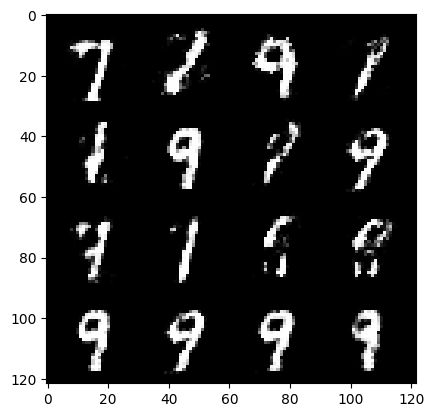

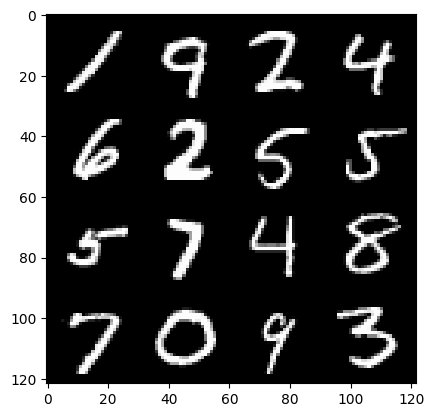

75: step 35400/ Gen loss: 2.174953748782476 / Disc loss: 0.26607527777552603


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


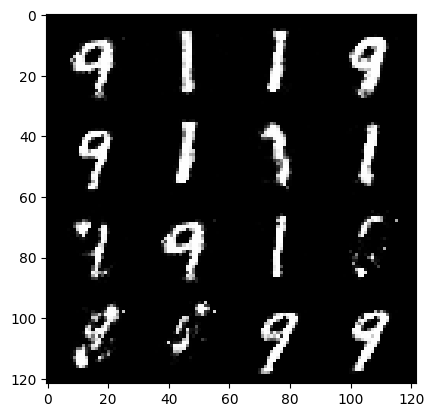

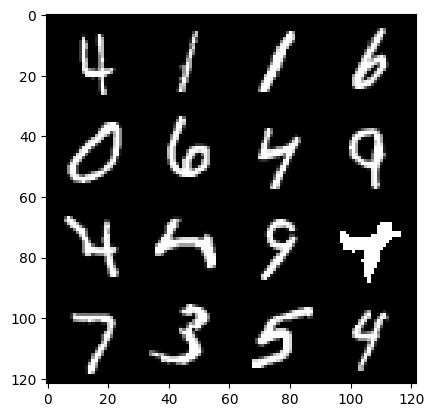

76: step 35700/ Gen loss: 2.230634886026382 / Disc loss: 0.24312399581074712
stepped in to the loop


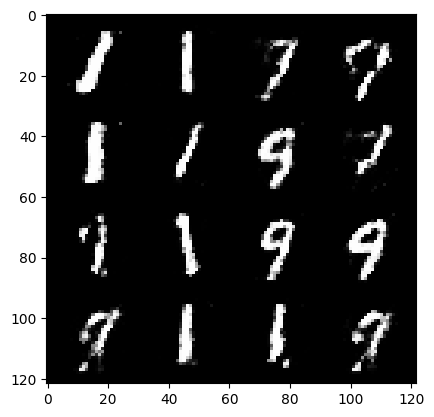

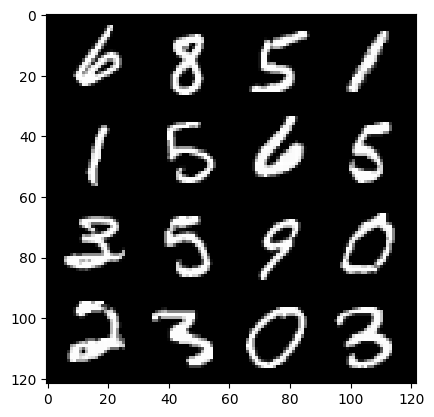

76: step 36000/ Gen loss: 2.2521544357140857 / Disc loss: 0.25441885118683183


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


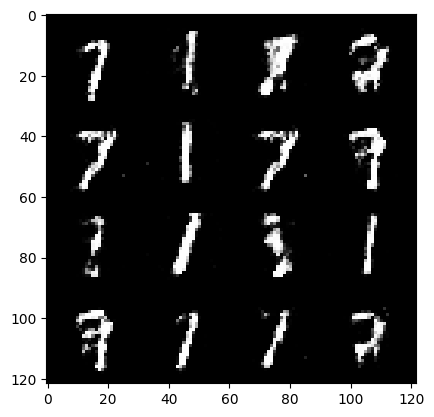

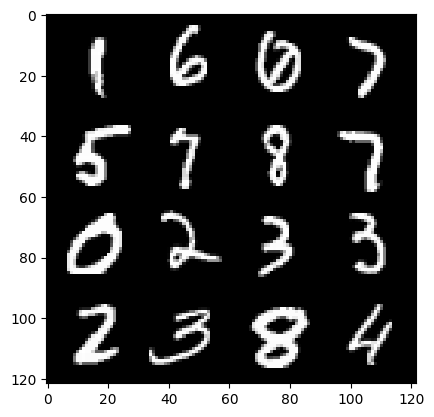

77: step 36300/ Gen loss: 2.1666786932945254 / Disc loss: 0.27774057403206814


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


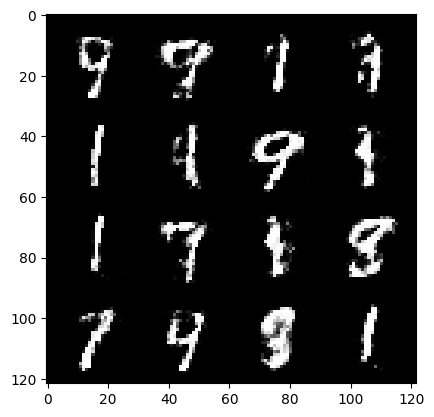

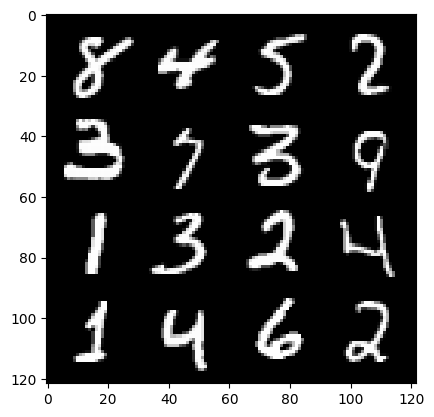

78: step 36600/ Gen loss: 2.18041263818741 / Disc loss: 0.26357531458139416
stepped in to the loop


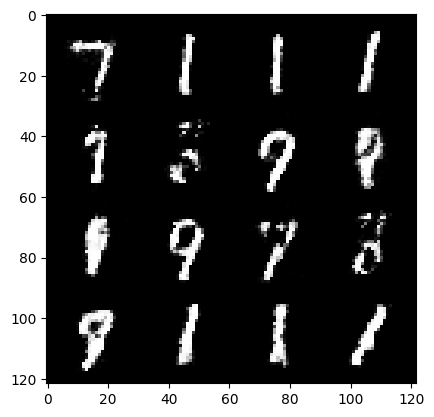

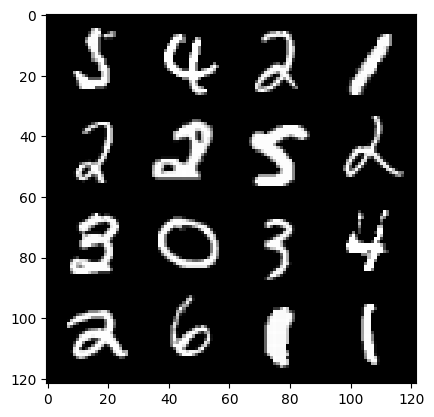

78: step 36900/ Gen loss: 2.2260012666384386 / Disc loss: 0.2558228486279647


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


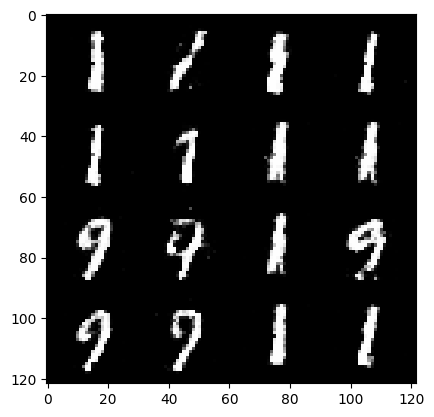

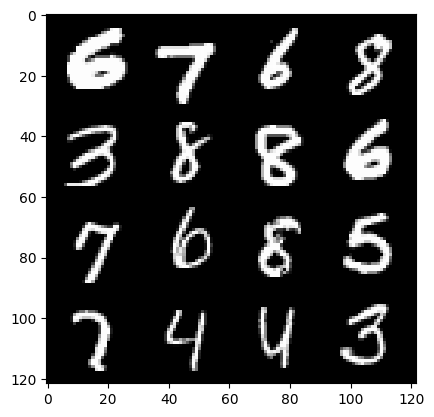

79: step 37200/ Gen loss: 2.174174373547235 / Disc loss: 0.2720414192974566
stepped in to the loop


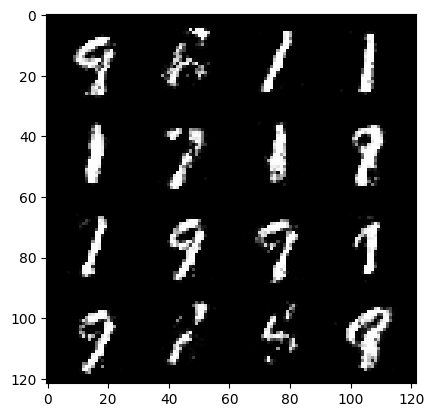

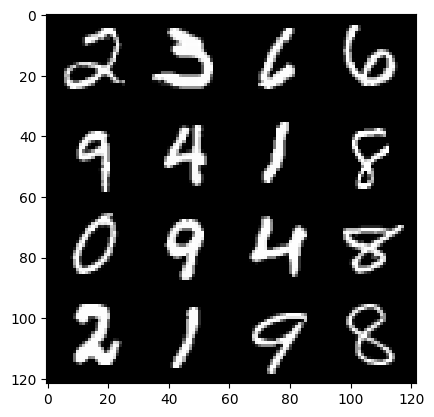

79: step 37500/ Gen loss: 2.293855784336726 / Disc loss: 0.24227035393317548


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


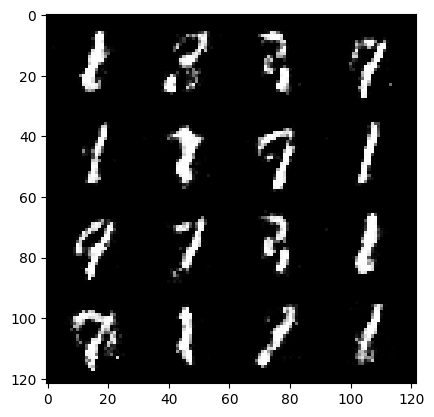

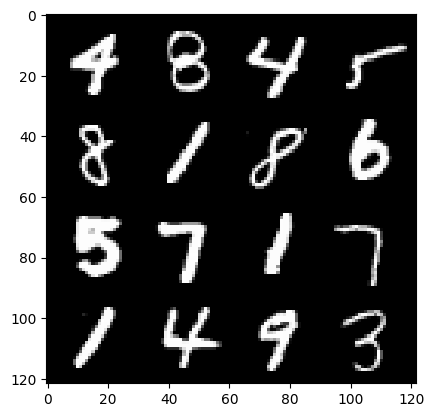

80: step 37800/ Gen loss: 2.352442208528517 / Disc loss: 0.2517072863876819


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


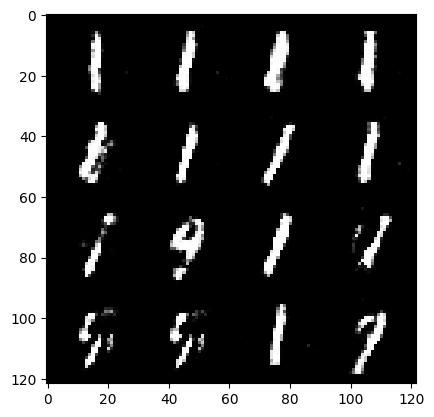

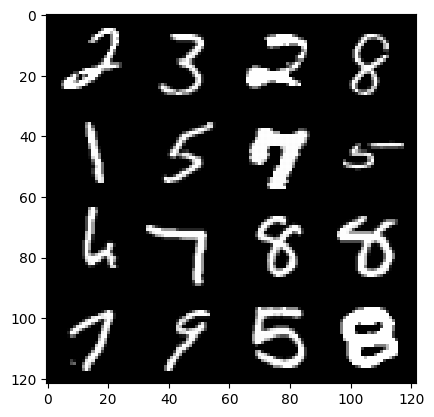

81: step 38100/ Gen loss: 2.142724161148071 / Disc loss: 0.266157607237498
stepped in to the loop


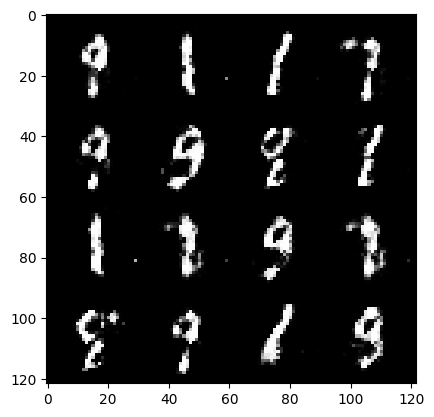

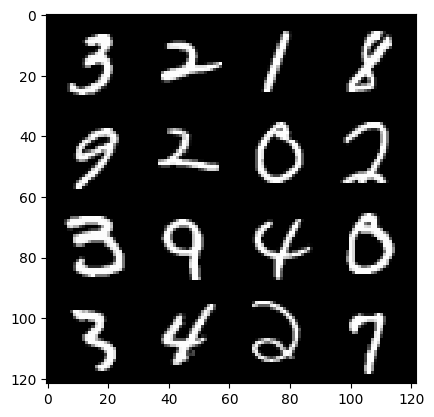

81: step 38400/ Gen loss: 2.1197357368469243 / Disc loss: 0.2998867831130825


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


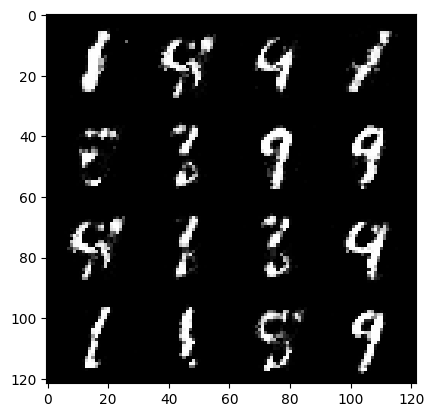

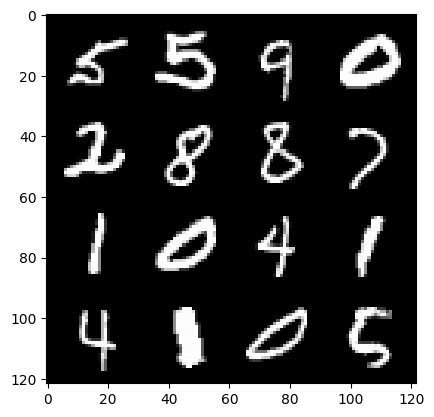

82: step 38700/ Gen loss: 2.152732245922087 / Disc loss: 0.2655619197090467


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


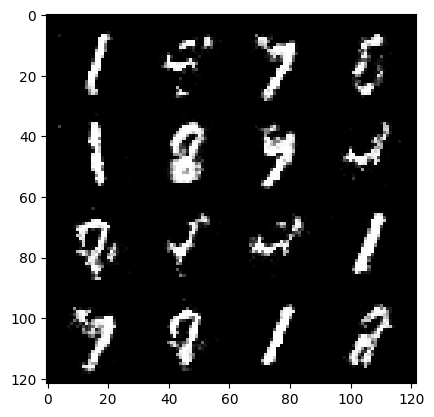

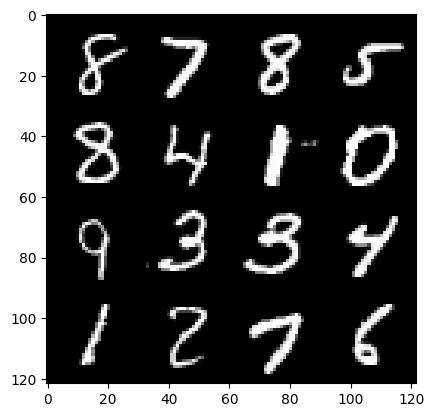

83: step 39000/ Gen loss: 2.240887272357942 / Disc loss: 0.25290049821138383
stepped in to the loop


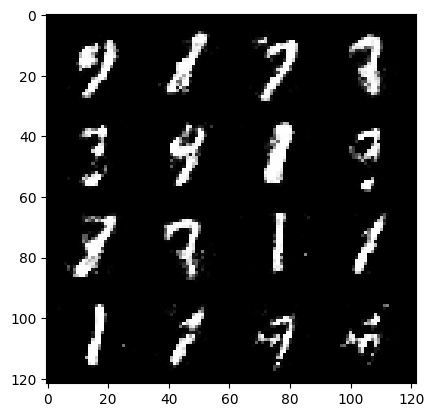

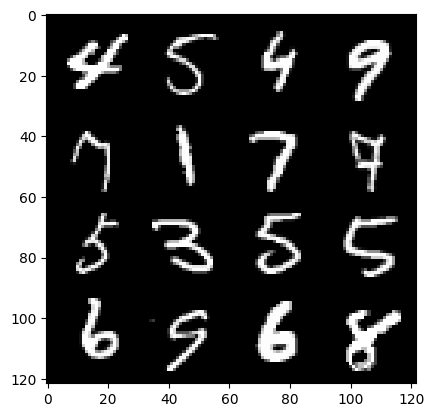

83: step 39300/ Gen loss: 2.195563678344091 / Disc loss: 0.2744986090064049


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


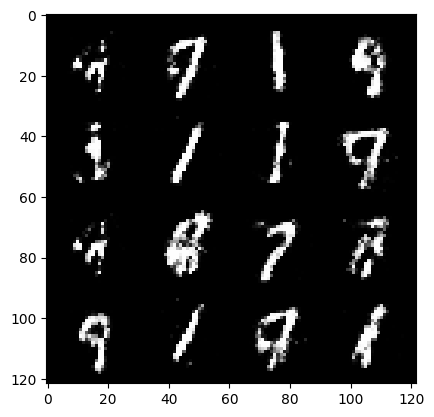

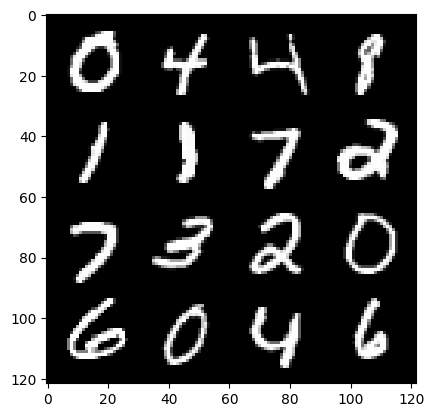

84: step 39600/ Gen loss: 2.1166470464070626 / Disc loss: 0.26546586230397246


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


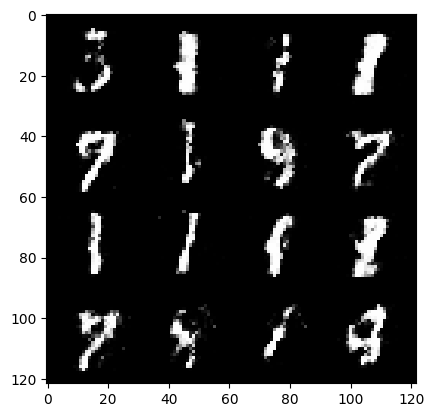

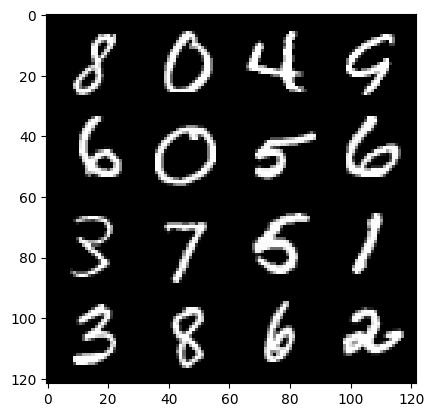

85: step 39900/ Gen loss: 2.0757208379109704 / Disc loss: 0.2840579040348529
stepped in to the loop


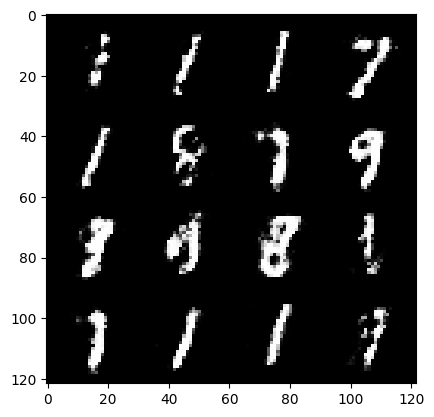

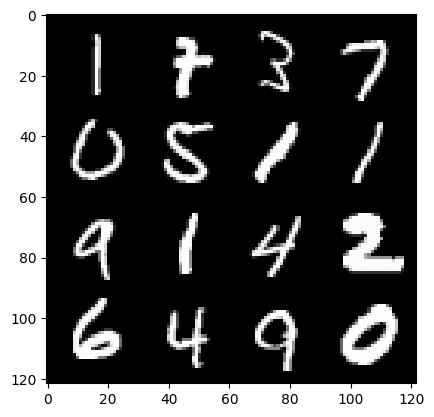

85: step 40200/ Gen loss: 2.062510707775751 / Disc loss: 0.27924877926707264


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


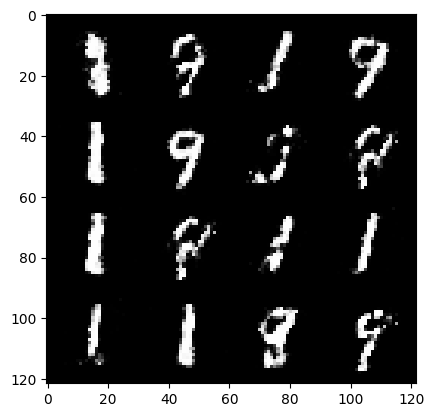

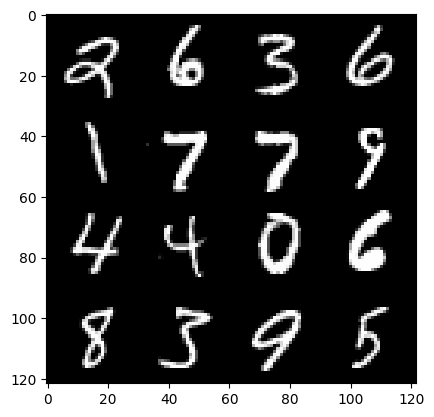

86: step 40500/ Gen loss: 2.0947220651308696 / Disc loss: 0.2642245956261953
stepped in to the loop


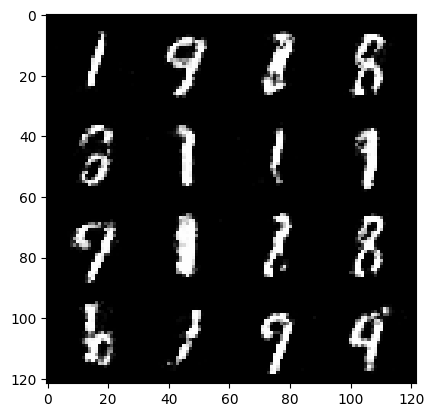

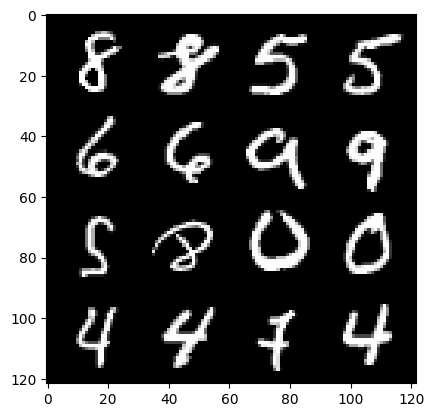

86: step 40800/ Gen loss: 2.0798502469062803 / Disc loss: 0.28619413788119946


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


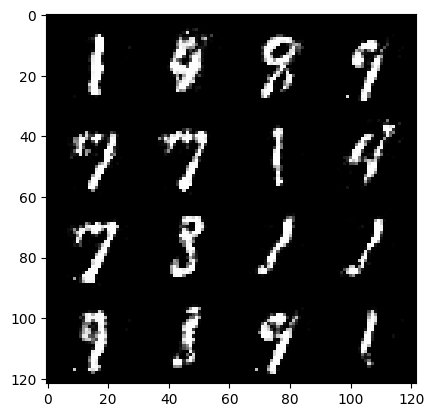

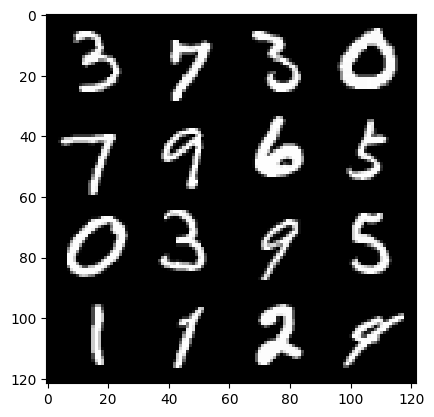

87: step 41100/ Gen loss: 2.1107725262641908 / Disc loss: 0.2678218880295755


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


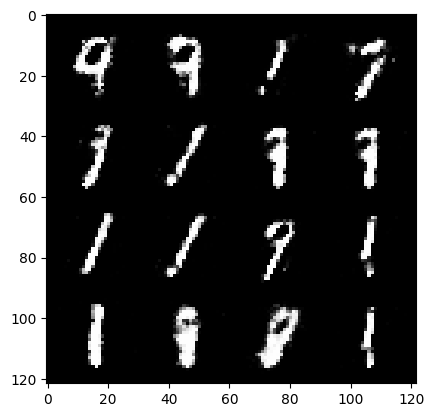

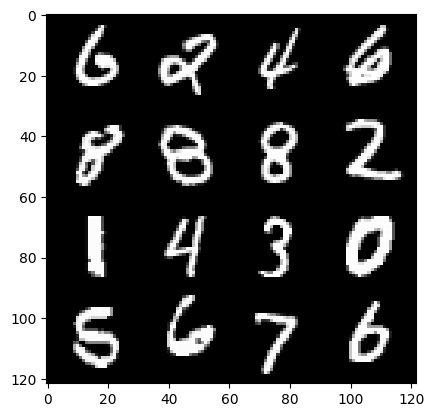

88: step 41400/ Gen loss: 2.243978058099746 / Disc loss: 0.24784737164775522
stepped in to the loop


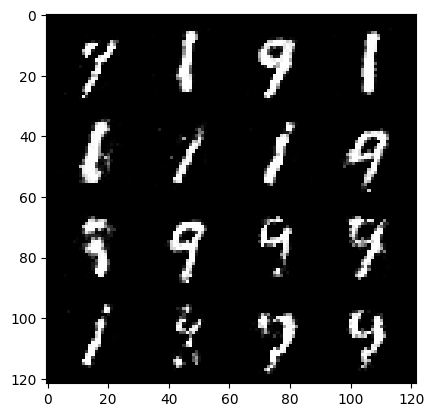

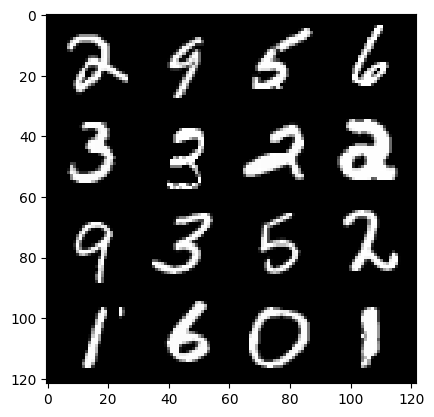

88: step 41700/ Gen loss: 2.0838518985112504 / Disc loss: 0.2808271479606627


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


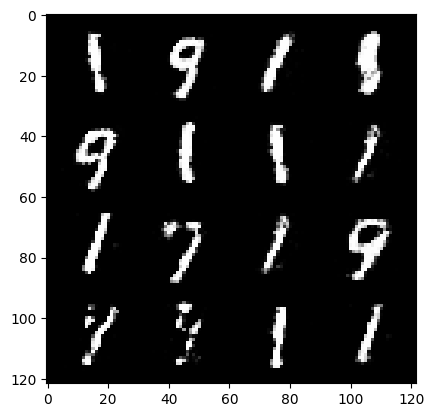

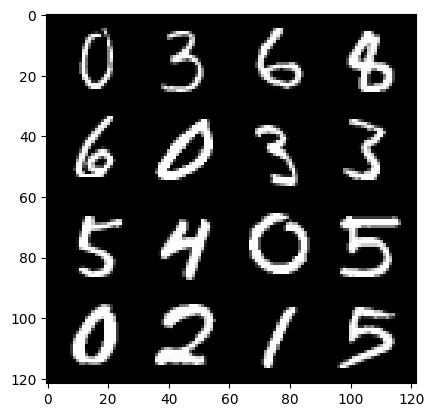

89: step 42000/ Gen loss: 2.0337783118089043 / Disc loss: 0.27972972705960264


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


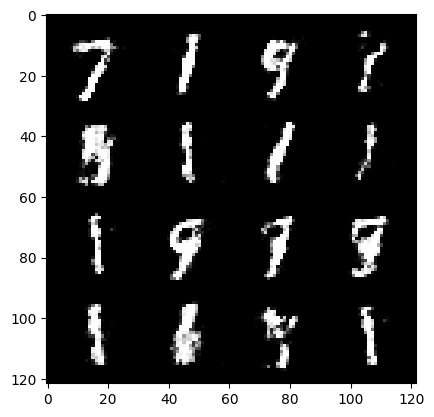

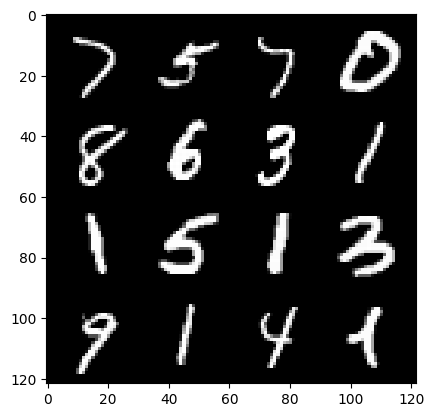

90: step 42300/ Gen loss: 2.0303394373257957 / Disc loss: 0.27866804763674735
stepped in to the loop


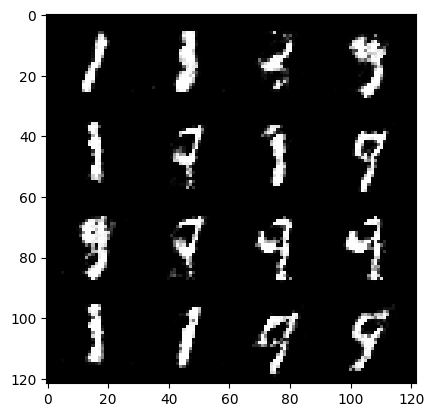

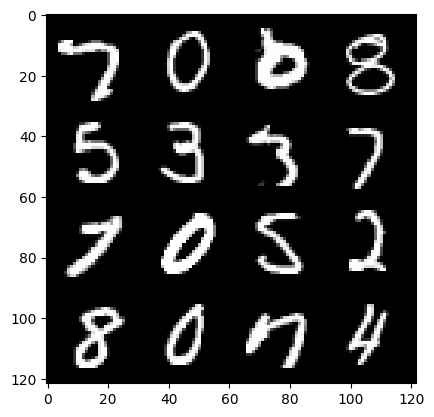

90: step 42600/ Gen loss: 2.0377654019991565 / Disc loss: 0.2806470046937467


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


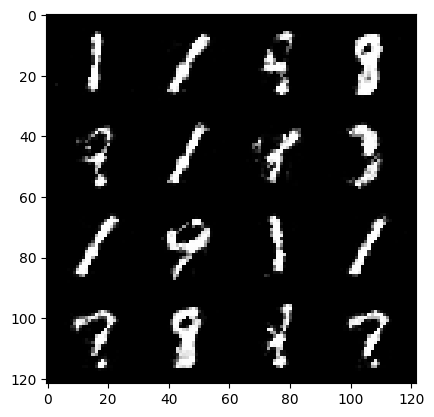

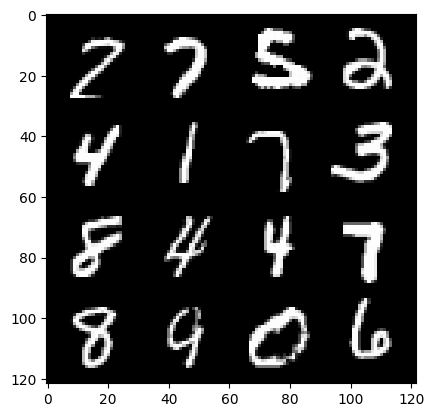

91: step 42900/ Gen loss: 2.08270458181699 / Disc loss: 0.2637269702057043


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


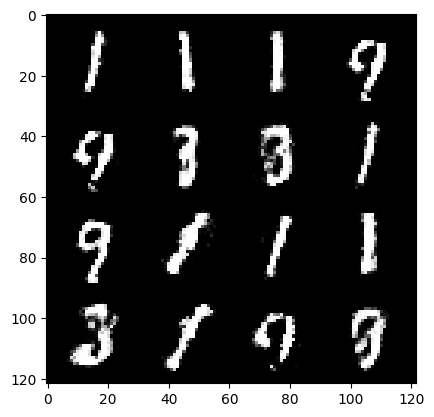

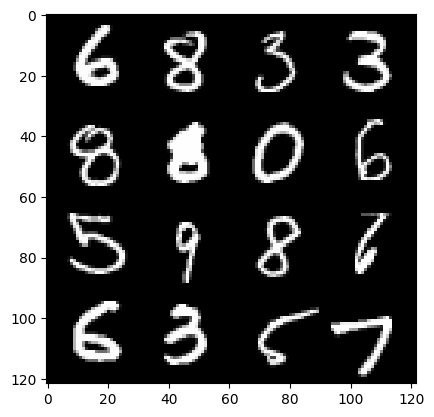

92: step 43200/ Gen loss: 2.161849967638652 / Disc loss: 0.26343581855297105
stepped in to the loop


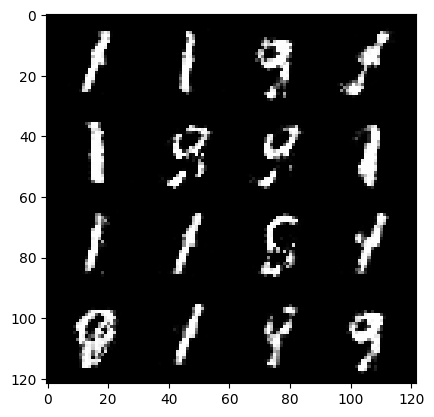

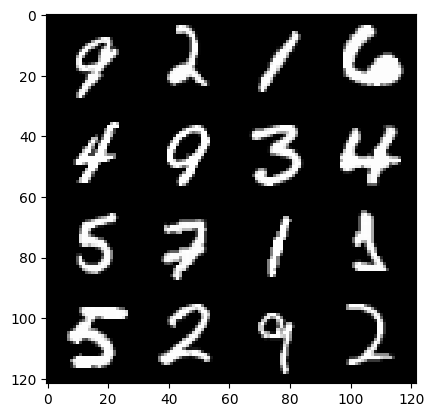

92: step 43500/ Gen loss: 2.192349183162054 / Disc loss: 0.2649502086142697


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


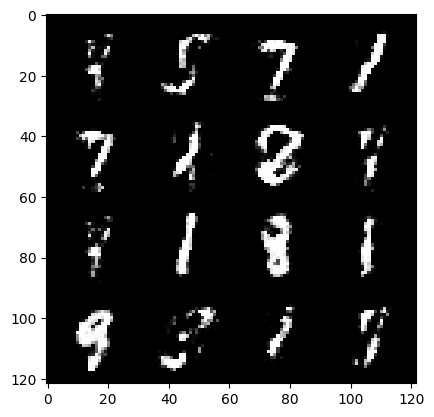

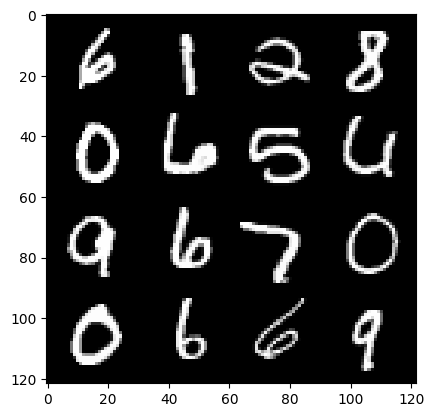

93: step 43800/ Gen loss: 2.173199286063512 / Disc loss: 0.263658115665118


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


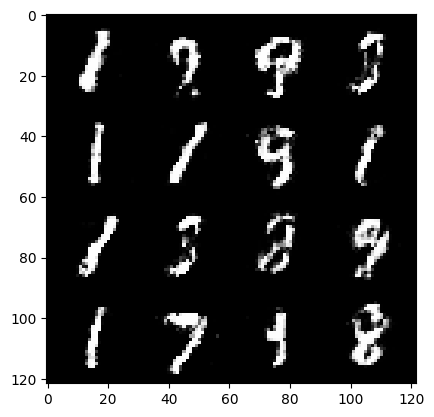

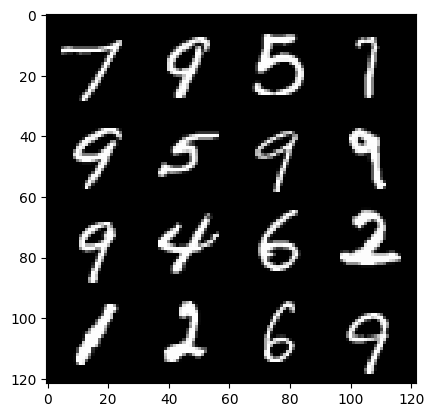

94: step 44100/ Gen loss: 2.0670357620716087 / Disc loss: 0.26970835889379163
stepped in to the loop


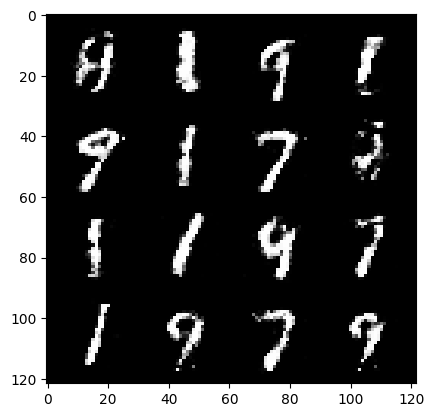

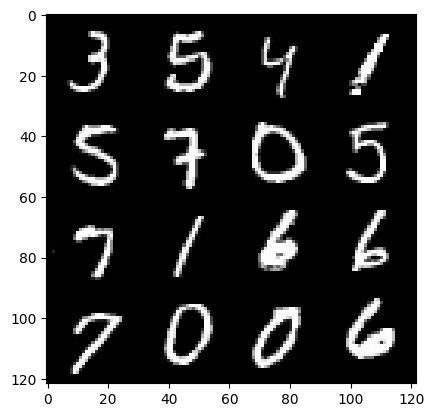

94: step 44400/ Gen loss: 2.1129458944002804 / Disc loss: 0.26662261600295717


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


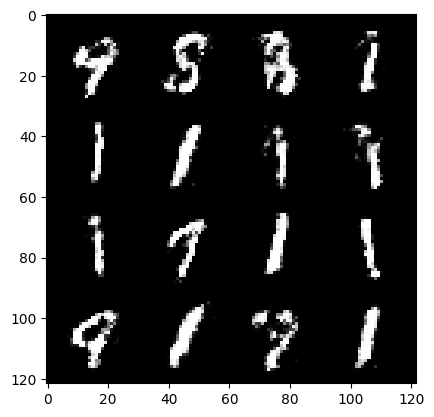

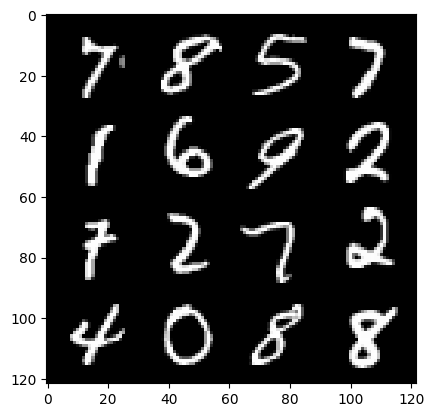

95: step 44700/ Gen loss: 2.104786707957587 / Disc loss: 0.27471357430020976
stepped in to the loop


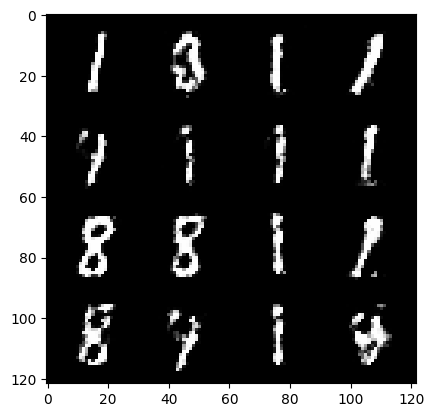

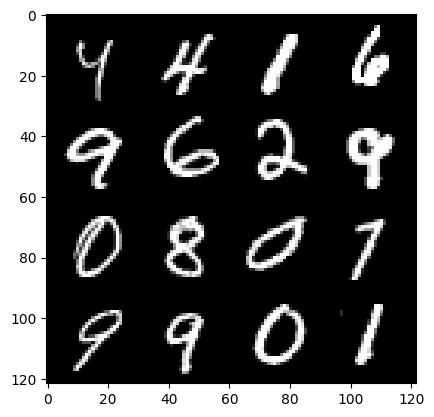

95: step 45000/ Gen loss: 2.041269698143006 / Disc loss: 0.2714115152756373


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


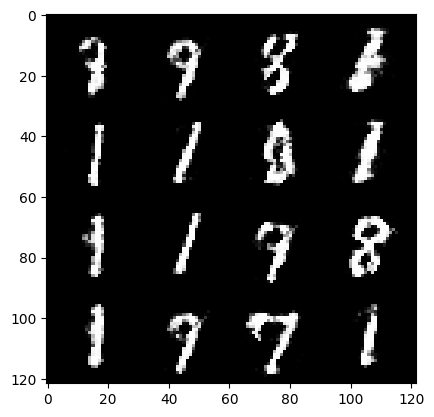

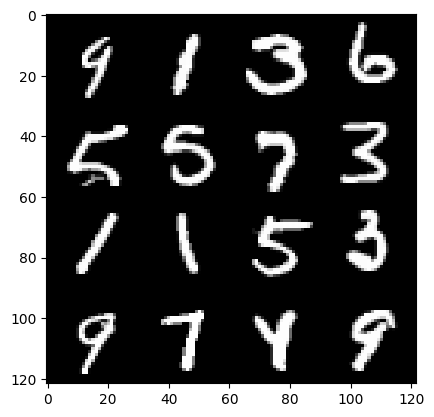

96: step 45300/ Gen loss: 2.054804082314172 / Disc loss: 0.27293855453530935


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


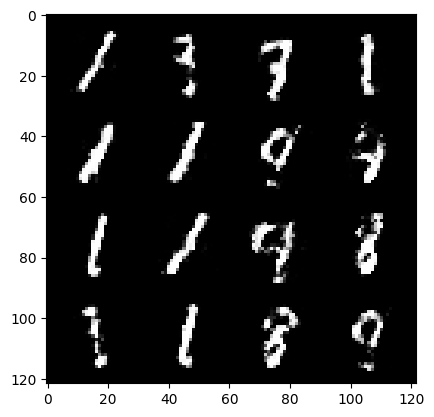

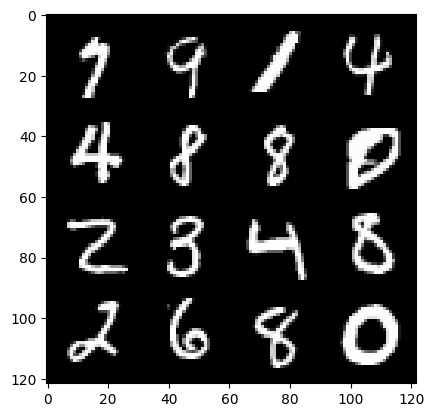

97: step 45600/ Gen loss: 1.9176143626372026 / Disc loss: 0.29858547662695245
stepped in to the loop


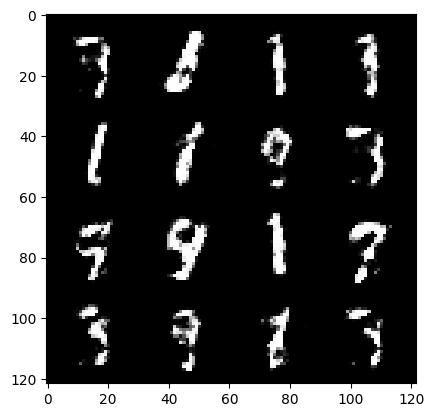

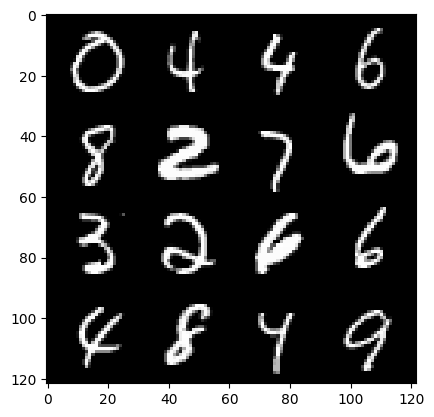

97: step 45900/ Gen loss: 2.0339078485965736 / Disc loss: 0.2695190826058389


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


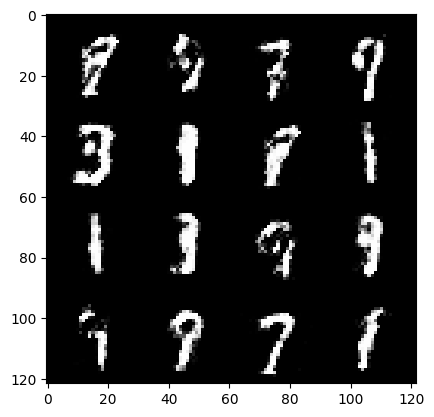

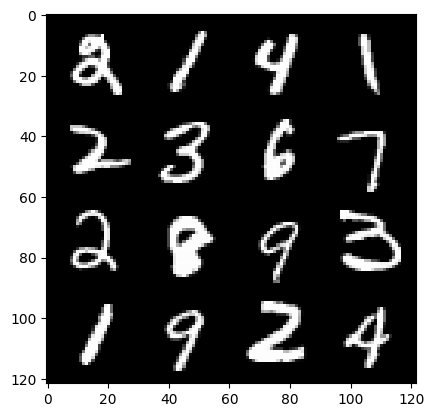

98: step 46200/ Gen loss: 2.1573558473587036 / Disc loss: 0.2555134732027849


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


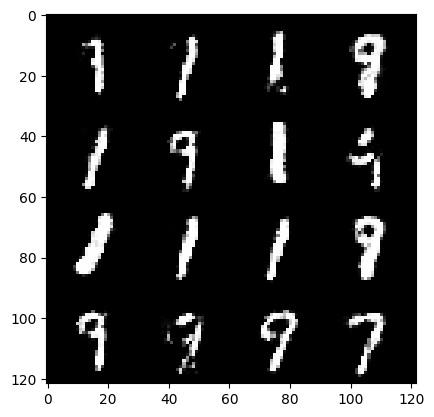

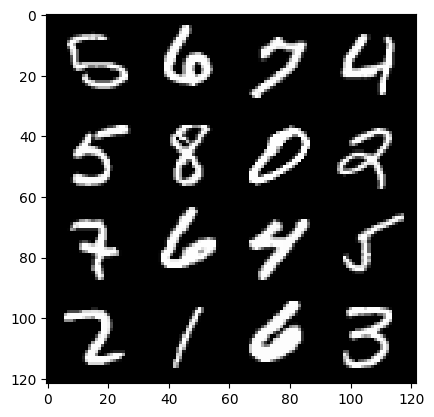

99: step 46500/ Gen loss: 2.044218719800314 / Disc loss: 0.28058439423640563
stepped in to the loop


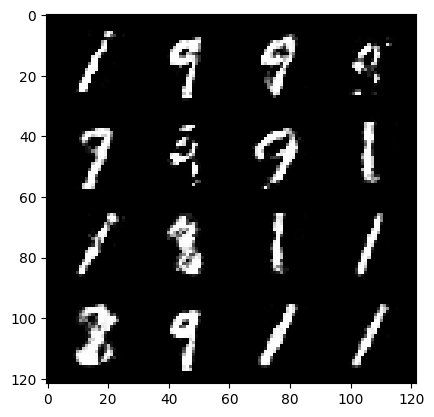

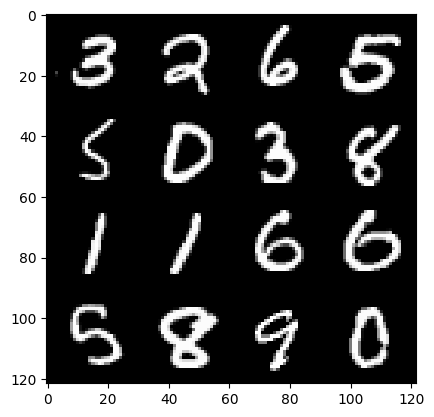

99: step 46800/ Gen loss: 1.9434354865550987 / Disc loss: 0.2948739848534266


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


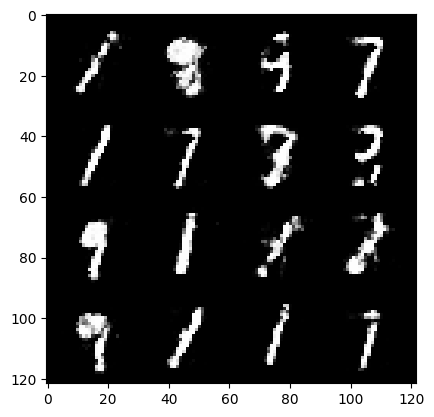

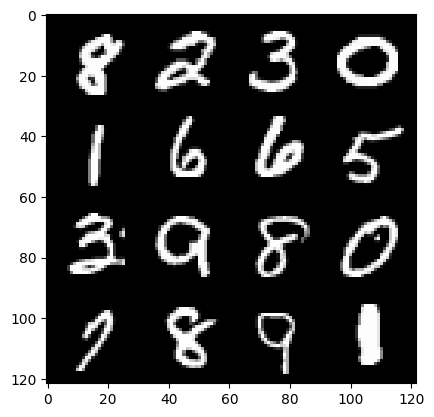

100: step 47100/ Gen loss: 1.8949606422583245 / Disc loss: 0.2969129773974418


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


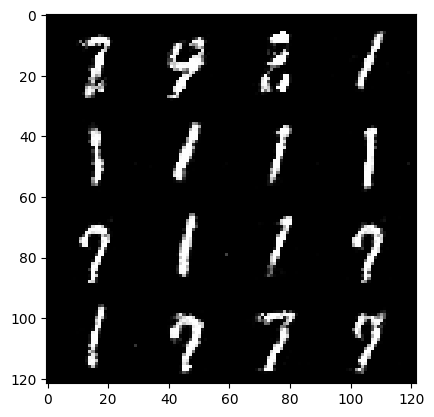

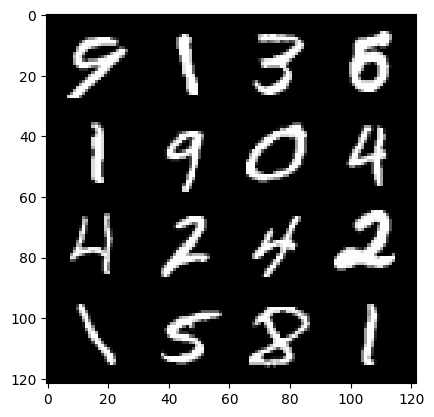

101: step 47400/ Gen loss: 1.9316921003659568 / Disc loss: 0.2892479104797045
stepped in to the loop


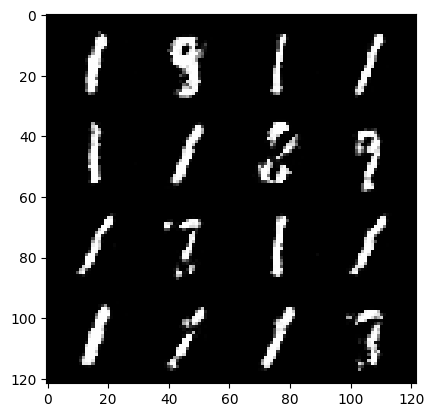

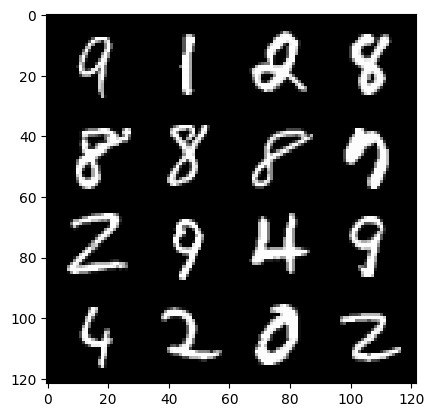

101: step 47700/ Gen loss: 1.9294544156392404 / Disc loss: 0.29172245477636644


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


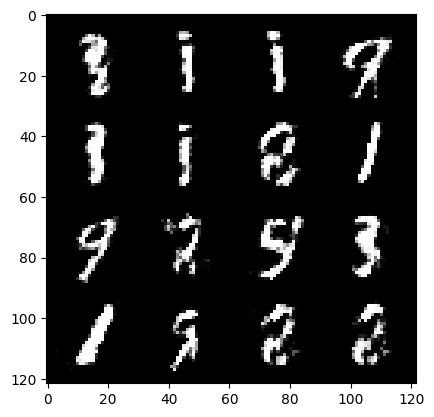

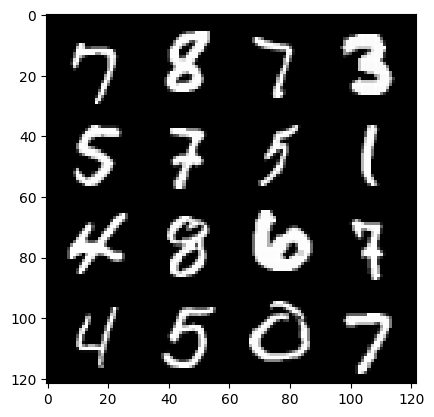

102: step 48000/ Gen loss: 1.9339091610908503 / Disc loss: 0.3061414973934489
stepped in to the loop


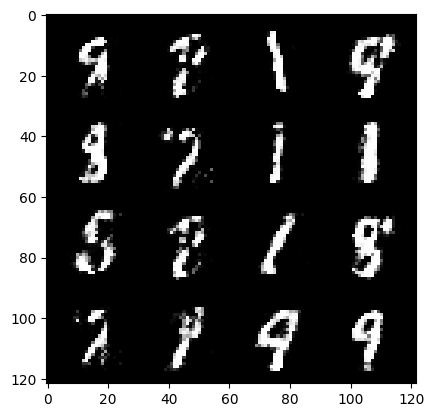

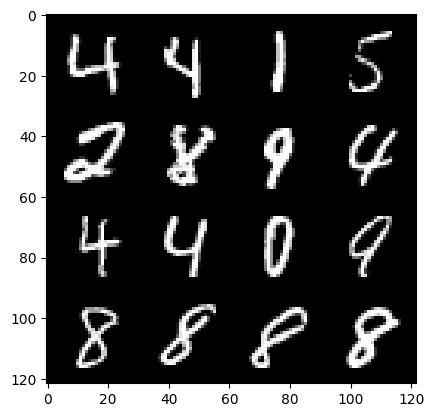

102: step 48300/ Gen loss: 1.9656061947345722 / Disc loss: 0.28902737254897753


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


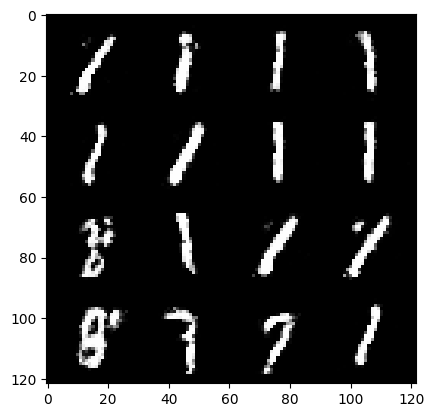

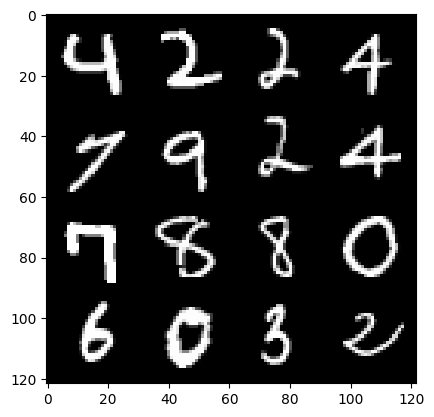

103: step 48600/ Gen loss: 1.886850618521374 / Disc loss: 0.31139063100020103


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


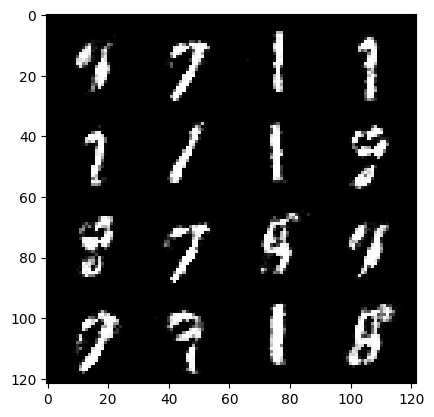

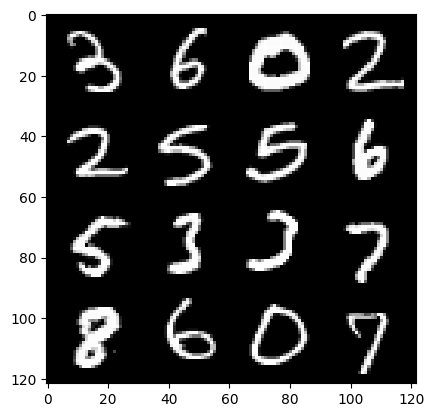

104: step 48900/ Gen loss: 1.863344118595122 / Disc loss: 0.31352129846811305
stepped in to the loop


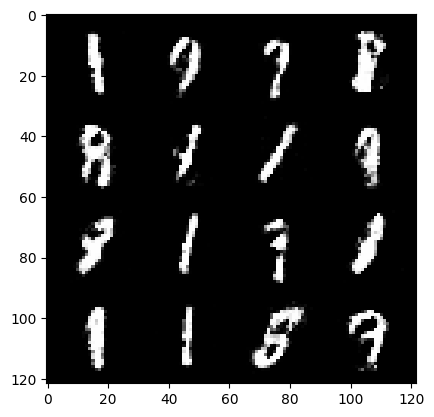

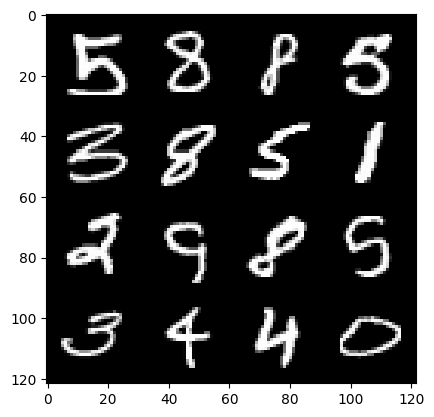

104: step 49200/ Gen loss: 1.8606338246663416 / Disc loss: 0.30366751586397484


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


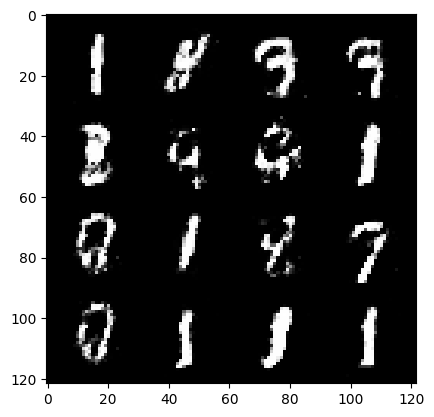

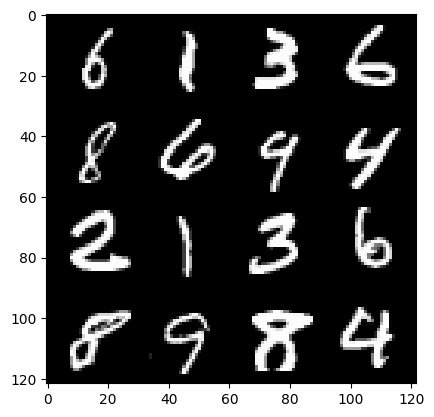

105: step 49500/ Gen loss: 1.802804393370946 / Disc loss: 0.3419716938833397


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


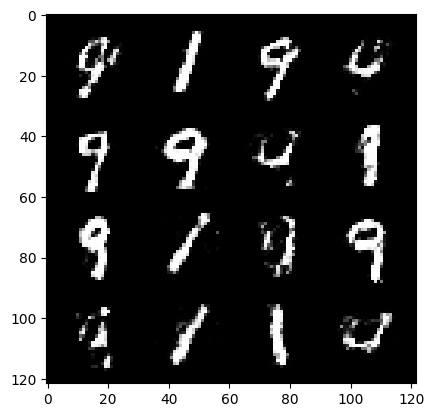

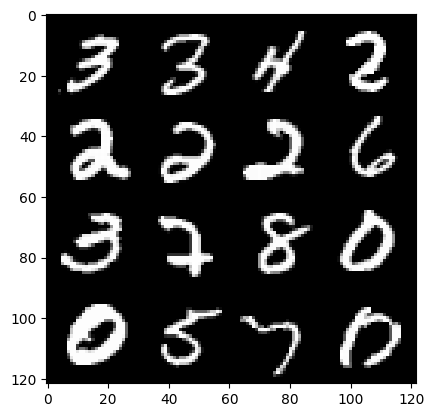

106: step 49800/ Gen loss: 1.8099805319309223 / Disc loss: 0.32347632179657604
stepped in to the loop


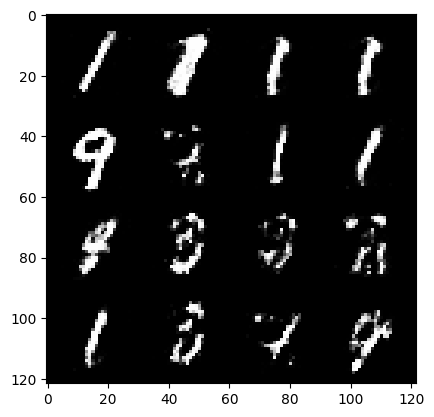

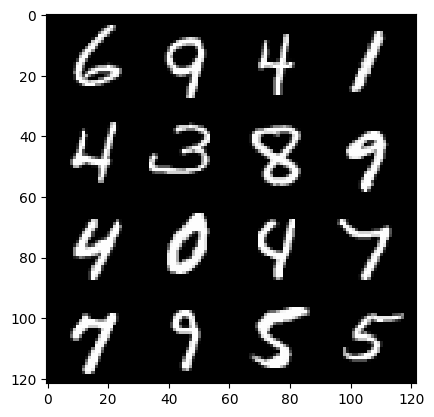

106: step 50100/ Gen loss: 1.8507378657658906 / Disc loss: 0.3105591208239396


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


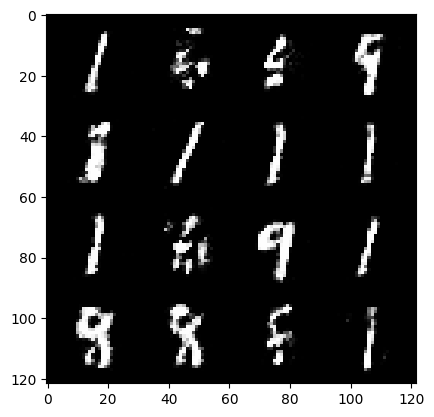

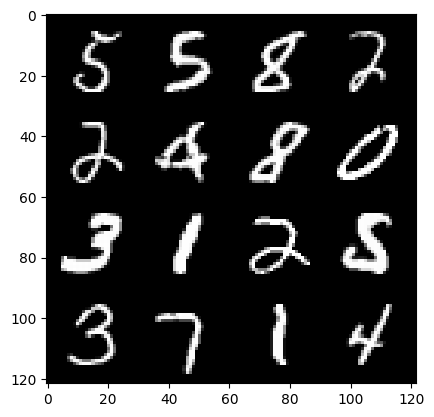

107: step 50400/ Gen loss: 1.83760108590126 / Disc loss: 0.30308190867304824


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


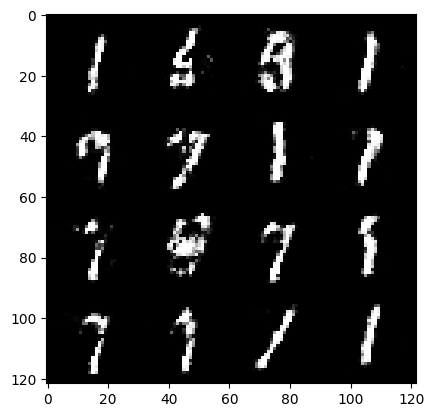

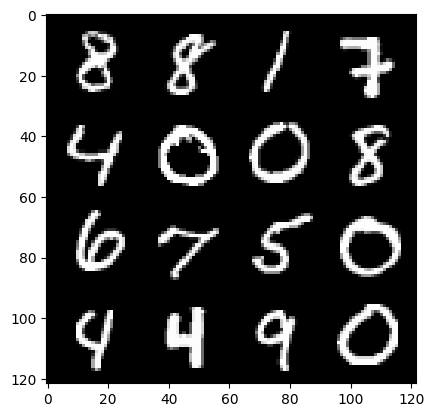

108: step 50700/ Gen loss: 1.7638351484139754 / Disc loss: 0.3261688464879989
stepped in to the loop


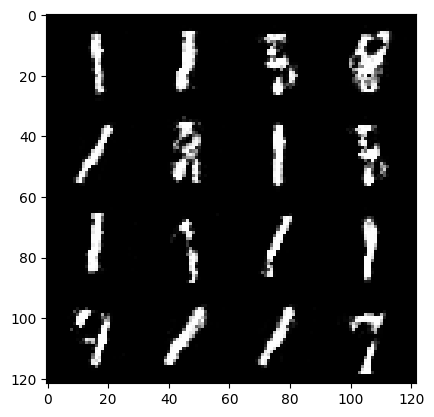

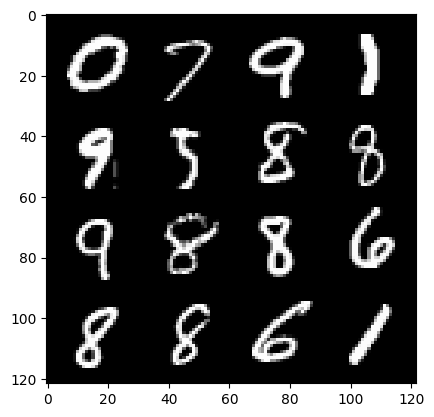

108: step 51000/ Gen loss: 1.8123794913291922 / Disc loss: 0.3169520290692649


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


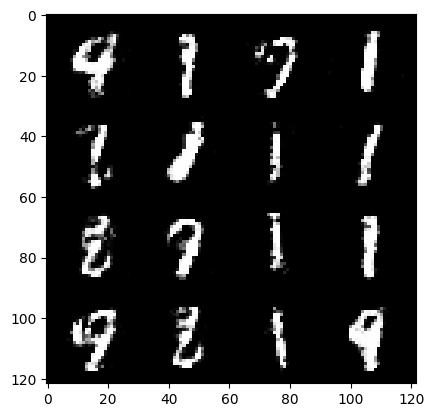

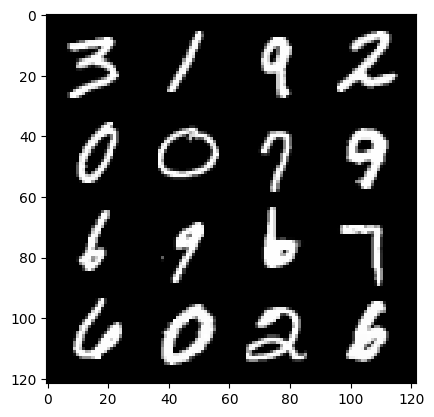

109: step 51300/ Gen loss: 1.829589298963547 / Disc loss: 0.31415921991070106


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


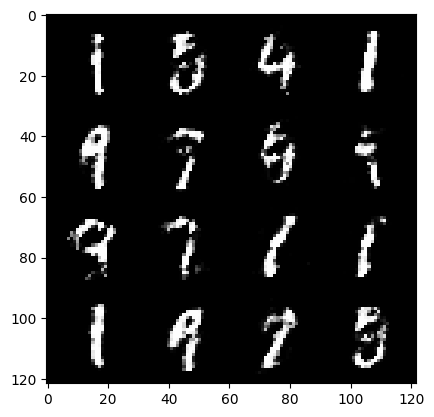

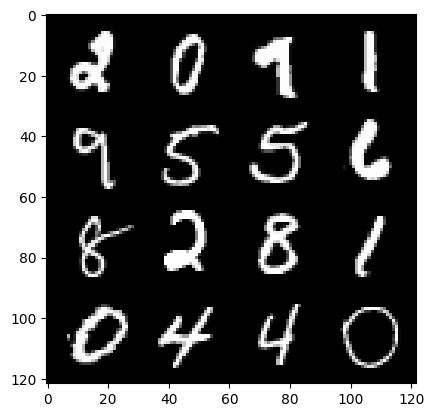

110: step 51600/ Gen loss: 1.8617477921644847 / Disc loss: 0.30287474483251564
stepped in to the loop


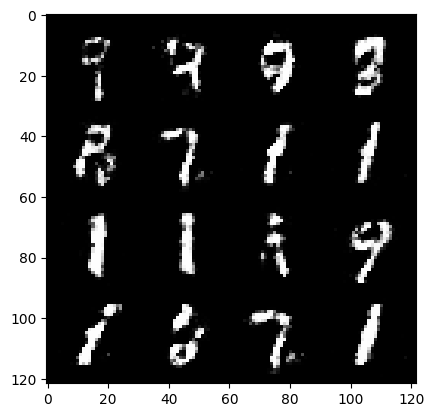

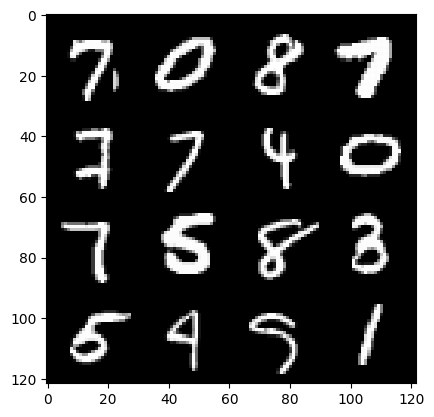

110: step 51900/ Gen loss: 1.8539545754591629 / Disc loss: 0.3214327510197957


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


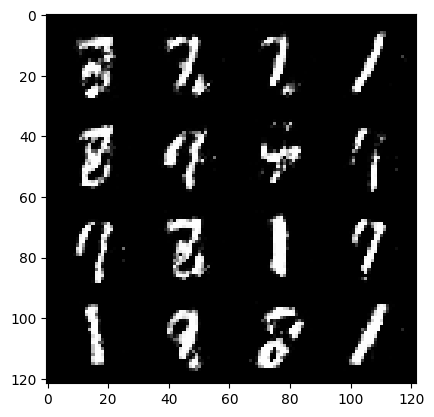

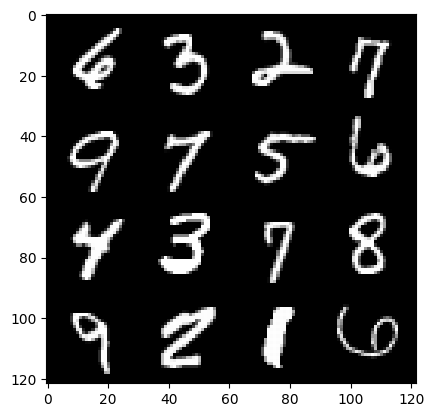

111: step 52200/ Gen loss: 1.8490156829357152 / Disc loss: 0.3098970985909304
stepped in to the loop


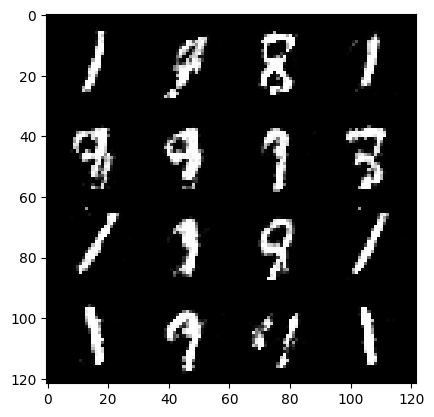

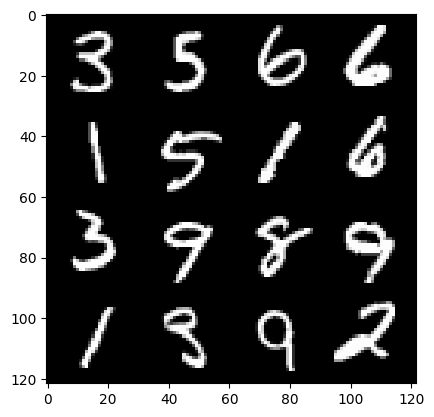

111: step 52500/ Gen loss: 1.78623848994573 / Disc loss: 0.32231538618604316


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


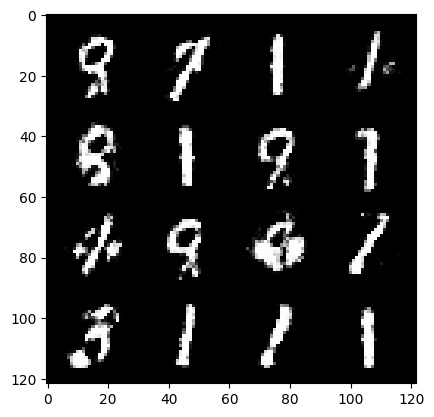

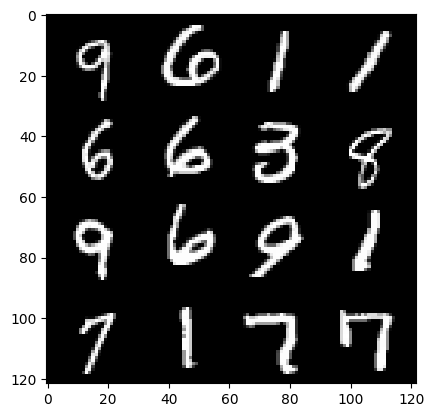

112: step 52800/ Gen loss: 1.8324434928099311 / Disc loss: 0.31834504400690394


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


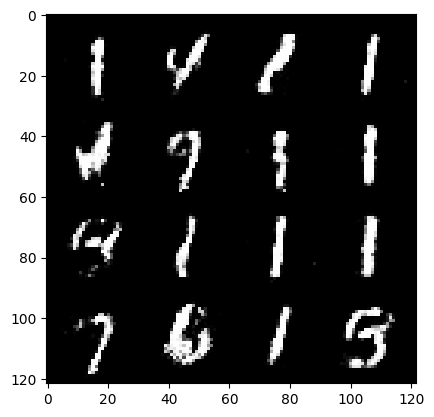

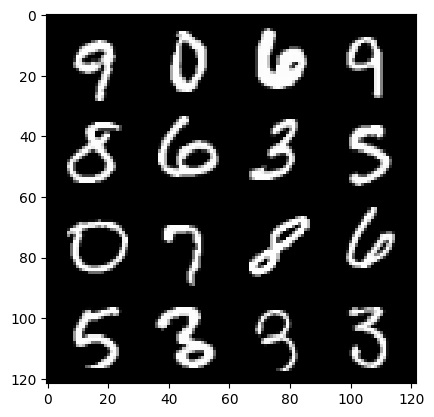

113: step 53100/ Gen loss: 1.9163145701090496 / Disc loss: 0.303968273202578
stepped in to the loop


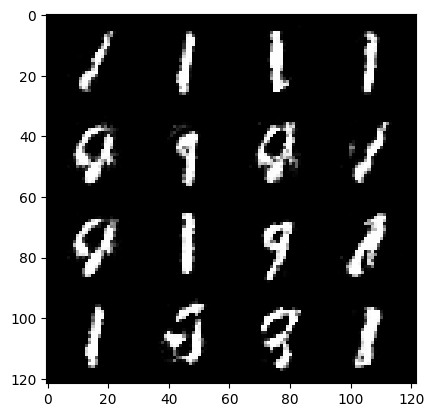

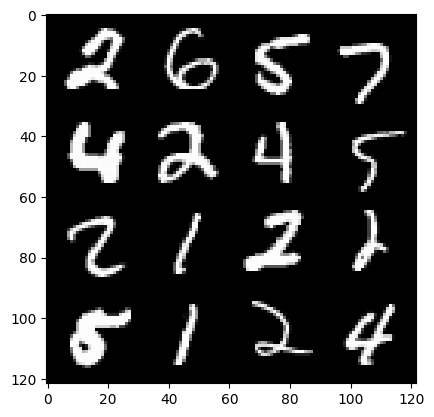

113: step 53400/ Gen loss: 1.8884232548872621 / Disc loss: 0.32710191681981066


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


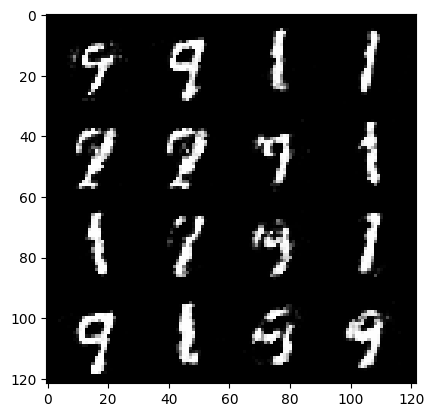

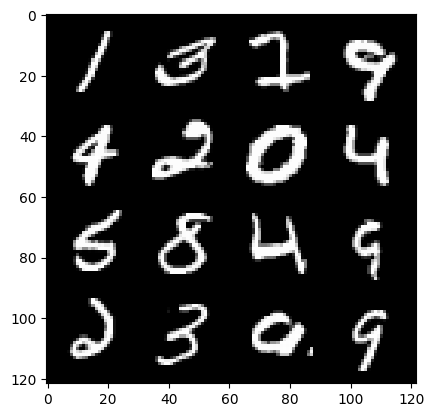

114: step 53700/ Gen loss: 1.8466005671024321 / Disc loss: 0.31292515486478795


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


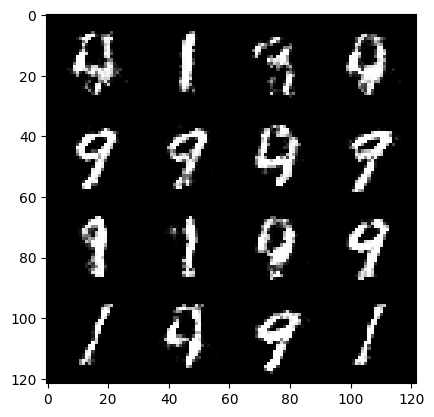

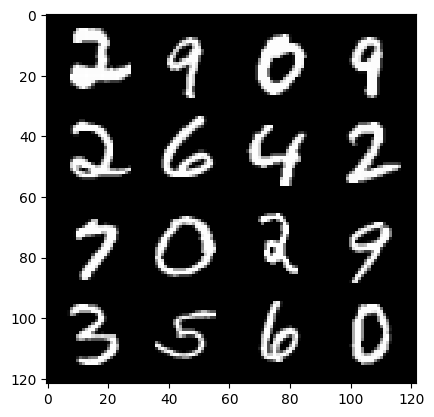

115: step 54000/ Gen loss: 1.8583046146233861 / Disc loss: 0.31161047299702954
stepped in to the loop


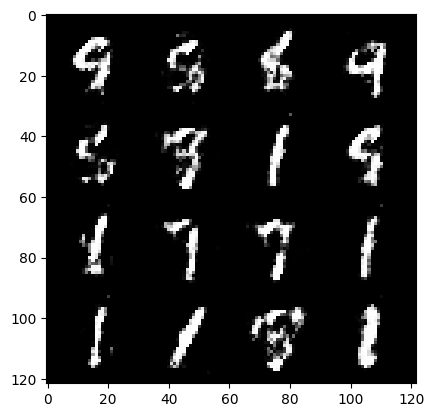

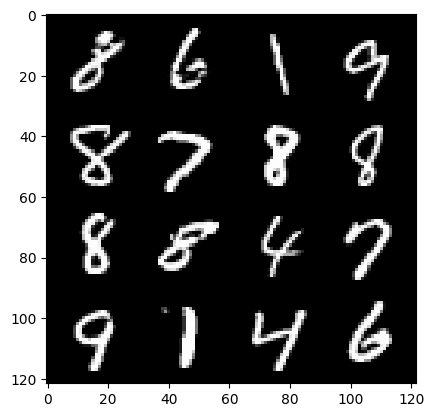

115: step 54300/ Gen loss: 1.8231302579243969 / Disc loss: 0.32586802040537205


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


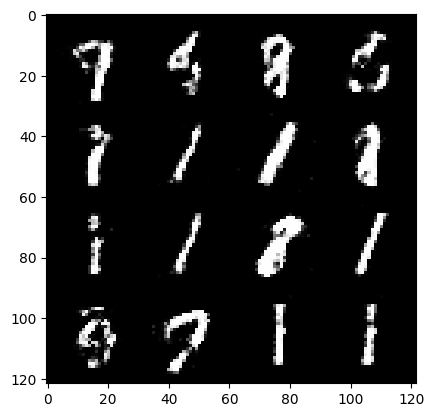

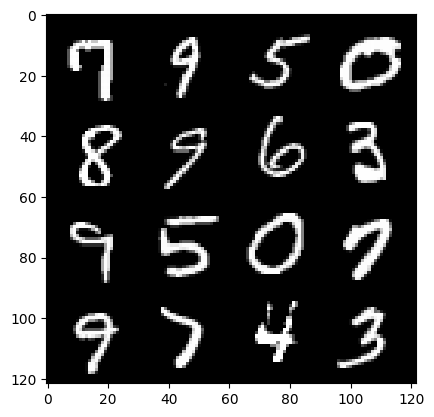

116: step 54600/ Gen loss: 1.8125766003131862 / Disc loss: 0.31499730348587013


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


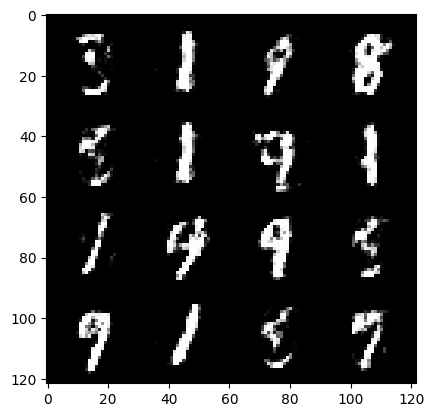

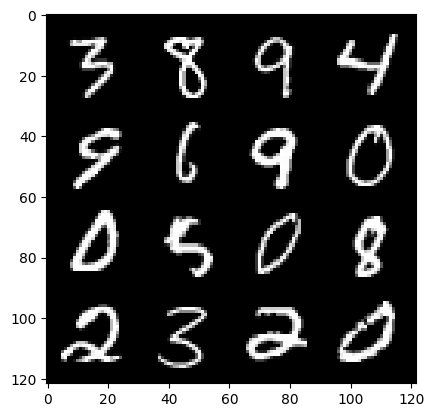

117: step 54900/ Gen loss: 1.869329333305359 / Disc loss: 0.30677051444848374
stepped in to the loop


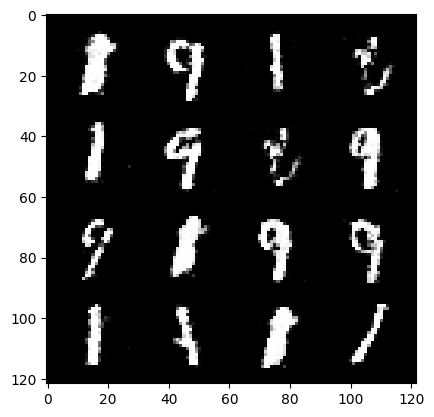

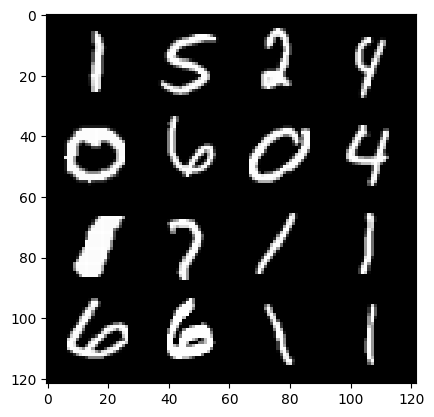

117: step 55200/ Gen loss: 1.8322019151846574 / Disc loss: 0.311223637064298


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


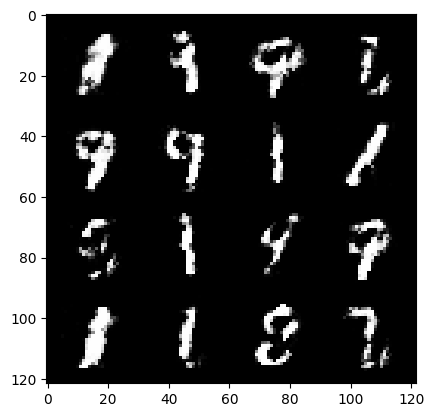

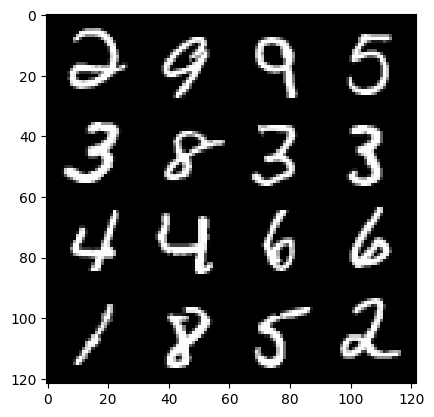

118: step 55500/ Gen loss: 1.8492020134131097 / Disc loss: 0.31315927445888503
stepped in to the loop


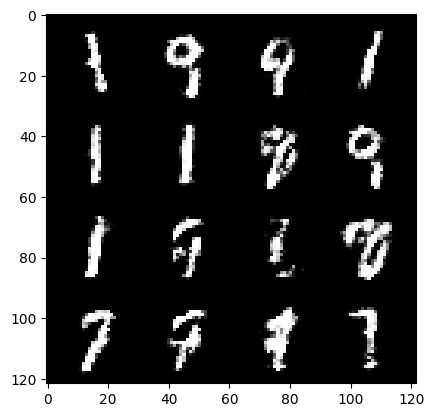

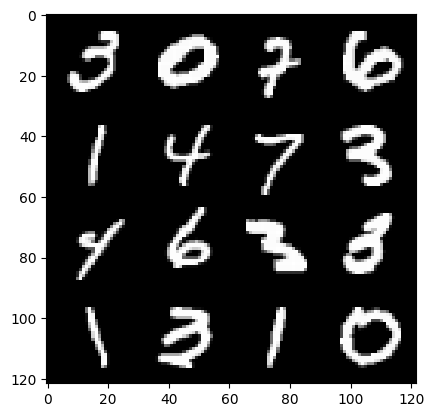

118: step 55800/ Gen loss: 1.7522245502471934 / Disc loss: 0.3321649799744289


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


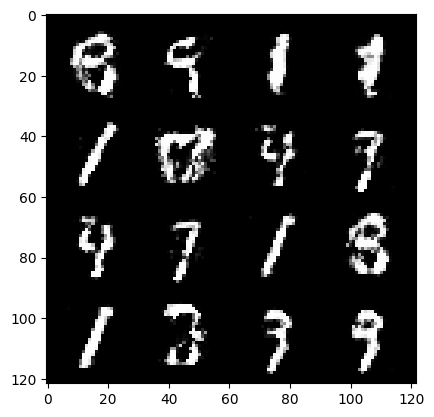

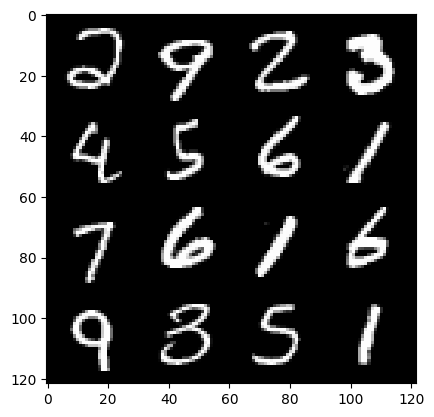

119: step 56100/ Gen loss: 1.7353747276465095 / Disc loss: 0.331242971320947


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


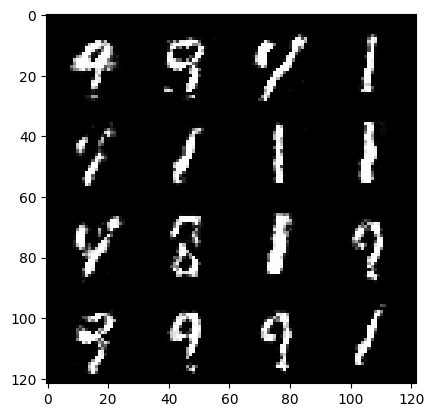

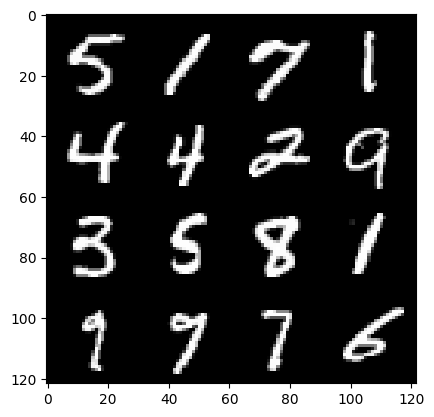

120: step 56400/ Gen loss: 1.8142285231749227 / Disc loss: 0.3093137114743393
stepped in to the loop


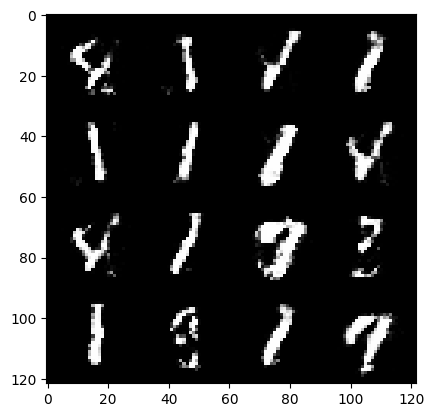

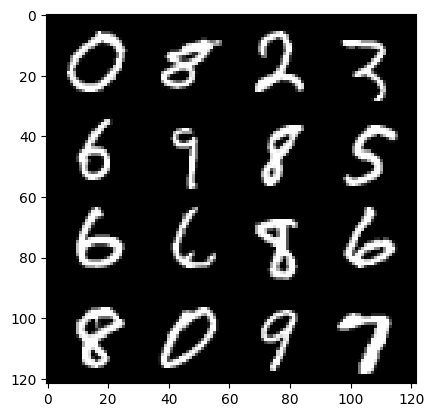

120: step 56700/ Gen loss: 1.8502391413847614 / Disc loss: 0.30086192299922304


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


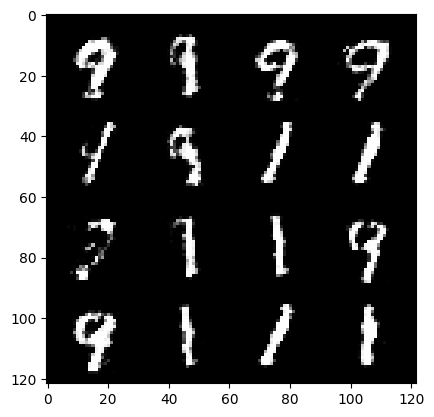

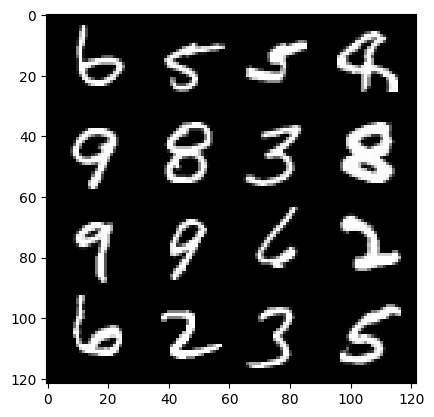

121: step 57000/ Gen loss: 1.8350304917494449 / Disc loss: 0.30107840999960905


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


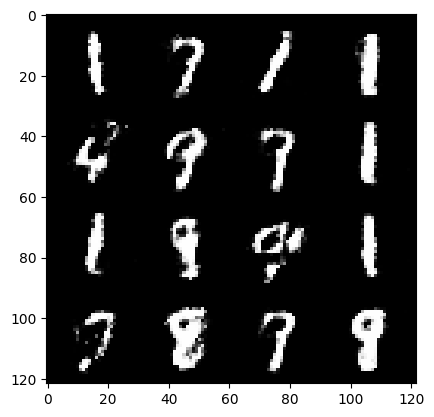

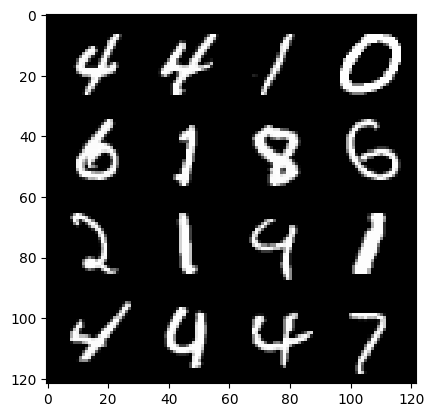

122: step 57300/ Gen loss: 1.8581922392050423 / Disc loss: 0.3016899236540001
stepped in to the loop


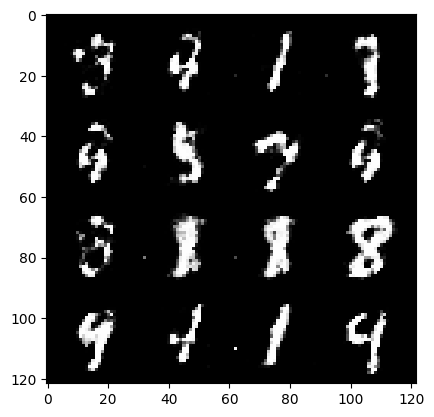

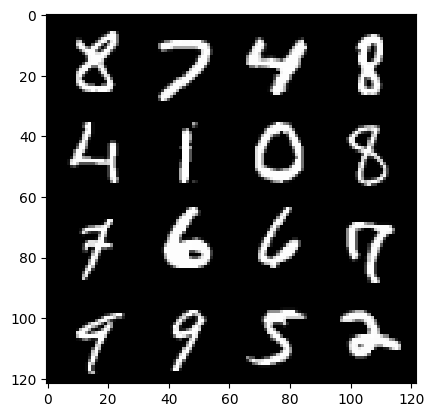

122: step 57600/ Gen loss: 1.8017730438709256 / Disc loss: 0.33842901319265356


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


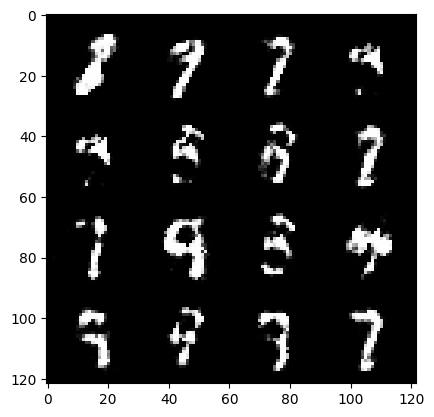

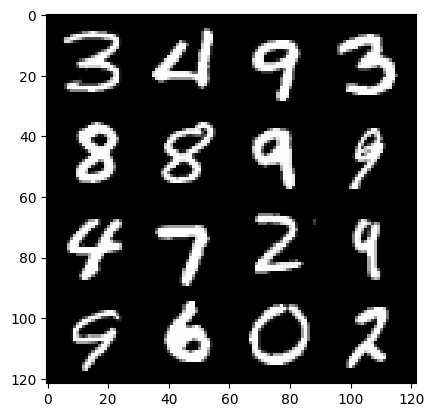

123: step 57900/ Gen loss: 1.7935740319887796 / Disc loss: 0.31497967655460035


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


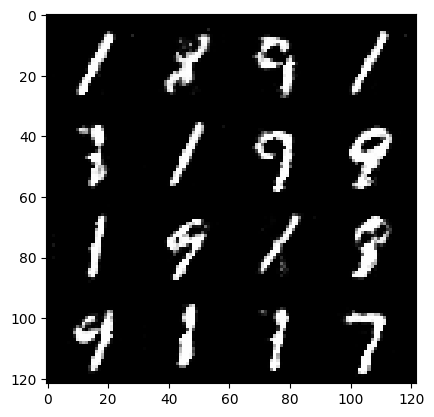

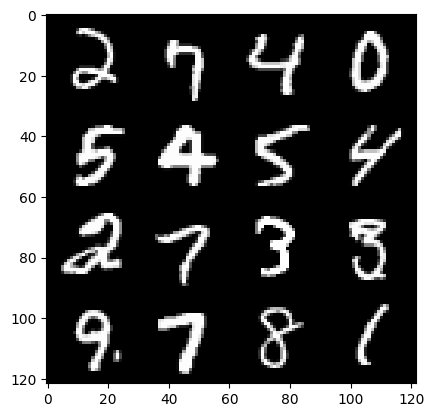

124: step 58200/ Gen loss: 1.7809863245487219 / Disc loss: 0.3077844066421189
stepped in to the loop


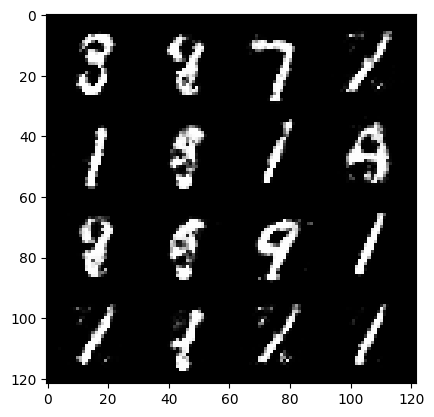

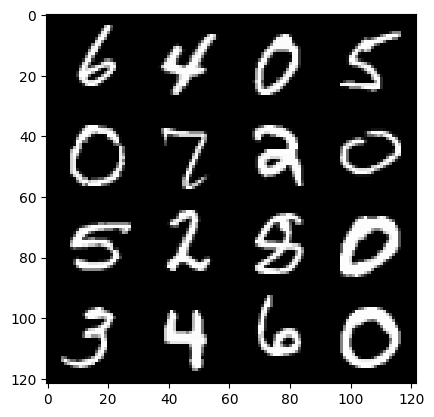

124: step 58500/ Gen loss: 1.788595221439996 / Disc loss: 0.3184469150006772


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


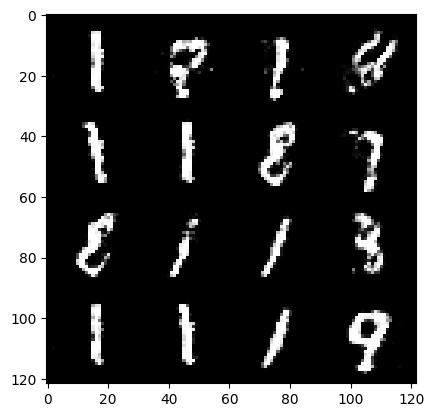

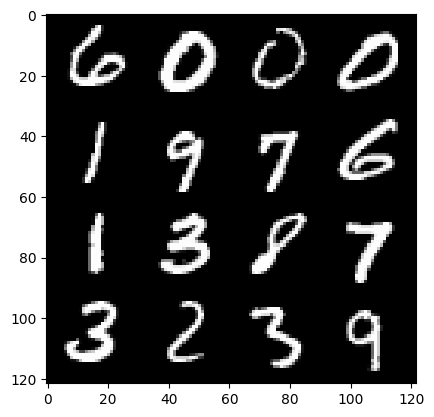

125: step 58800/ Gen loss: 1.822251490751903 / Disc loss: 0.314675958851973


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


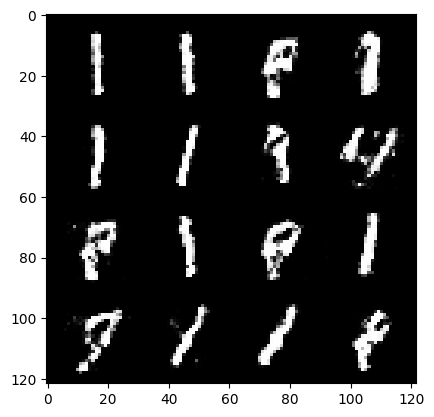

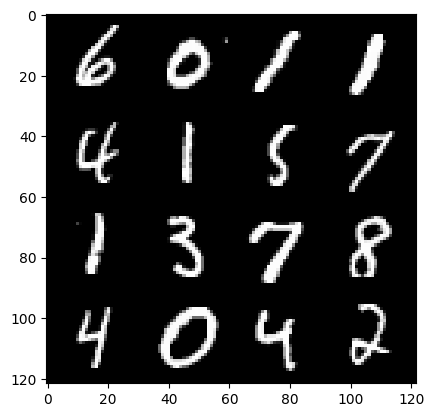

126: step 59100/ Gen loss: 1.801065782308578 / Disc loss: 0.3186673274636269
stepped in to the loop


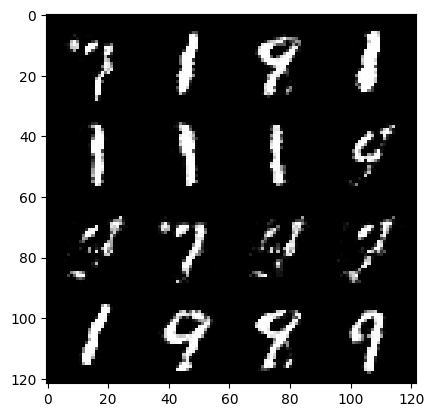

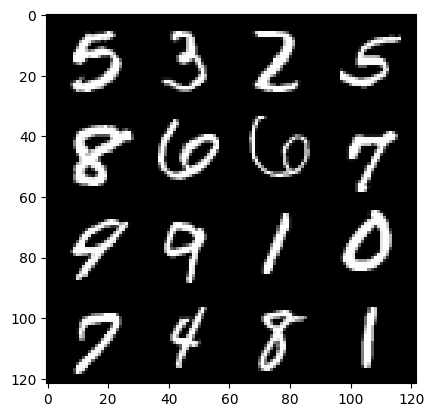

126: step 59400/ Gen loss: 1.832332156499227 / Disc loss: 0.32227984502911555


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


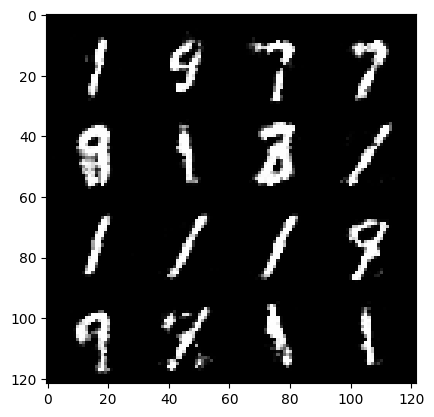

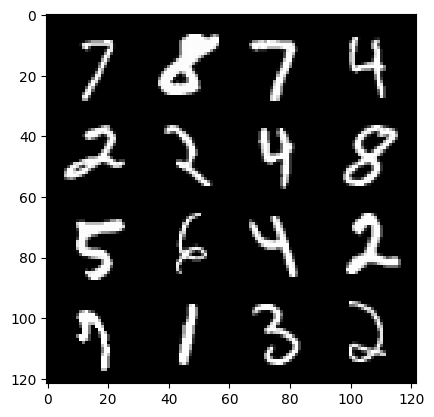

127: step 59700/ Gen loss: 1.8344982592264805 / Disc loss: 0.31378164594372093
stepped in to the loop


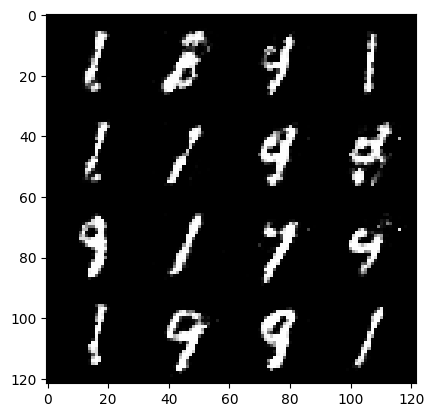

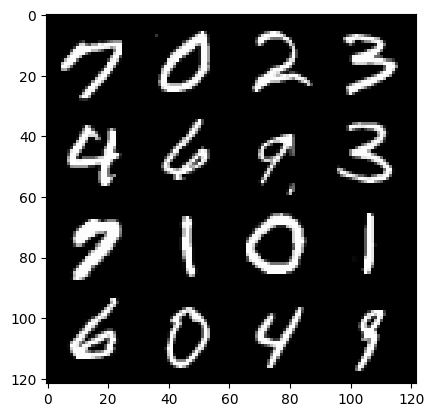

127: step 60000/ Gen loss: 1.6806460475921625 / Disc loss: 0.3436818494399391


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


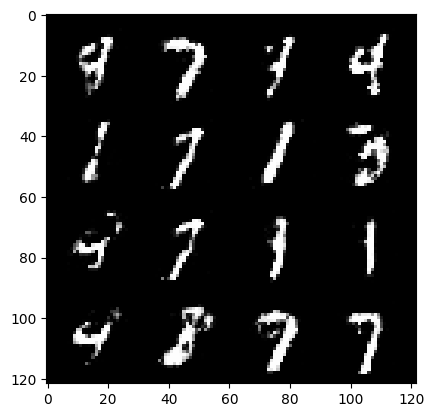

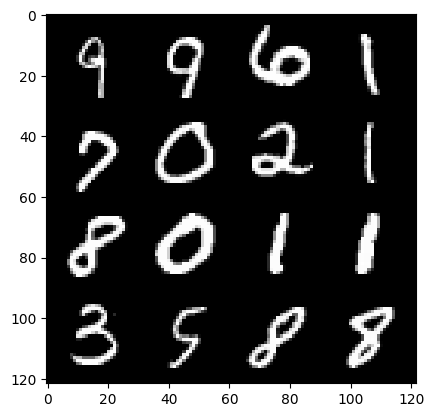

128: step 60300/ Gen loss: 1.693802342414854 / Disc loss: 0.3265341068307559


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


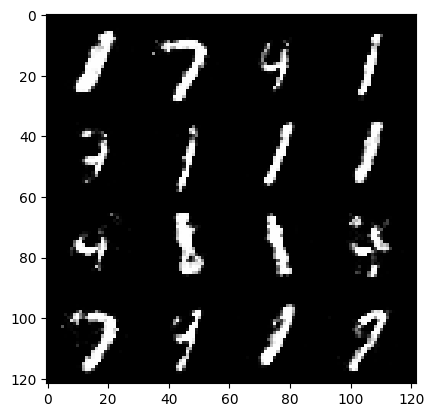

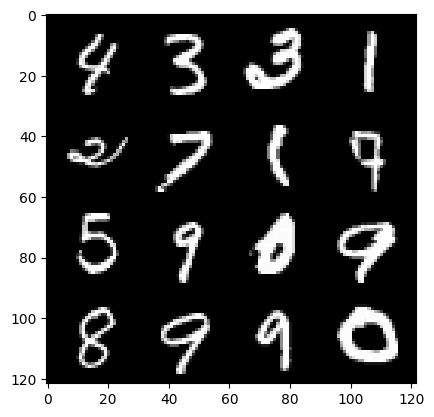

129: step 60600/ Gen loss: 1.815412127574285 / Disc loss: 0.3027957805991172
stepped in to the loop


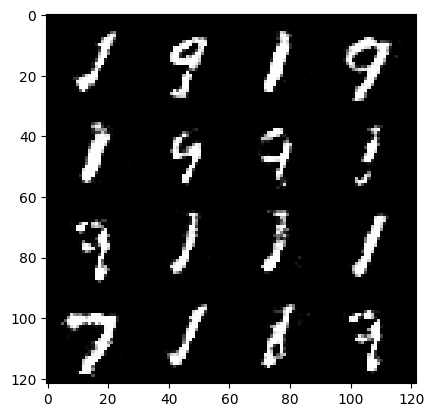

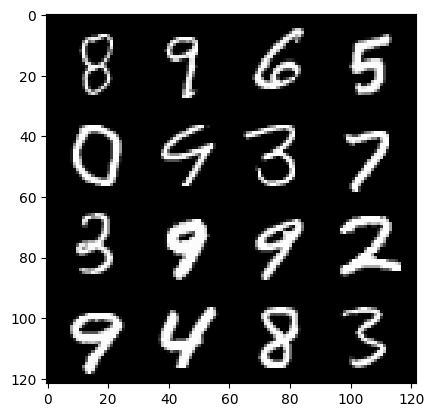

129: step 60900/ Gen loss: 1.731945246458054 / Disc loss: 0.3375576347112655


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


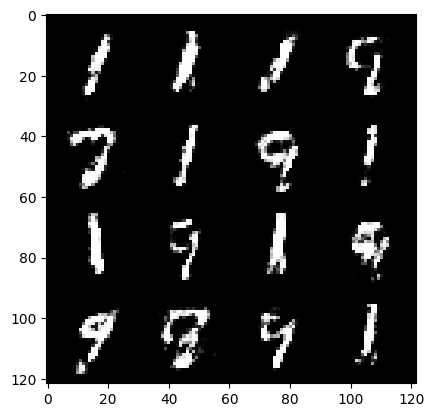

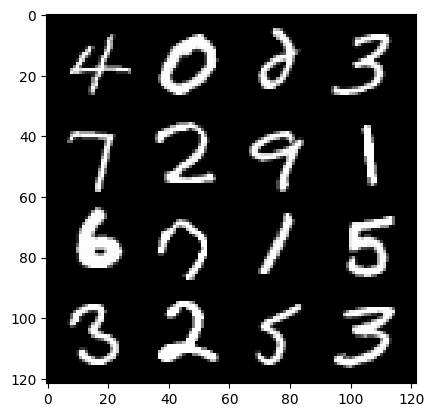

130: step 61200/ Gen loss: 1.7419215273857114 / Disc loss: 0.321690337260564


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


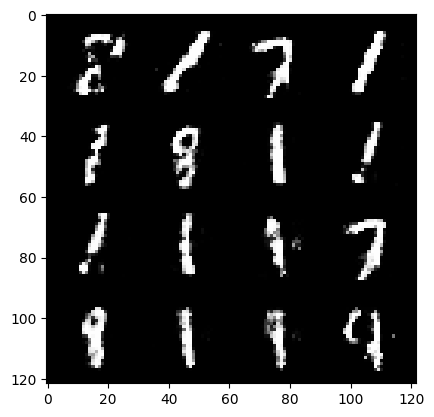

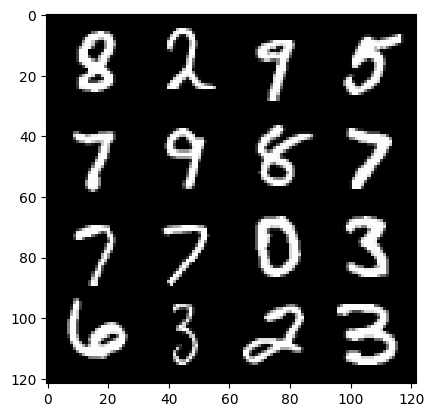

131: step 61500/ Gen loss: 1.813950173060098 / Disc loss: 0.2989024047553539
stepped in to the loop


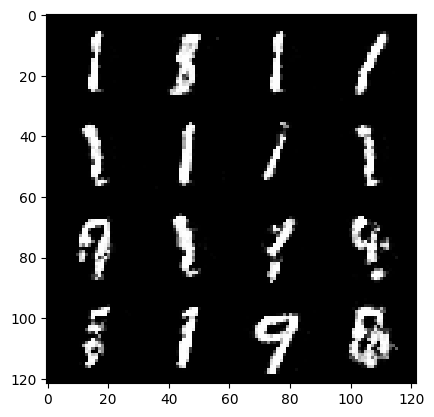

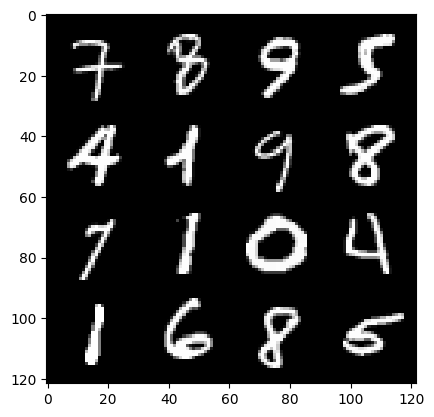

131: step 61800/ Gen loss: 1.76315351843834 / Disc loss: 0.32324598396817816


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


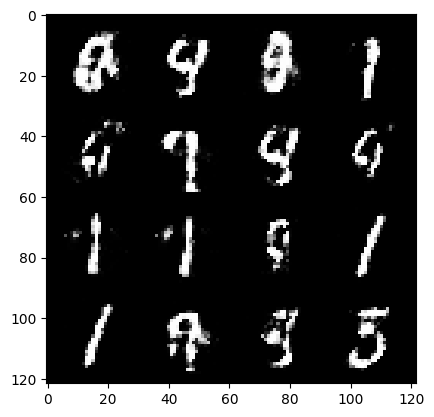

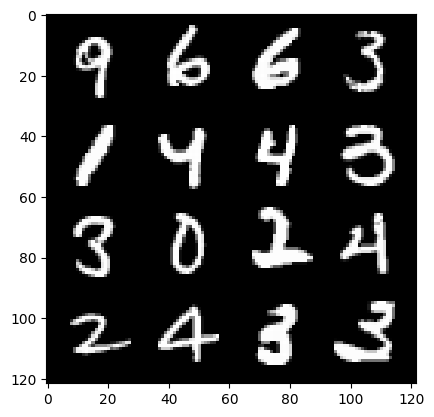

132: step 62100/ Gen loss: 1.7664166200160991 / Disc loss: 0.326483170191447


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


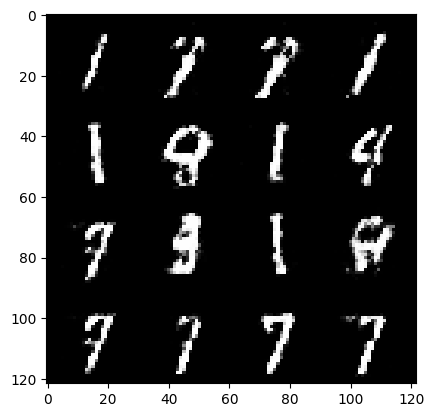

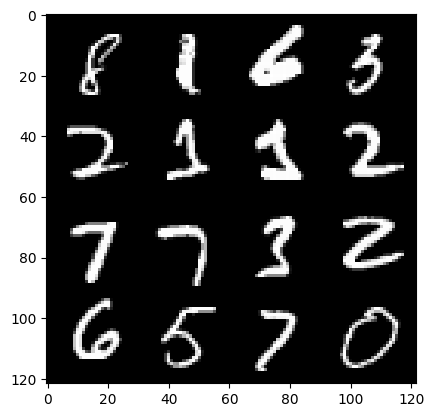

133: step 62400/ Gen loss: 1.8028774313131954 / Disc loss: 0.3191806589066982
stepped in to the loop


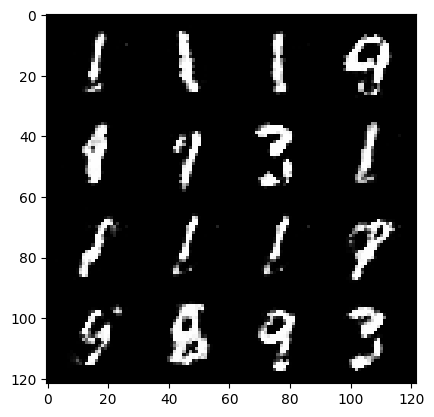

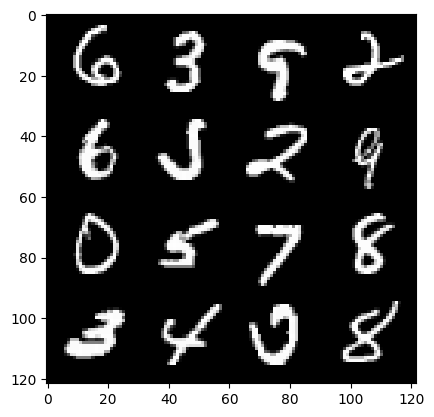

133: step 62700/ Gen loss: 1.8474263767401382 / Disc loss: 0.29487678964932745


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


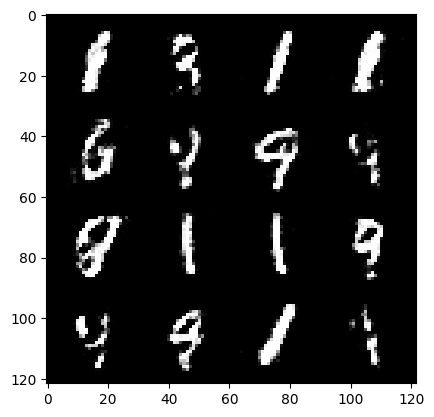

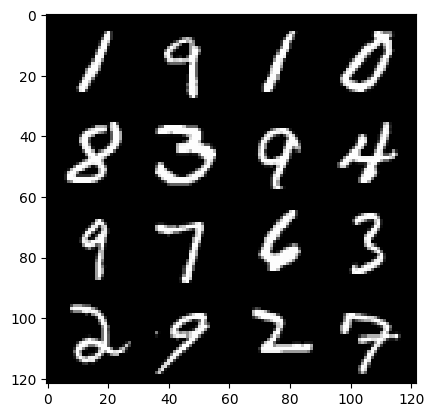

134: step 63000/ Gen loss: 1.8610118269920353 / Disc loss: 0.3106618216137092
stepped in to the loop


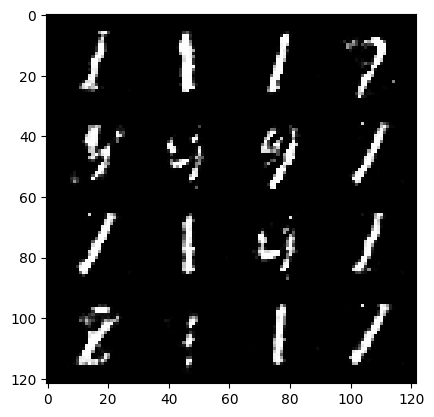

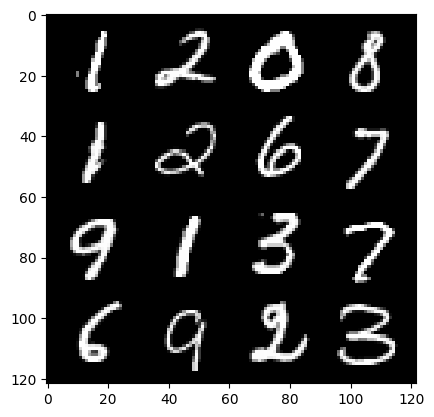

134: step 63300/ Gen loss: 1.7178221694628413 / Disc loss: 0.33195797900358825


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


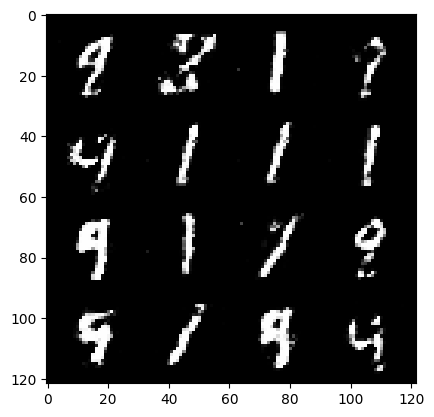

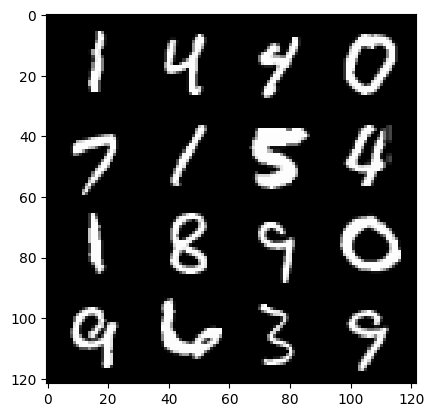

135: step 63600/ Gen loss: 1.7061816306908928 / Disc loss: 0.3351045600573224


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


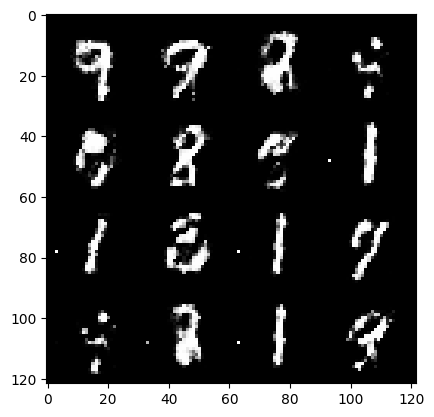

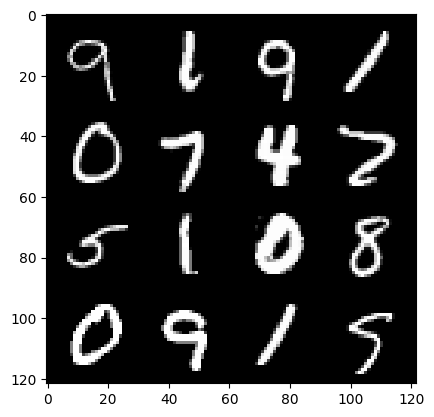

136: step 63900/ Gen loss: 1.6465109082063039 / Disc loss: 0.3850041033824287
stepped in to the loop


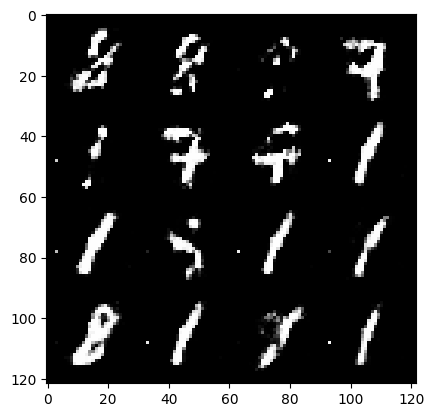

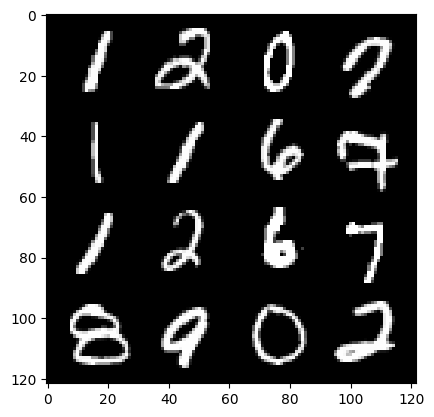

136: step 64200/ Gen loss: 1.6467135294278459 / Disc loss: 0.3482794521252316


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


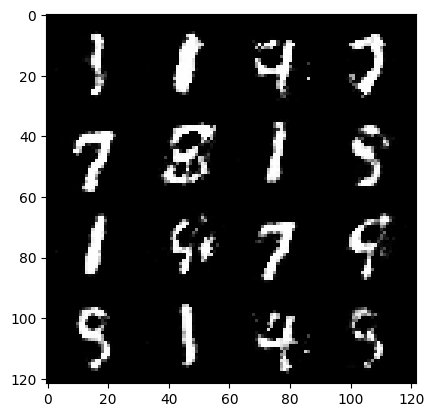

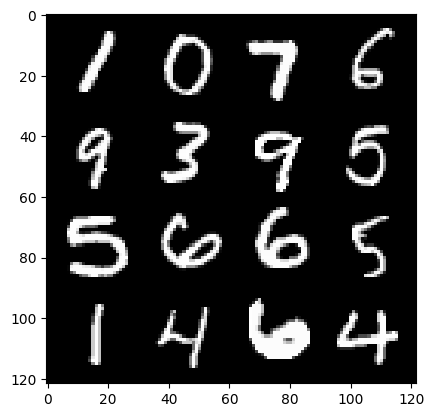

137: step 64500/ Gen loss: 1.658792162338893 / Disc loss: 0.33462744514147447


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


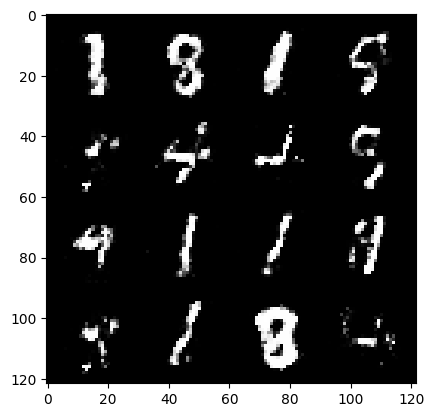

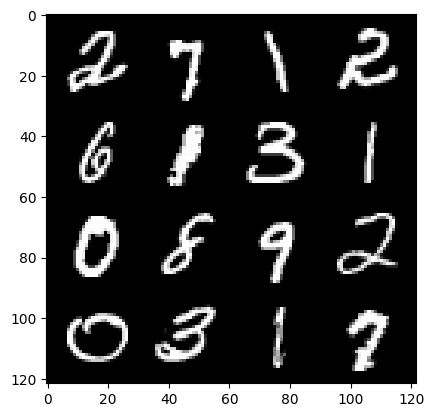

138: step 64800/ Gen loss: 1.7341973845163983 / Disc loss: 0.327015228420496
stepped in to the loop


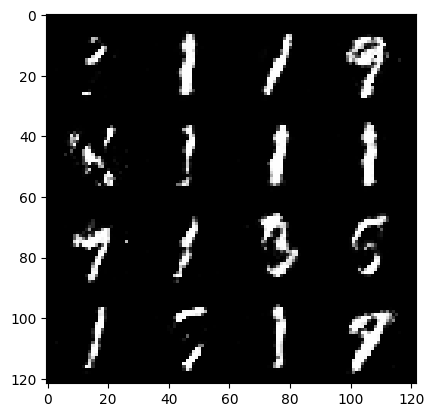

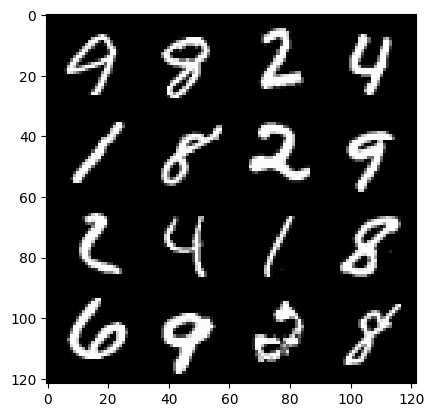

138: step 65100/ Gen loss: 1.8140637254714966 / Disc loss: 0.29577781776587175


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


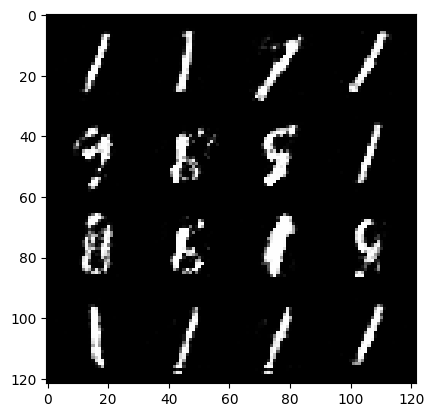

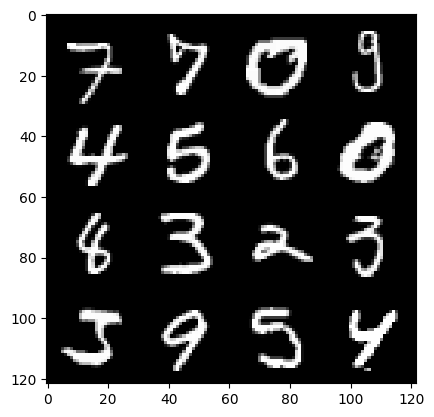

139: step 65400/ Gen loss: 1.8324502162138627 / Disc loss: 0.31080228855212555


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


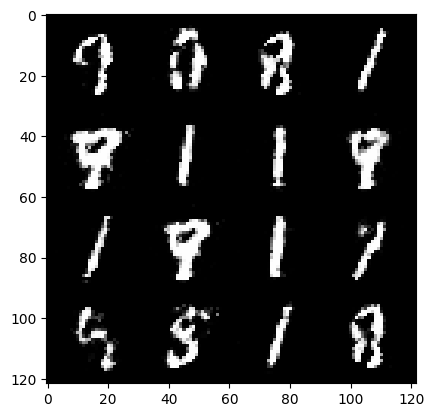

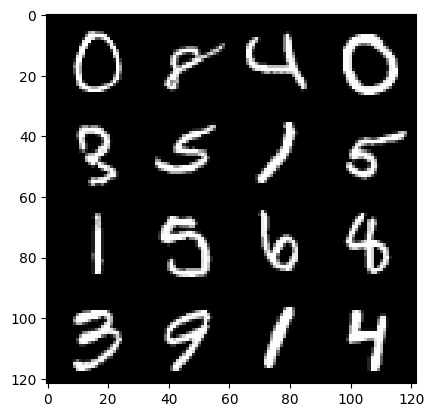

140: step 65700/ Gen loss: 1.7312637869517011 / Disc loss: 0.33486596559484794
stepped in to the loop


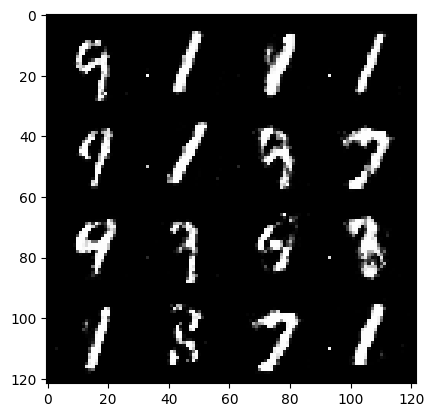

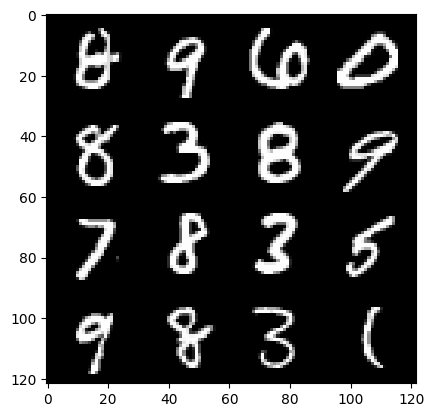

140: step 66000/ Gen loss: 1.6939740816752114 / Disc loss: 0.3664764841894309


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


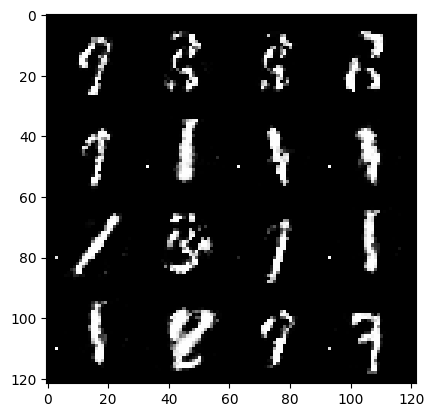

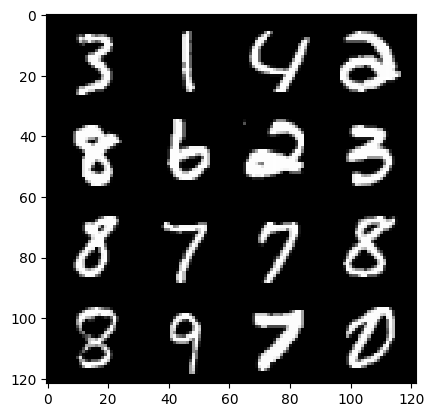

141: step 66300/ Gen loss: 1.620119811296463 / Disc loss: 0.37028314491113


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


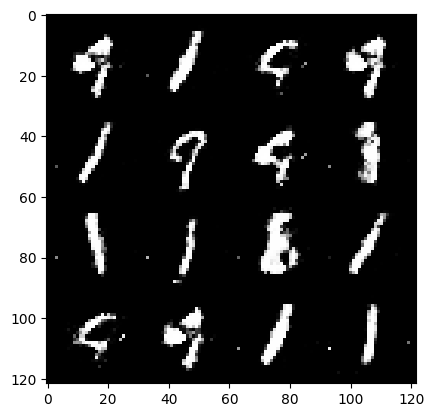

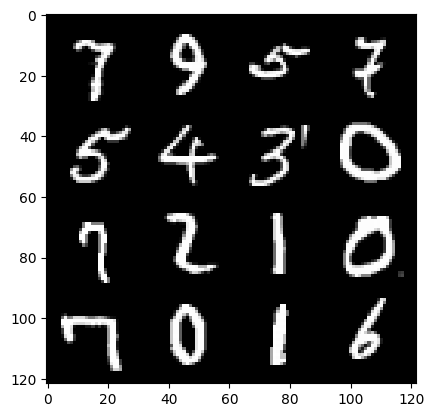

142: step 66600/ Gen loss: 1.7390898191928852 / Disc loss: 0.33217086339990315
stepped in to the loop


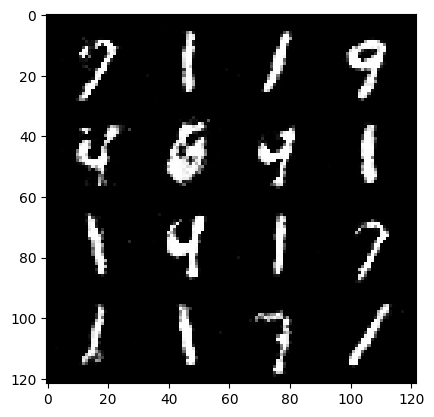

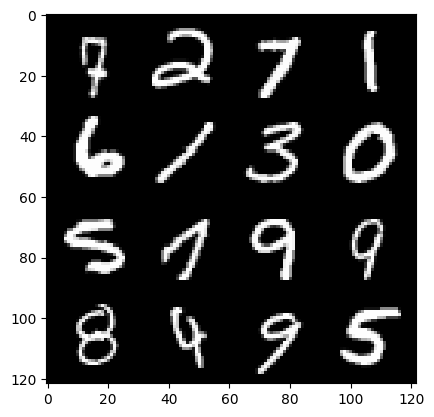

142: step 66900/ Gen loss: 1.7674579620361315 / Disc loss: 0.31704276740550996


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


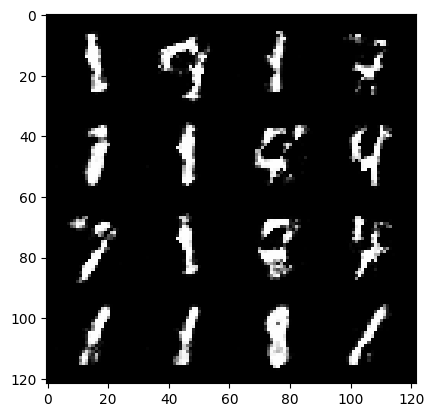

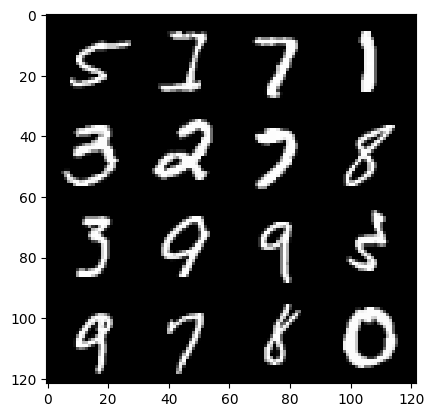

143: step 67200/ Gen loss: 1.6753076140085865 / Disc loss: 0.3494777699808281
stepped in to the loop


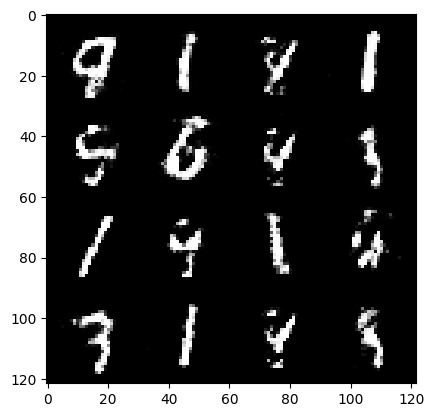

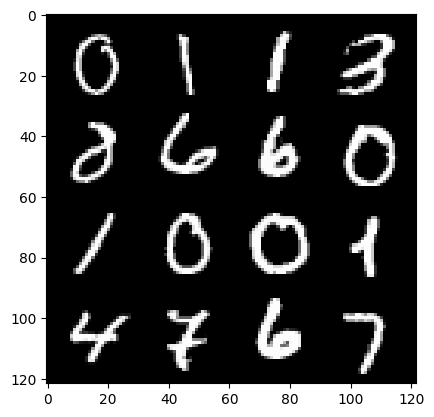

143: step 67500/ Gen loss: 1.5815332829952244 / Disc loss: 0.3578636435667674


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


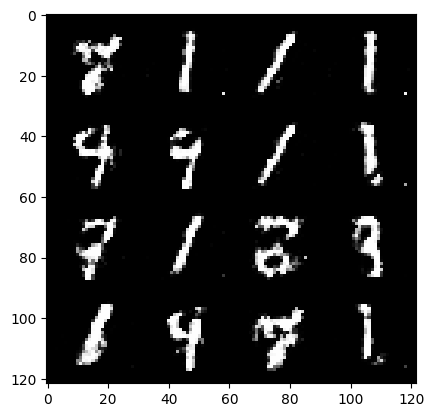

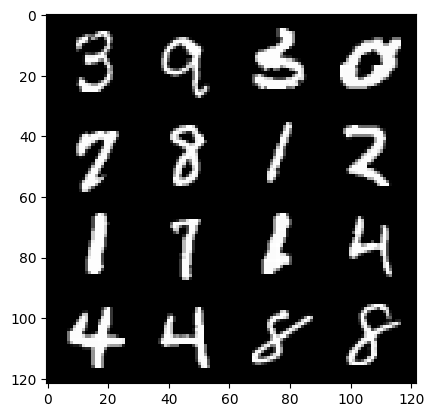

144: step 67800/ Gen loss: 1.6163273906707754 / Disc loss: 0.35085705906152703


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


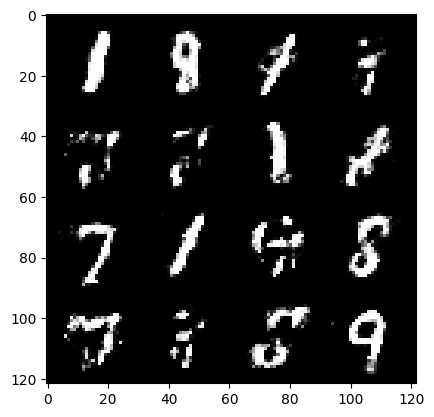

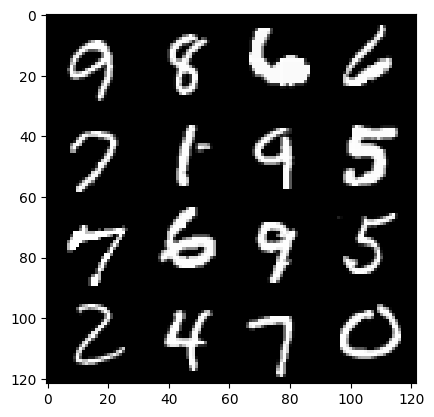

145: step 68100/ Gen loss: 1.637814935445786 / Disc loss: 0.35176860223213835
stepped in to the loop


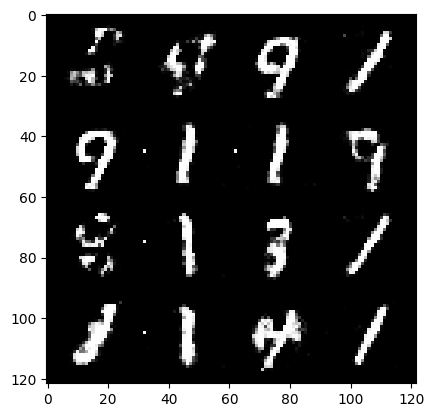

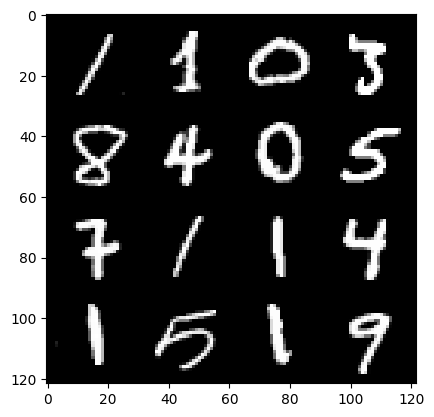

145: step 68400/ Gen loss: 1.5940358106295272 / Disc loss: 0.3620712393522263


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


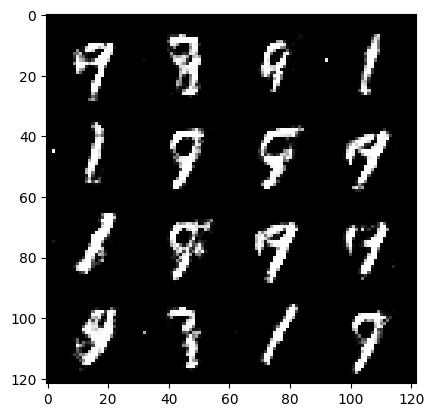

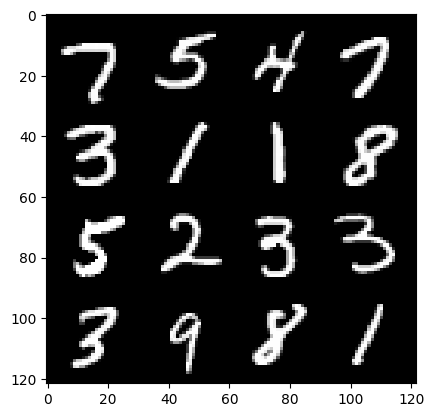

146: step 68700/ Gen loss: 1.6114552720387778 / Disc loss: 0.36425835361083336


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


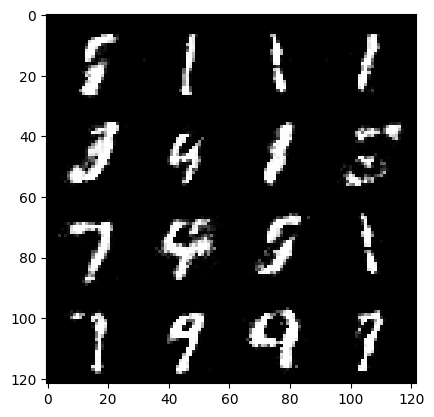

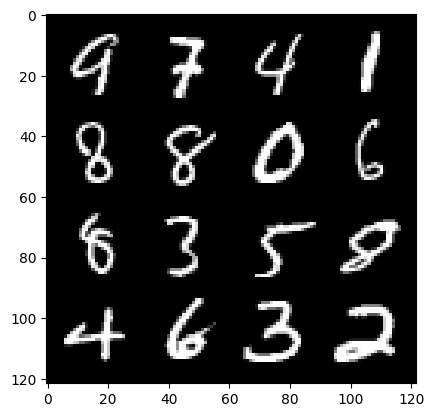

147: step 69000/ Gen loss: 1.581031467914581 / Disc loss: 0.3598185902833936
stepped in to the loop


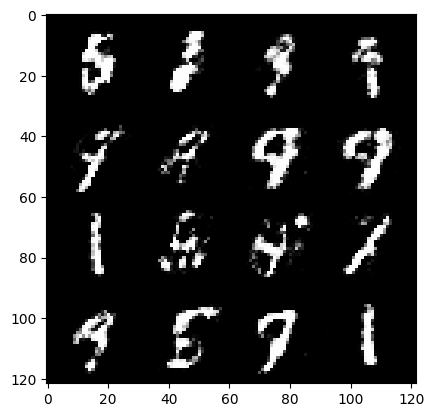

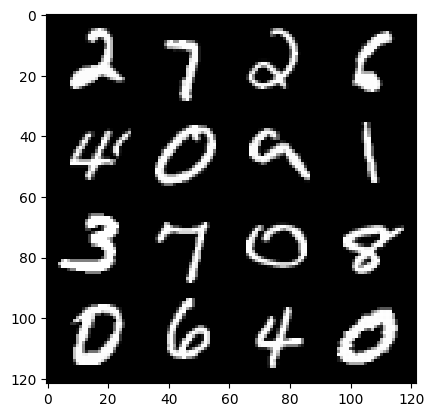

147: step 69300/ Gen loss: 1.601597733894985 / Disc loss: 0.36664255628983156


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


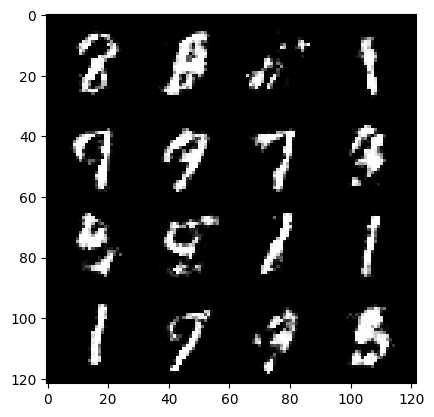

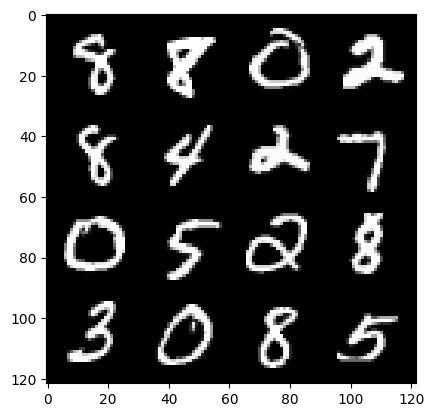

148: step 69600/ Gen loss: 1.6257699724038448 / Disc loss: 0.353192888299624


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


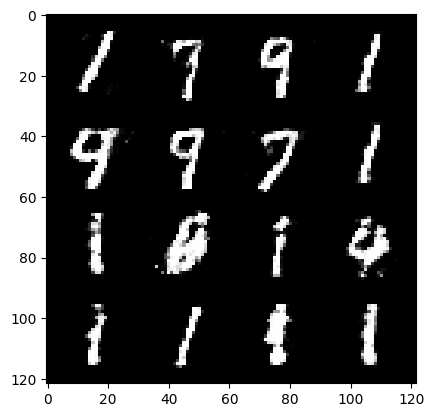

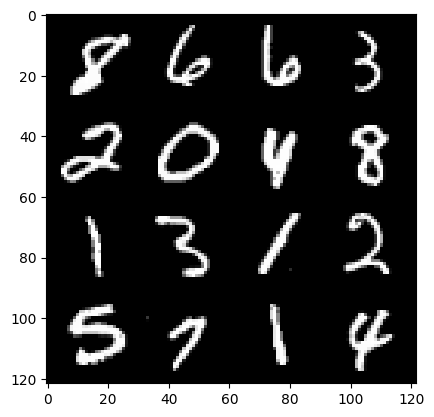

149: step 69900/ Gen loss: 1.5698375900586448 / Disc loss: 0.3736868912974993
stepped in to the loop


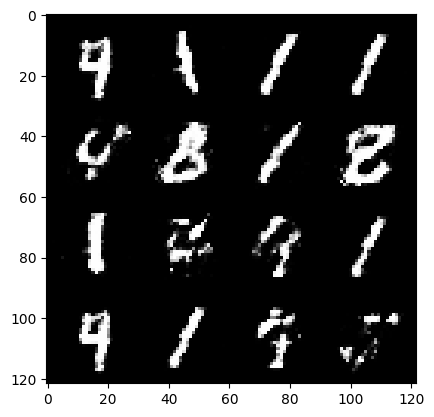

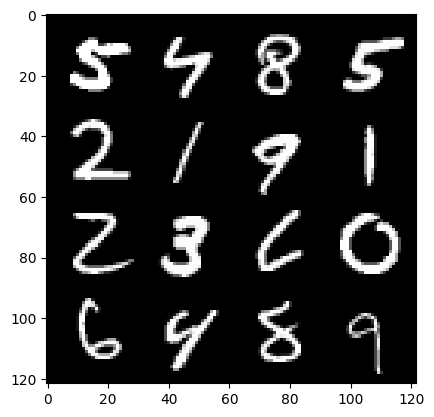

149: step 70200/ Gen loss: 1.5429538702964778 / Disc loss: 0.36856072992086414


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


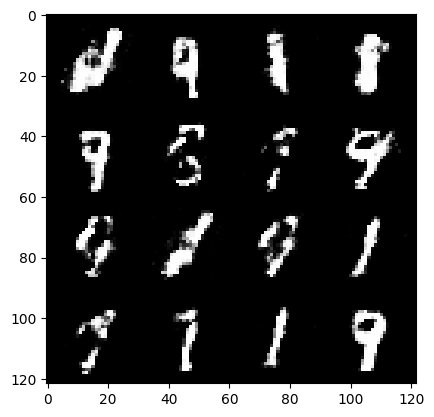

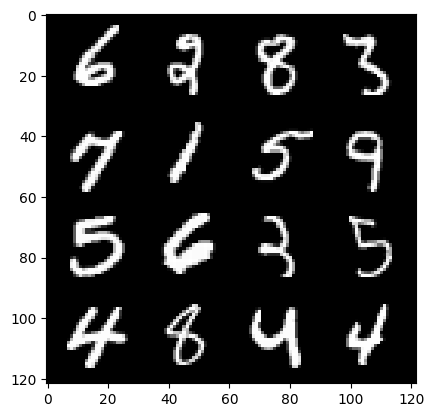

150: step 70500/ Gen loss: 1.5228322474161773 / Disc loss: 0.37793491234382
stepped in to the loop


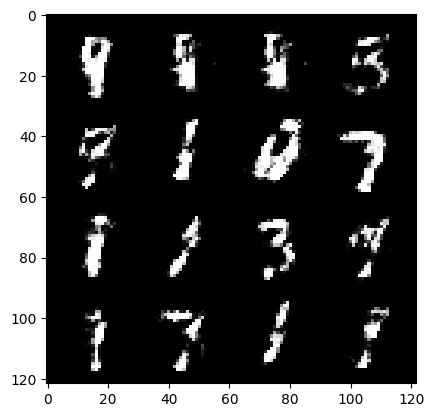

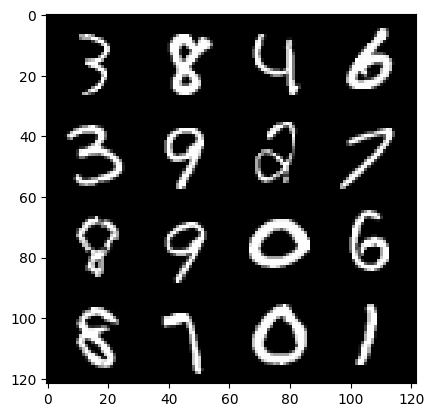

150: step 70800/ Gen loss: 1.5978319386641189 / Disc loss: 0.36244960993528325


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


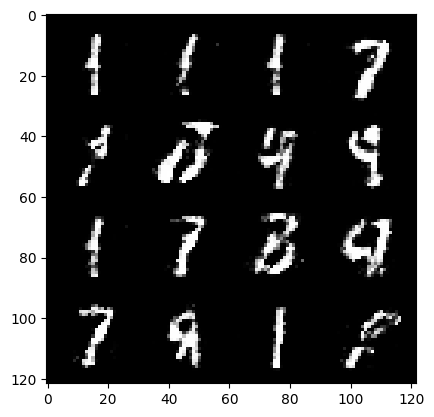

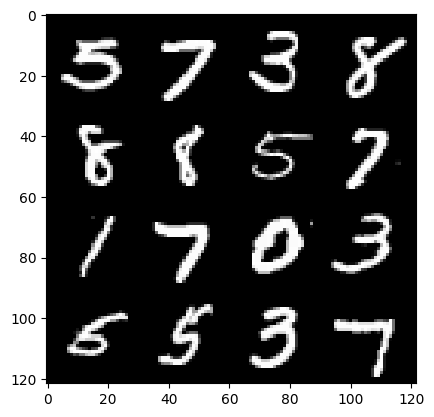

151: step 71100/ Gen loss: 1.573338730335235 / Disc loss: 0.35359613935152695


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


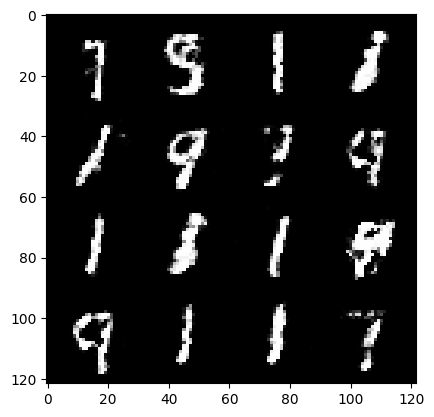

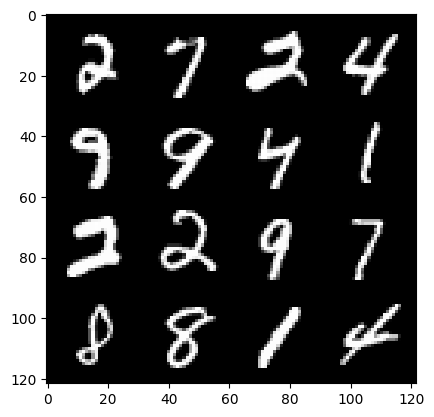

152: step 71400/ Gen loss: 1.6461567950248726 / Disc loss: 0.3507430957754454
stepped in to the loop


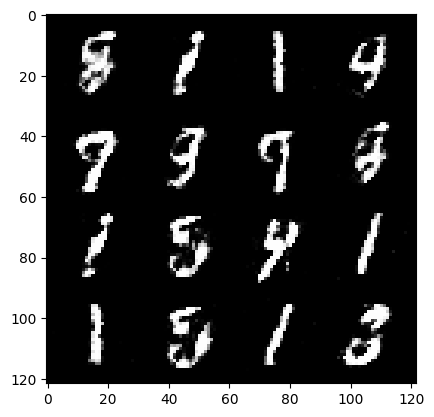

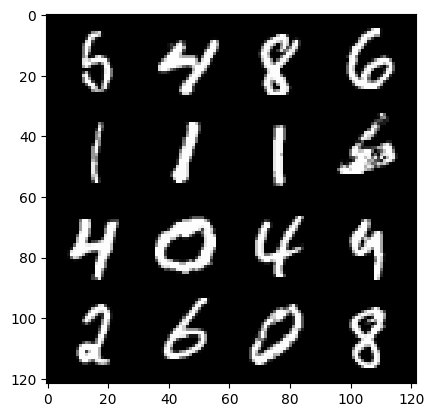

152: step 71700/ Gen loss: 1.6477858543396002 / Disc loss: 0.3448746110995609


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


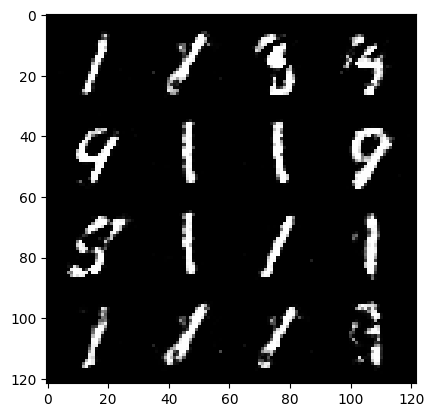

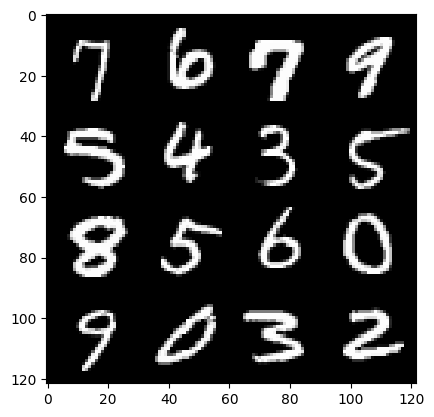

153: step 72000/ Gen loss: 1.7598758133252466 / Disc loss: 0.3291152323782445


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


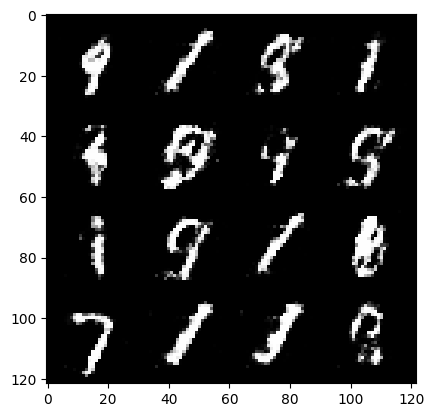

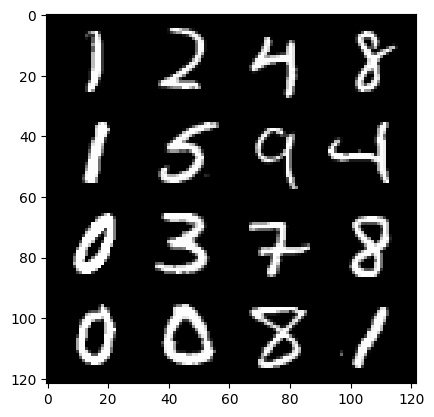

154: step 72300/ Gen loss: 1.7156271076202398 / Disc loss: 0.32922757178544987
stepped in to the loop


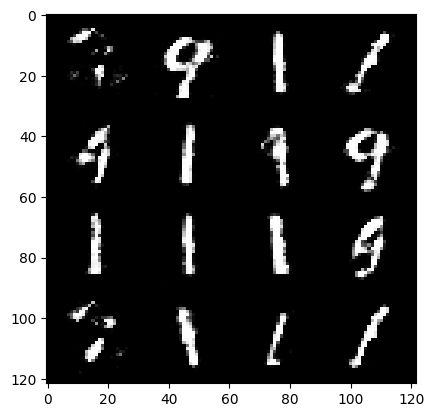

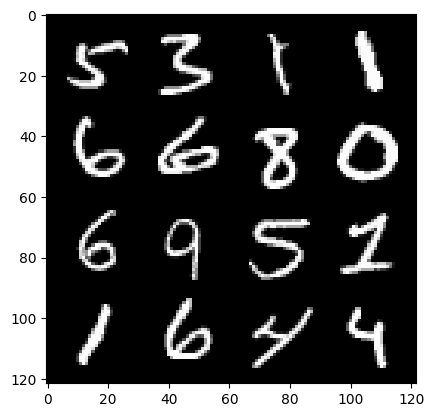

154: step 72600/ Gen loss: 1.75396267414093 / Disc loss: 0.32316384613513943


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


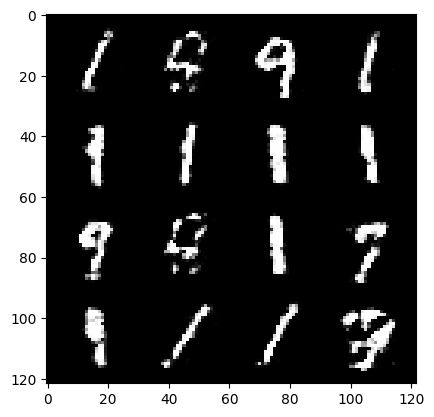

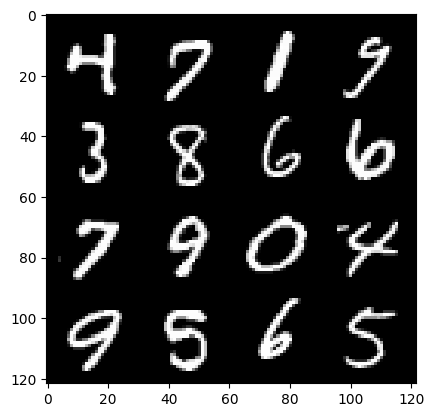

155: step 72900/ Gen loss: 1.6101460933685283 / Disc loss: 0.3485178336501123


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


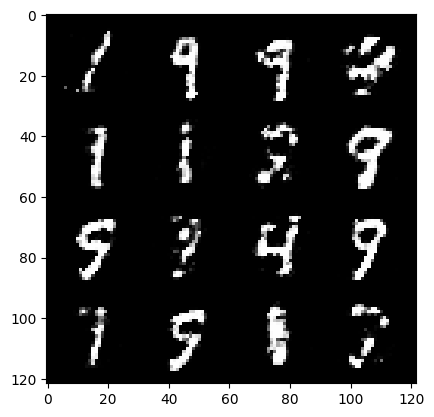

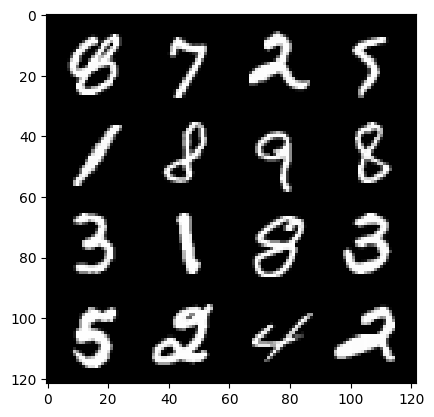

156: step 73200/ Gen loss: 1.6063538054625204 / Disc loss: 0.3468997862438358
stepped in to the loop


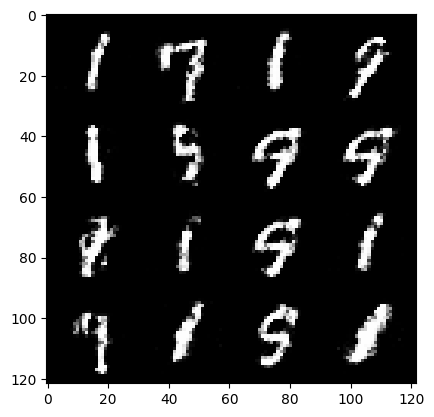

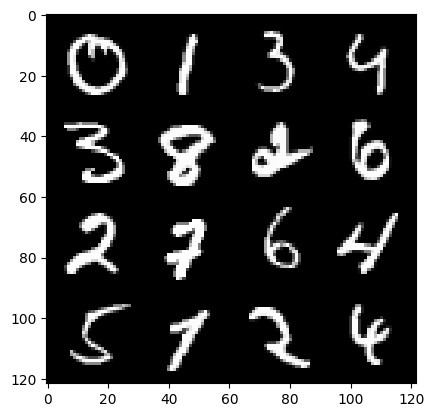

156: step 73500/ Gen loss: 1.6281274620691932 / Disc loss: 0.34343244194984435


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


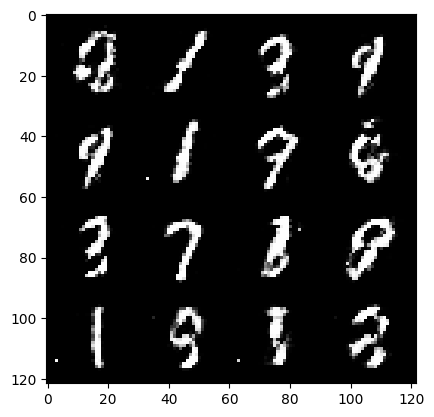

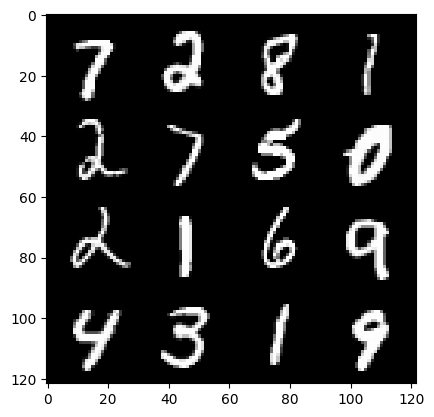

157: step 73800/ Gen loss: 1.586340808471044 / Disc loss: 0.3552771093944708
stepped in to the loop


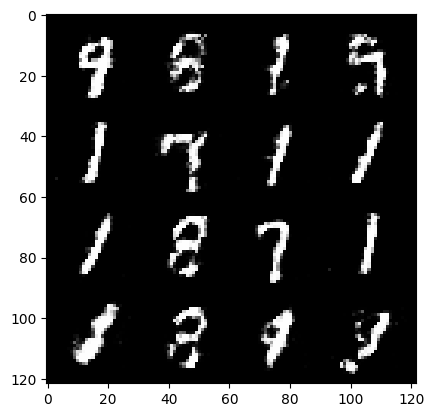

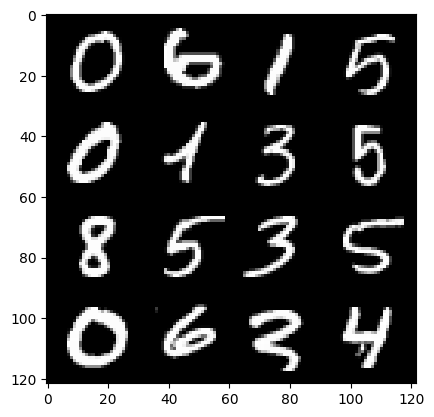

157: step 74100/ Gen loss: 1.640124935309092 / Disc loss: 0.3577050552765529


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


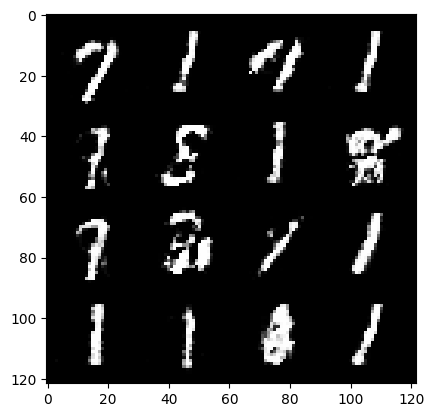

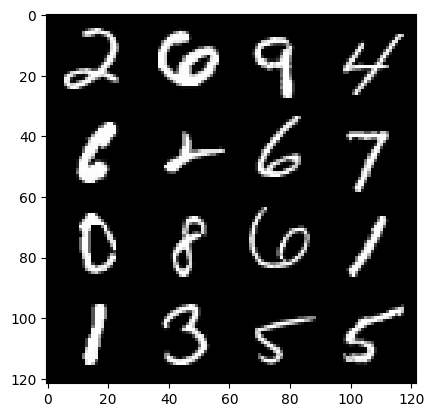

158: step 74400/ Gen loss: 1.596227921247482 / Disc loss: 0.35843423753976816


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


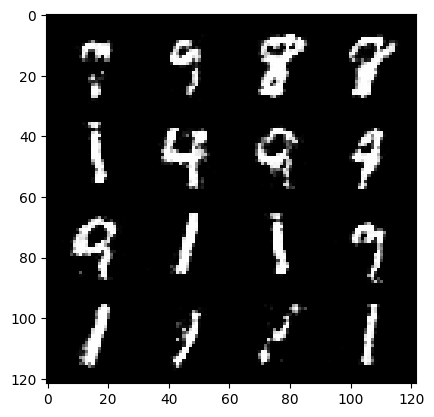

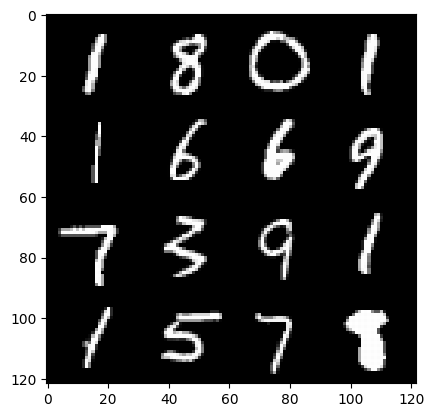

159: step 74700/ Gen loss: 1.6053573032220196 / Disc loss: 0.3601487262050312
stepped in to the loop


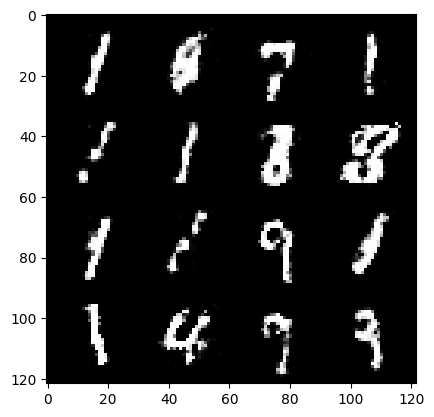

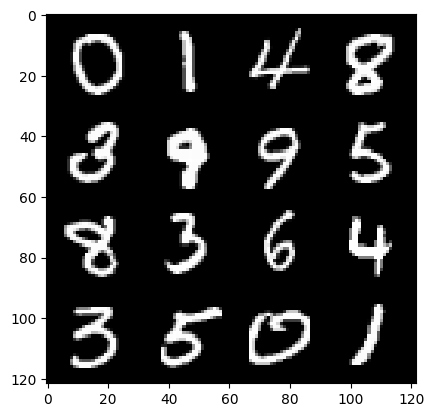

159: step 75000/ Gen loss: 1.6439306592941278 / Disc loss: 0.34321568990747126


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


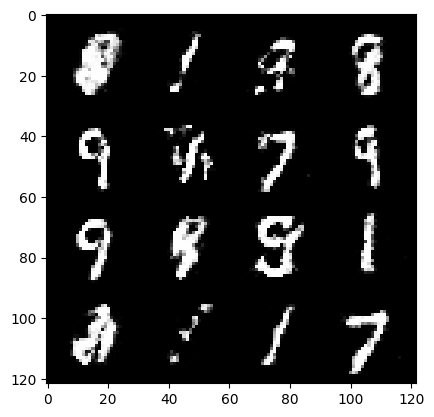

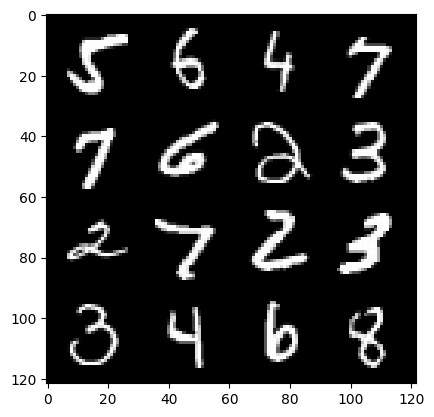

160: step 75300/ Gen loss: 1.7270659240086876 / Disc loss: 0.3269971051812173


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


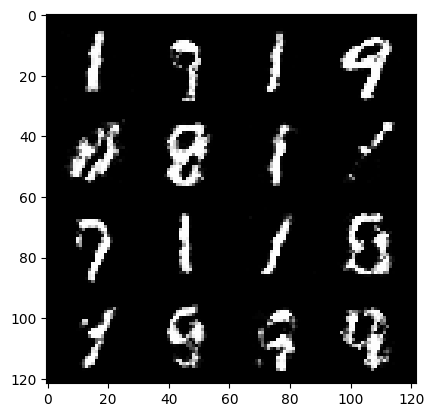

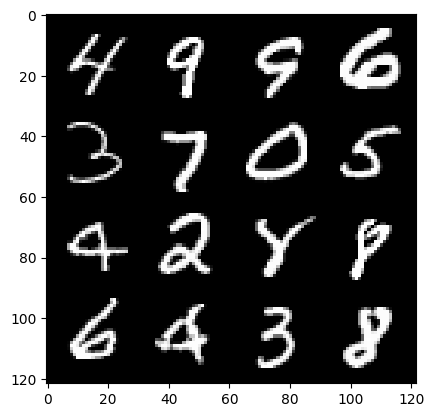

161: step 75600/ Gen loss: 1.6268558621406557 / Disc loss: 0.3592322834332786
stepped in to the loop


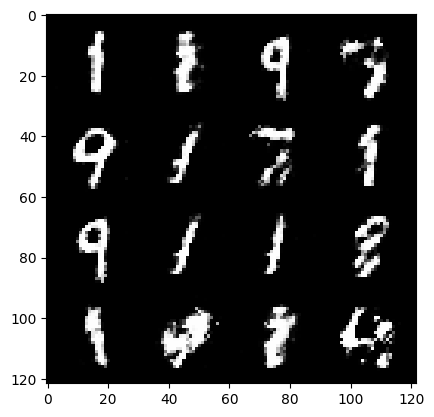

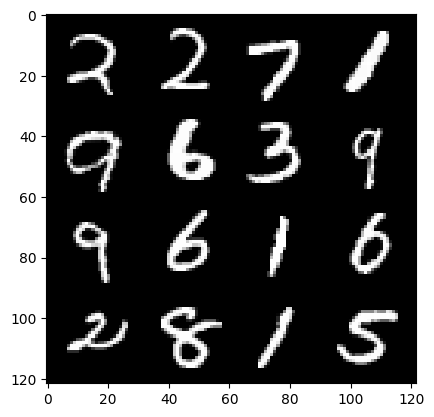

161: step 75900/ Gen loss: 1.619792807102202 / Disc loss: 0.348934067587058


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


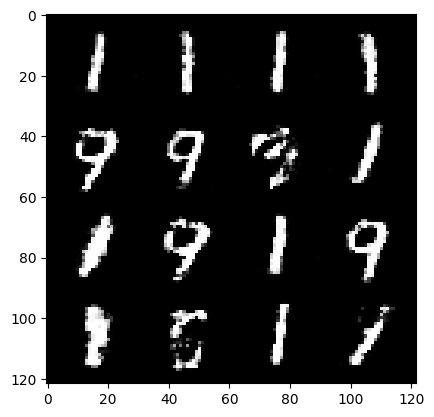

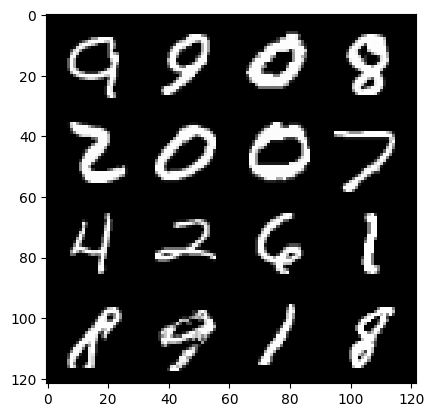

162: step 76200/ Gen loss: 1.6597510910034174 / Disc loss: 0.3550216582417489


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


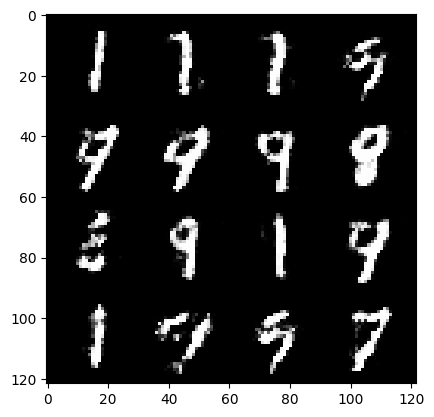

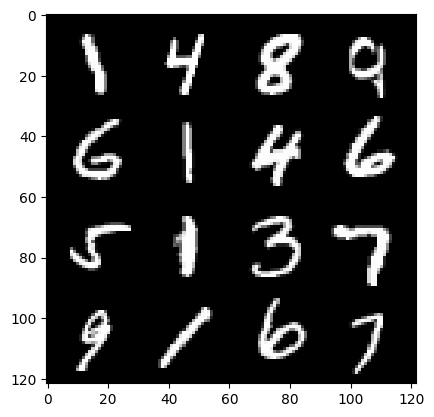

163: step 76500/ Gen loss: 1.5943301137288408 / Disc loss: 0.3556341796120006
stepped in to the loop


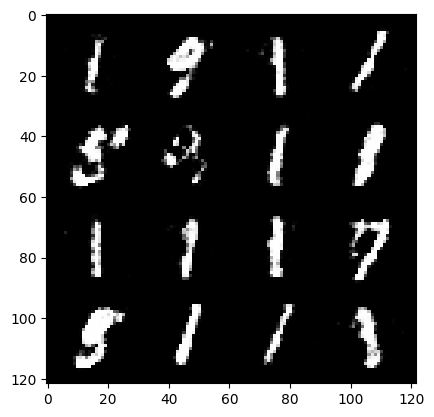

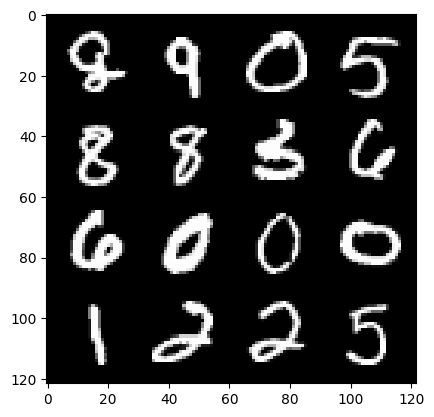

163: step 76800/ Gen loss: 1.5833466303348536 / Disc loss: 0.3546139687299728


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


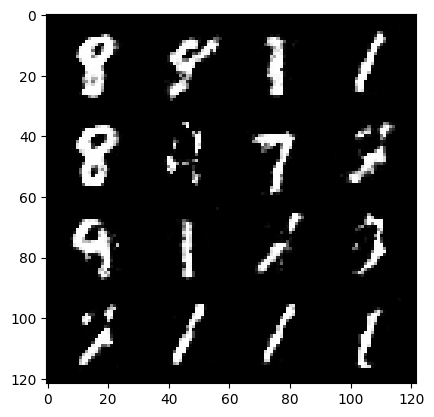

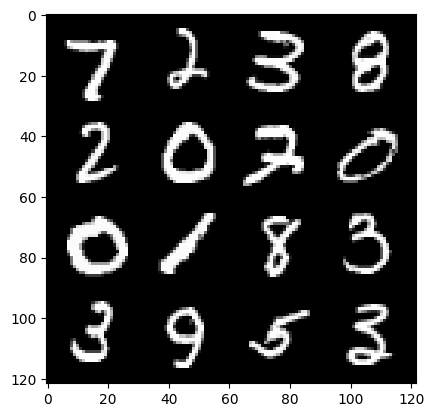

164: step 77100/ Gen loss: 1.5406587326526633 / Disc loss: 0.3625948330760002


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


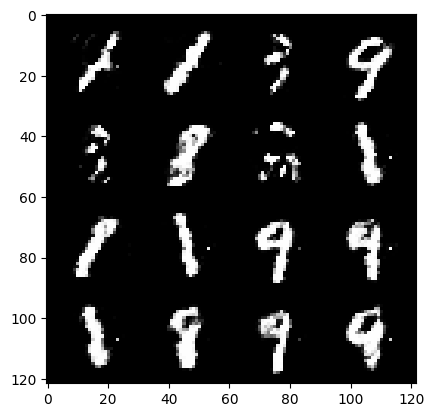

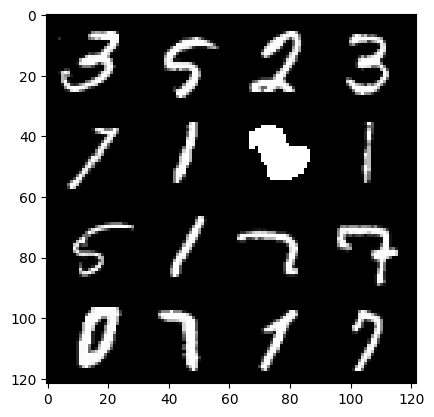

165: step 77400/ Gen loss: 1.6963803156216932 / Disc loss: 0.33311008880535736
stepped in to the loop


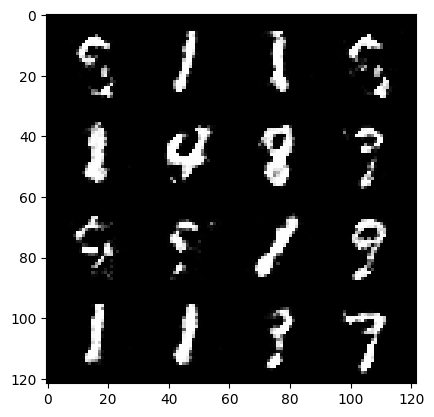

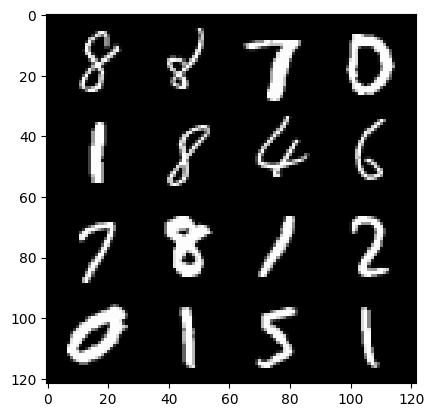

165: step 77700/ Gen loss: 1.5268013878663382 / Disc loss: 0.3745529296994208


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


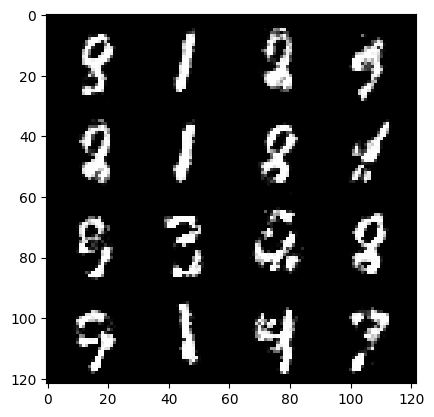

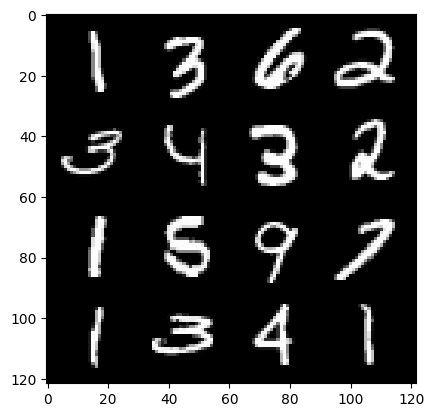

166: step 78000/ Gen loss: 1.5981220503648124 / Disc loss: 0.3658700374762217
stepped in to the loop


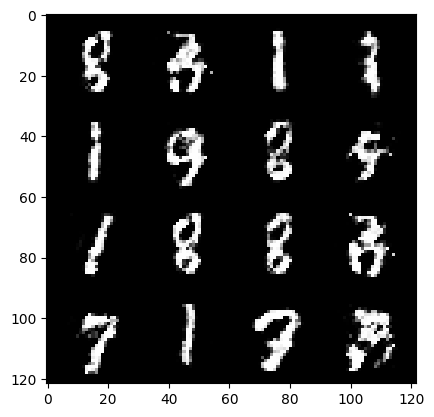

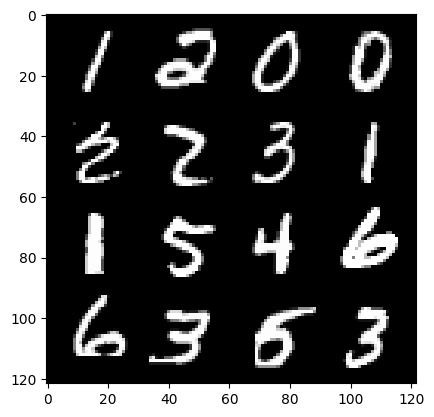

166: step 78300/ Gen loss: 1.5617255226771036 / Disc loss: 0.37116364002227775


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


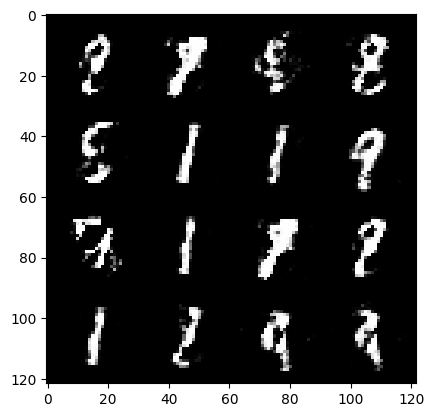

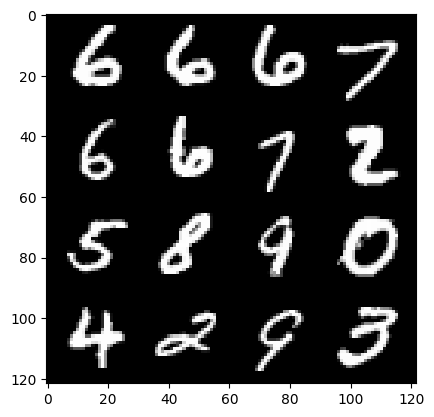

167: step 78600/ Gen loss: 1.656677651007971 / Disc loss: 0.34272333318988485


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


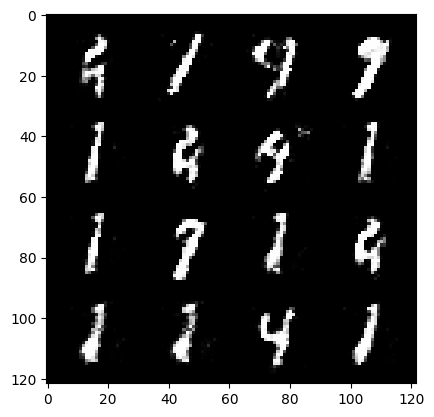

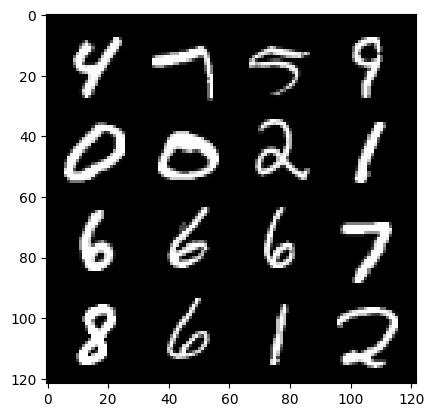

168: step 78900/ Gen loss: 1.8110233537356073 / Disc loss: 0.3079149880011876
stepped in to the loop


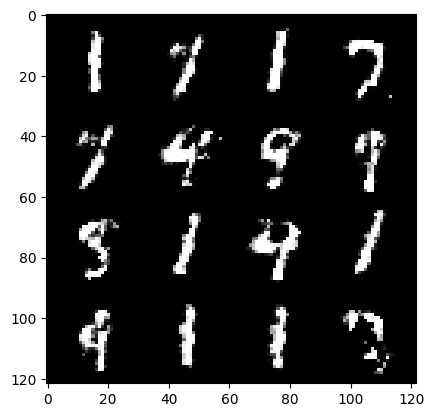

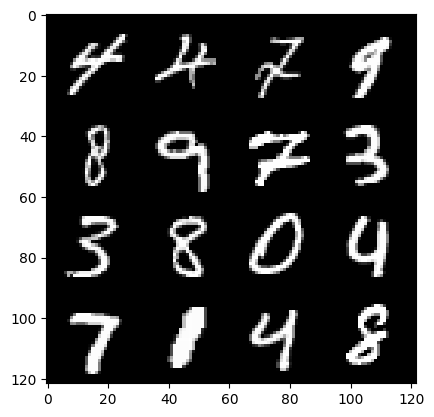

168: step 79200/ Gen loss: 1.825554493268331 / Disc loss: 0.31492512553930285


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


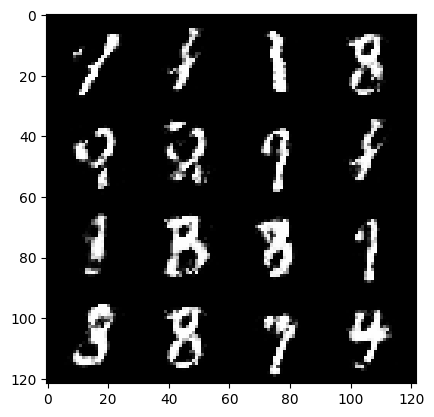

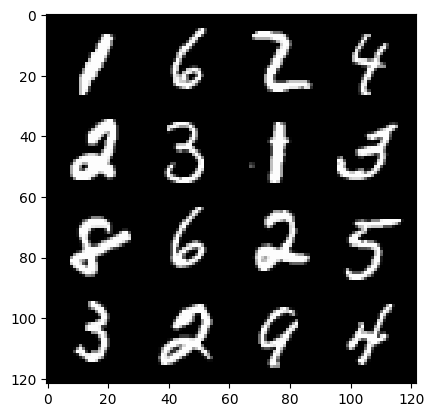

169: step 79500/ Gen loss: 1.7921850085258495 / Disc loss: 0.32899233534932115


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


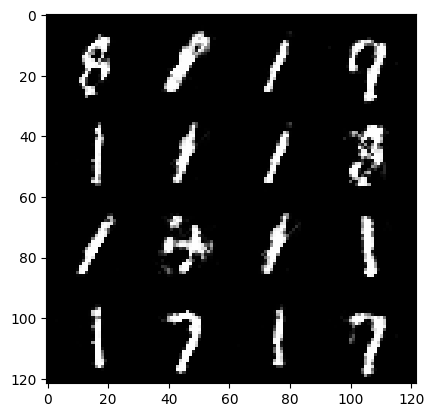

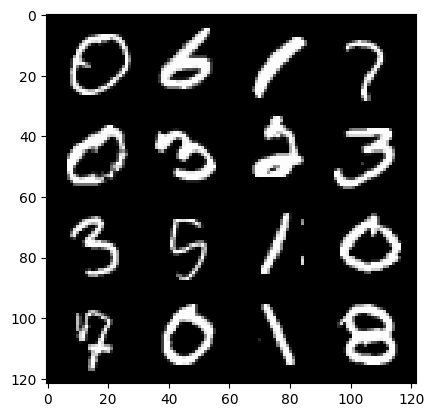

170: step 79800/ Gen loss: 1.63027195294698 / Disc loss: 0.33846035053332657
stepped in to the loop


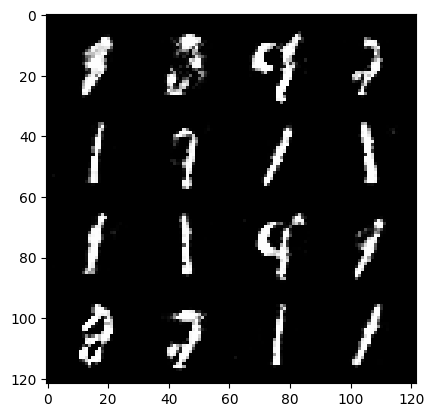

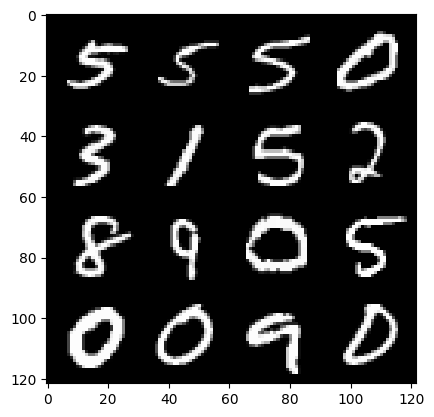

170: step 80100/ Gen loss: 1.6191023925940202 / Disc loss: 0.3423422604799271


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


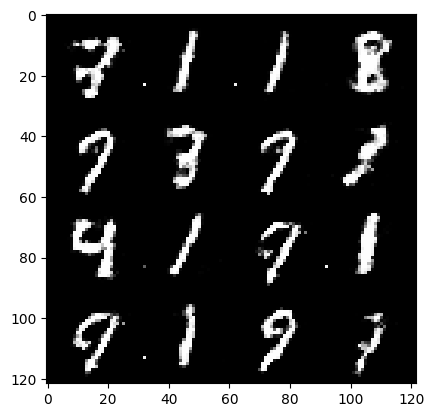

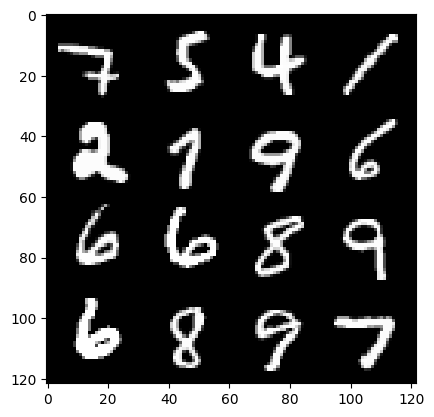

171: step 80400/ Gen loss: 1.5585224878787989 / Disc loss: 0.38128415197134014


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


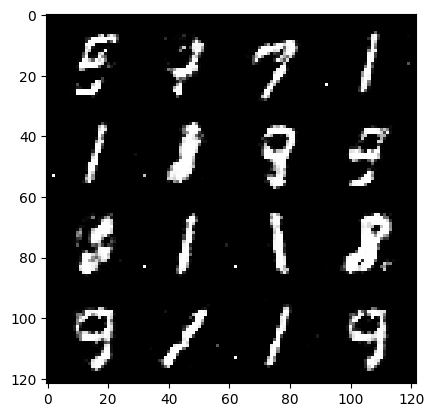

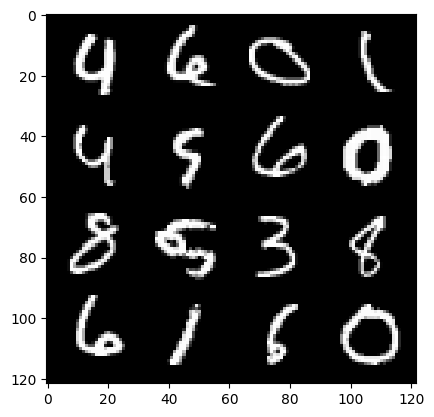

172: step 80700/ Gen loss: 1.6520587682723993 / Disc loss: 0.34448990737398444
stepped in to the loop


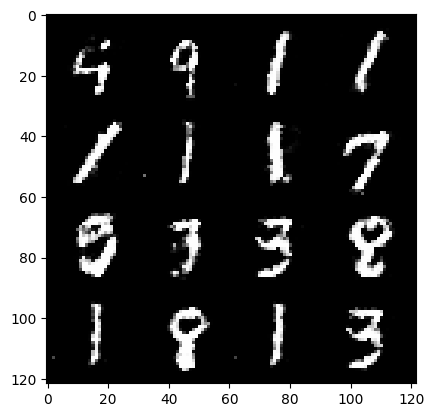

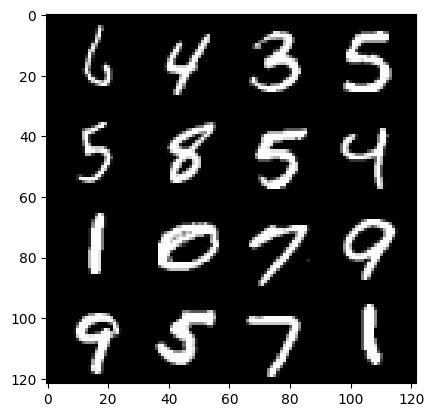

172: step 81000/ Gen loss: 1.7633826589584352 / Disc loss: 0.31273917252818756


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


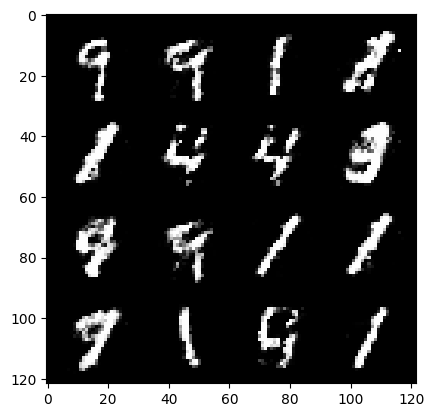

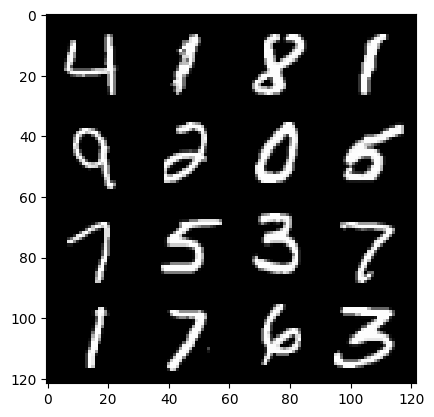

173: step 81300/ Gen loss: 1.6421239864826185 / Disc loss: 0.34547045658032105
stepped in to the loop


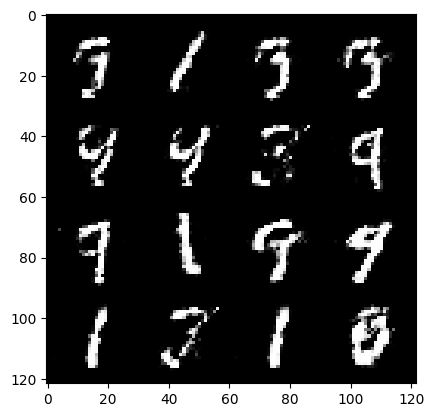

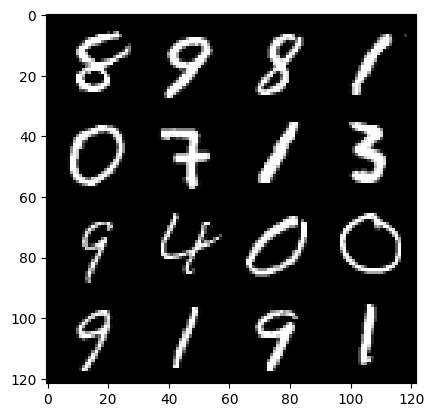

173: step 81600/ Gen loss: 1.5533365253607434 / Disc loss: 0.3684441511829693


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


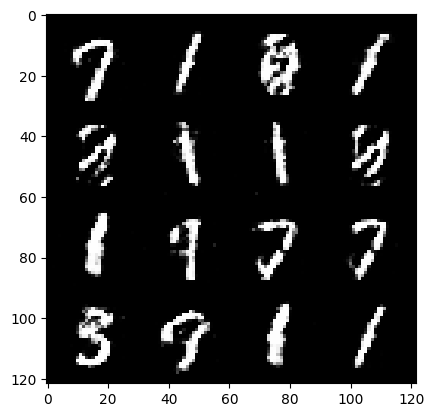

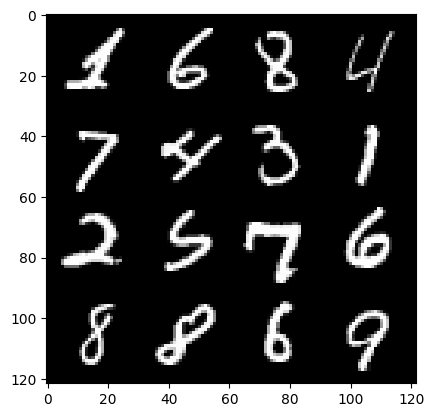

174: step 81900/ Gen loss: 1.4792091560363771 / Disc loss: 0.37819512645403563


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


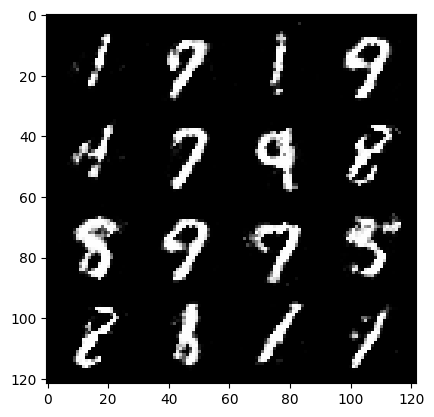

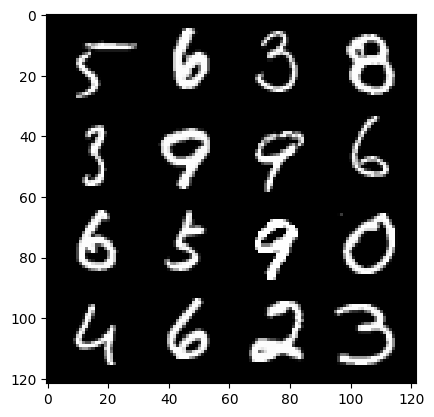

175: step 82200/ Gen loss: 1.6005193960666655 / Disc loss: 0.35361605306466426
stepped in to the loop


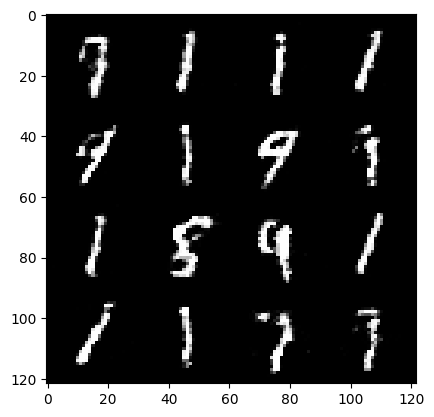

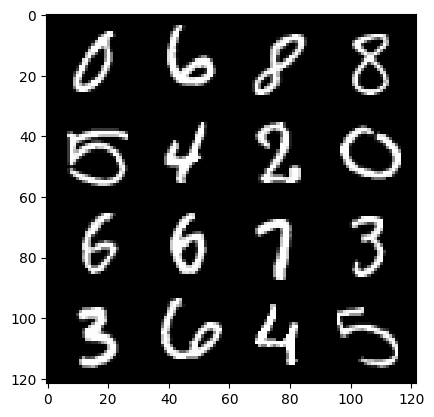

175: step 82500/ Gen loss: 1.5558802723884582 / Disc loss: 0.36071761270364117


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


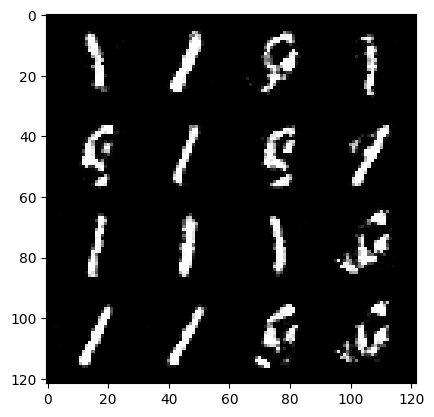

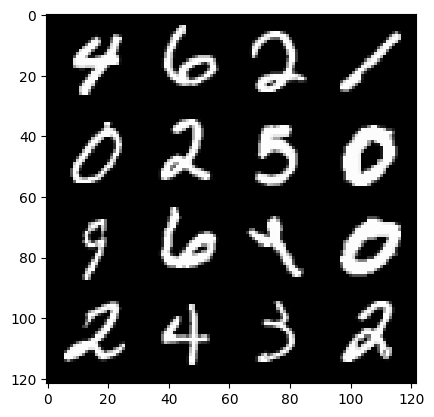

176: step 82800/ Gen loss: 1.610417912006379 / Disc loss: 0.3508092547456423


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


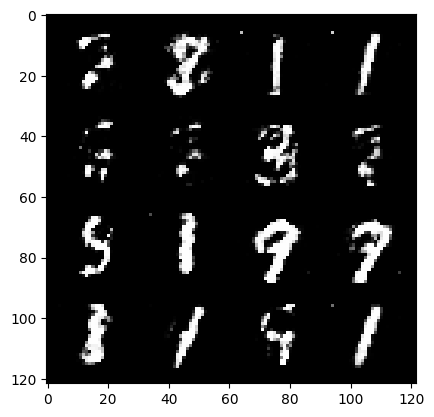

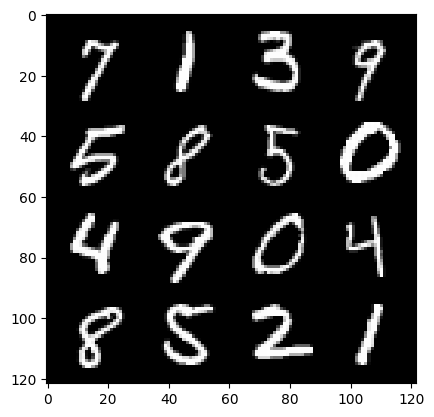

177: step 83100/ Gen loss: 1.5247760109106698 / Disc loss: 0.3679528749982517
stepped in to the loop


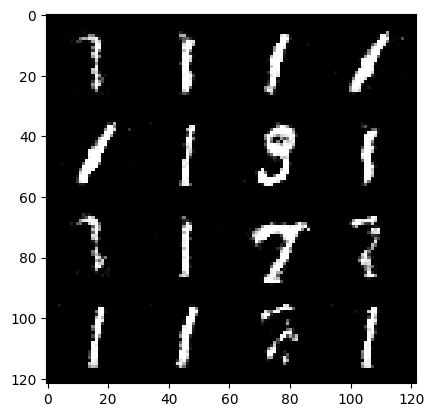

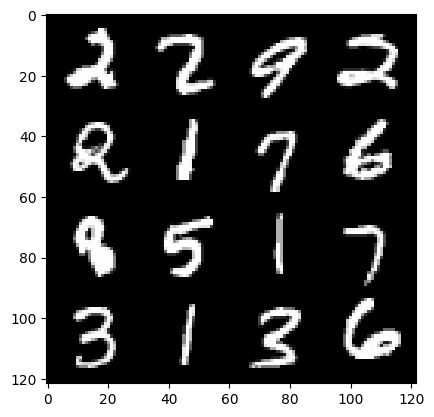

177: step 83400/ Gen loss: 1.5695070918401077 / Disc loss: 0.3550477819641434


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


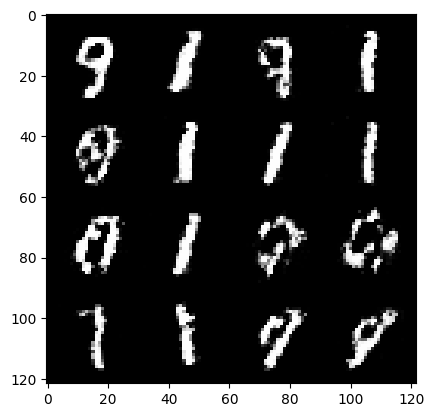

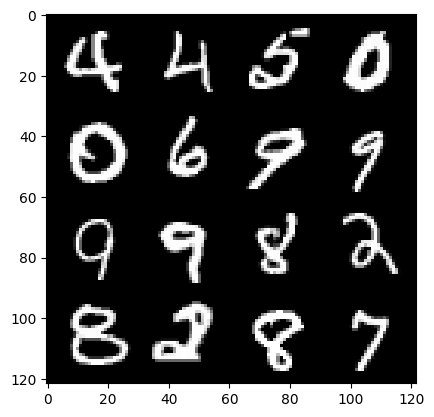

178: step 83700/ Gen loss: 1.588824059963226 / Disc loss: 0.36838257720073053


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


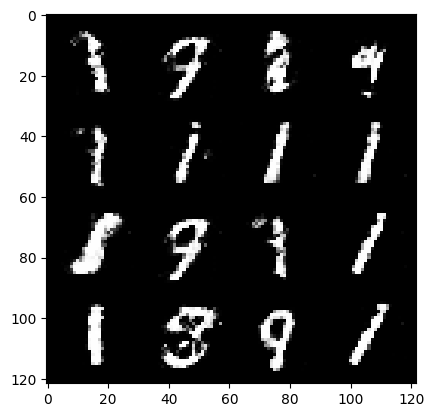

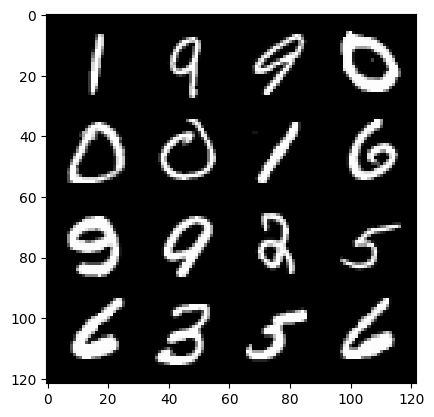

179: step 84000/ Gen loss: 1.6092740694681797 / Disc loss: 0.3569154044985771
stepped in to the loop


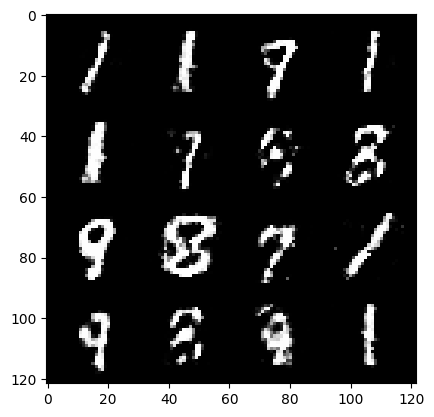

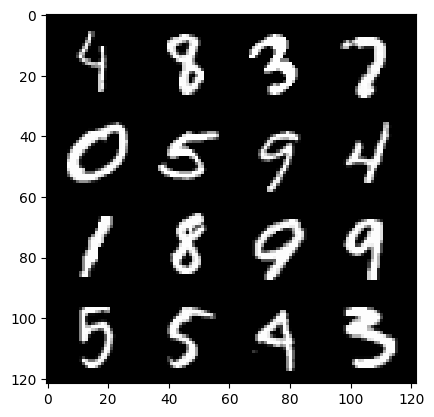

179: step 84300/ Gen loss: 1.5938467423121134 / Disc loss: 0.3560147661964098


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


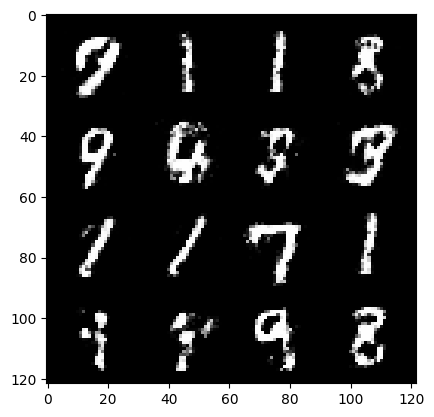

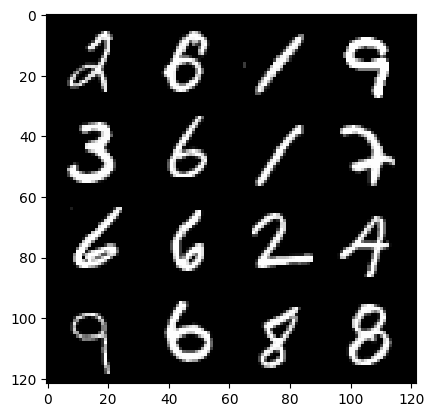

180: step 84600/ Gen loss: 1.4759385387102741 / Disc loss: 0.3828961215416591


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


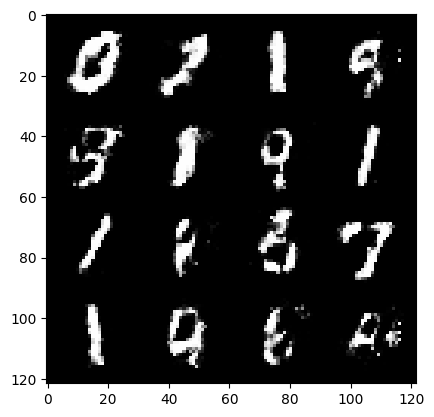

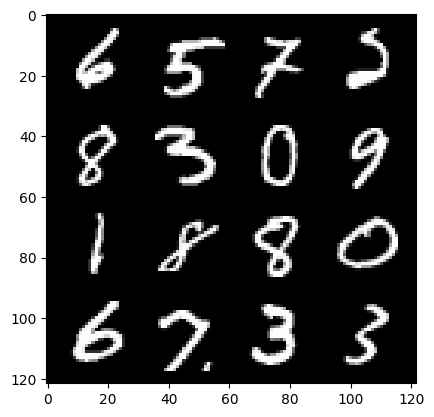

181: step 84900/ Gen loss: 1.4729328858852384 / Disc loss: 0.3833099775513013
stepped in to the loop


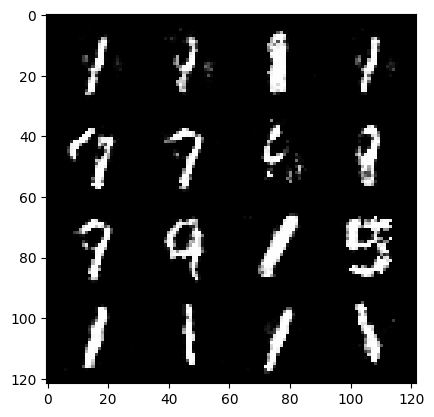

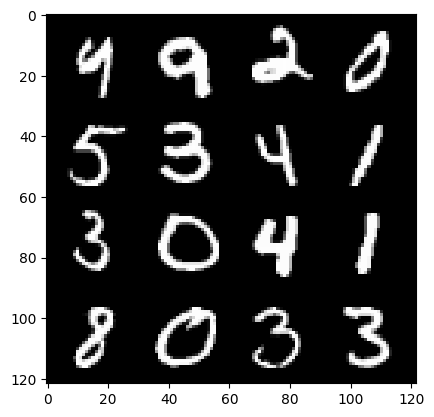

181: step 85200/ Gen loss: 1.494322321414948 / Disc loss: 0.391984087228775


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


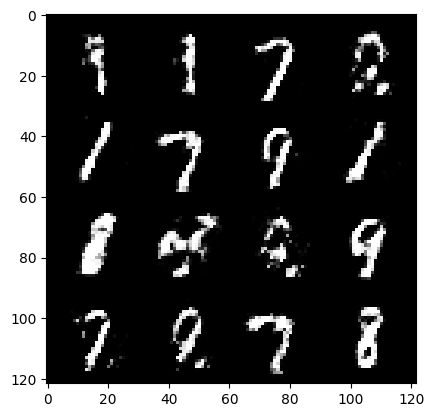

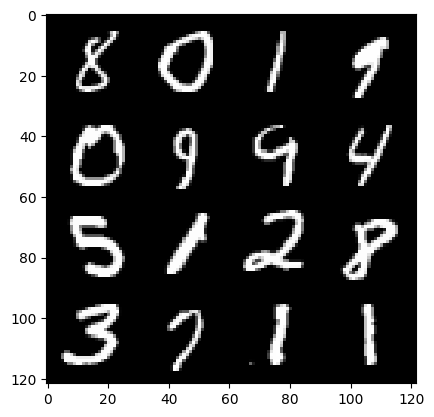

182: step 85500/ Gen loss: 1.516668725013733 / Disc loss: 0.38275183618068687
stepped in to the loop


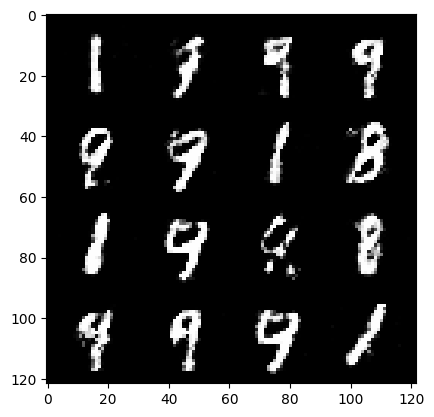

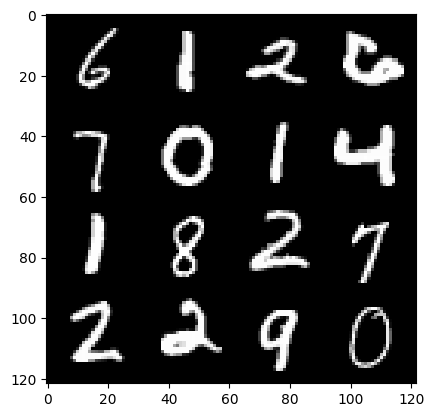

182: step 85800/ Gen loss: 1.502583445707957 / Disc loss: 0.3797437329093615


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


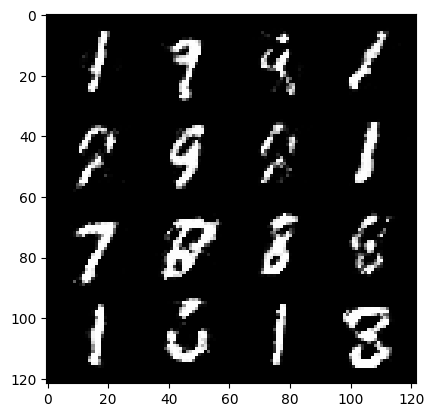

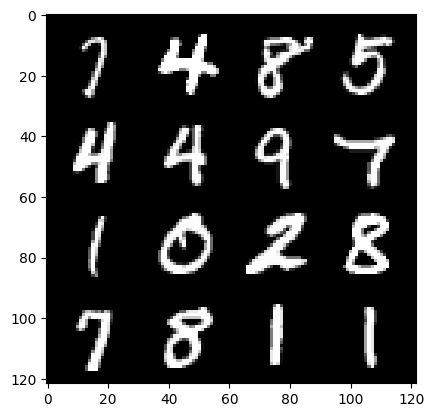

183: step 86100/ Gen loss: 1.4999797558784485 / Disc loss: 0.376307502289613


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


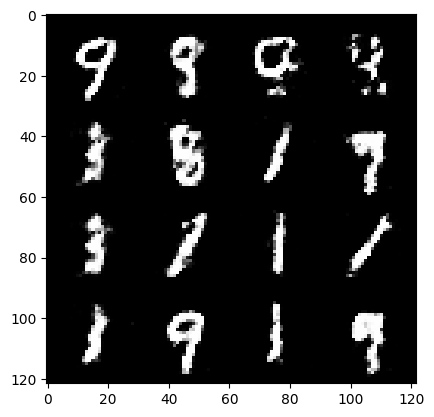

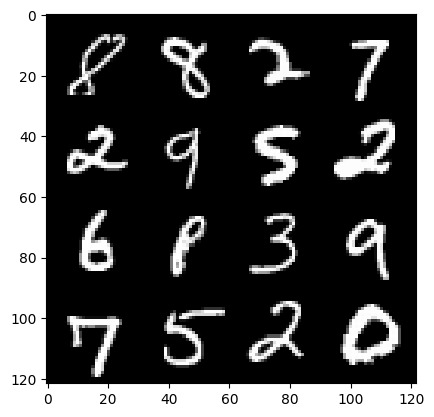

184: step 86400/ Gen loss: 1.5357667990525568 / Disc loss: 0.380492381354173
stepped in to the loop


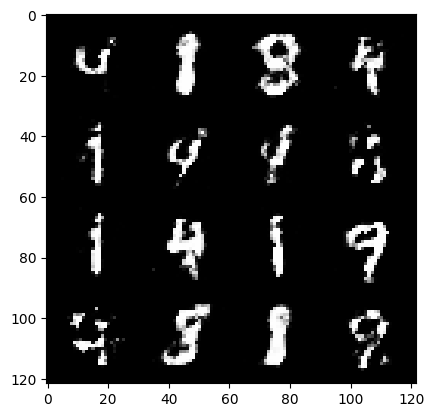

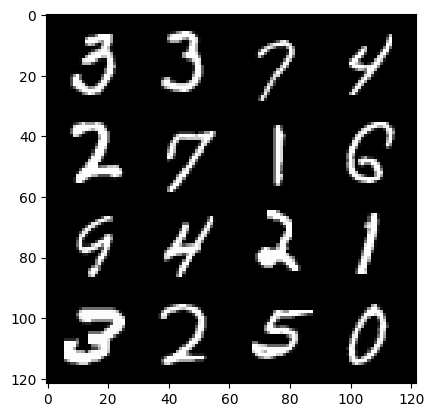

184: step 86700/ Gen loss: 1.471423846085866 / Disc loss: 0.387332603931427


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


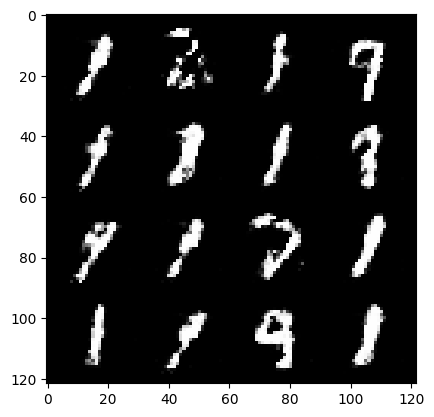

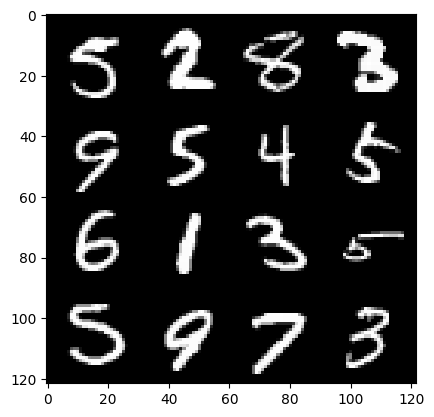

185: step 87000/ Gen loss: 1.5847620459397642 / Disc loss: 0.36130235234896385


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


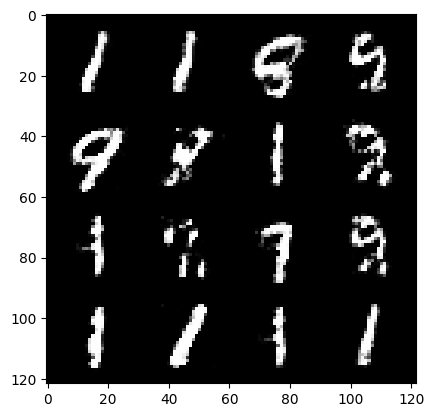

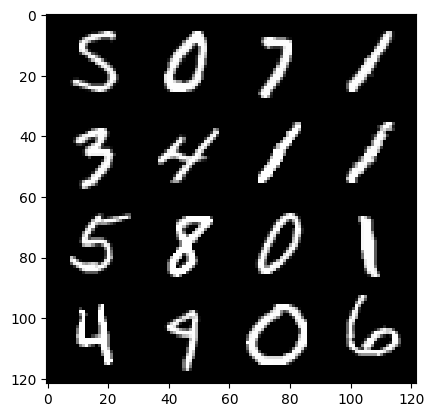

186: step 87300/ Gen loss: 1.5668115814526877 / Disc loss: 0.3639633054534594
stepped in to the loop


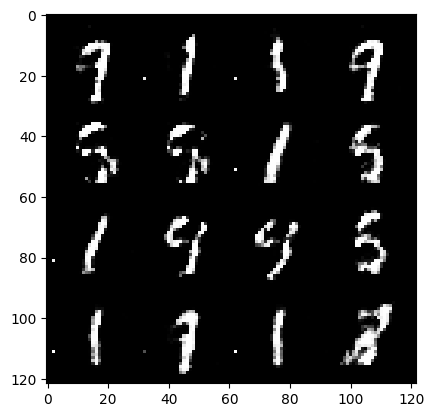

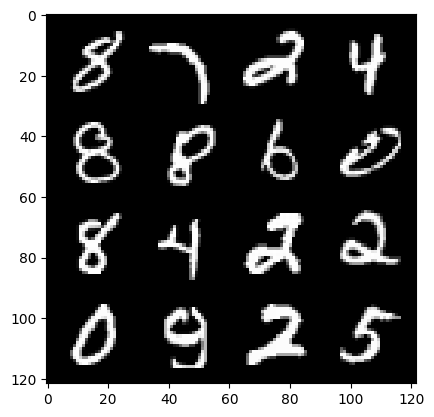

186: step 87600/ Gen loss: 1.5542023781935368 / Disc loss: 0.3763854547341665


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


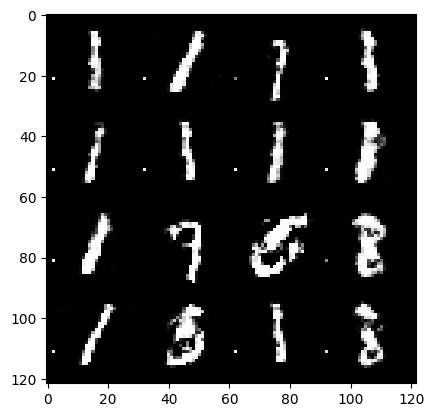

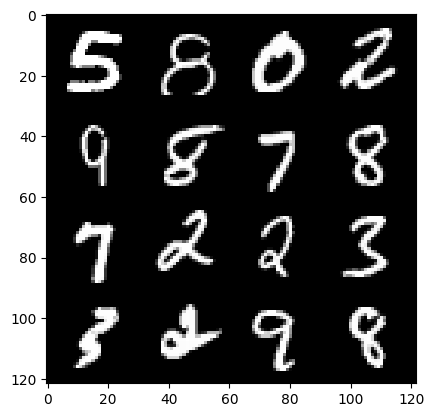

187: step 87900/ Gen loss: 1.5089882830778767 / Disc loss: 0.3834293747941655


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


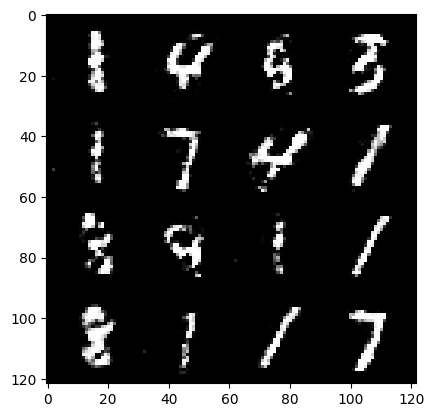

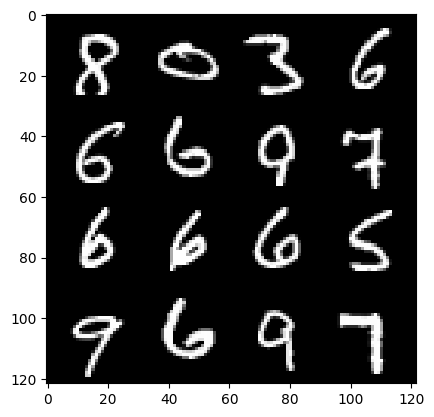

188: step 88200/ Gen loss: 1.43300175468127 / Disc loss: 0.3895960479974746
stepped in to the loop


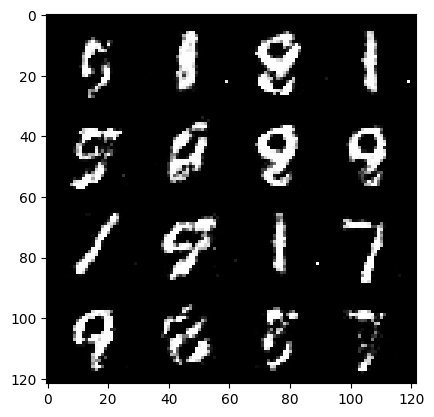

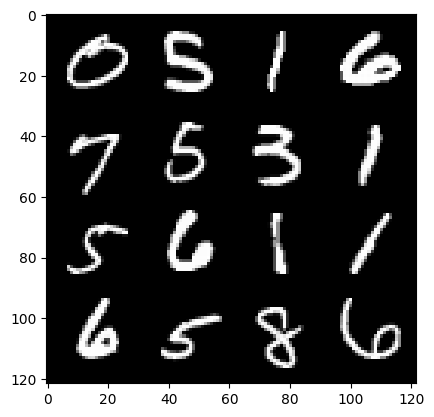

188: step 88500/ Gen loss: 1.3926595572630562 / Disc loss: 0.40126646190881726


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


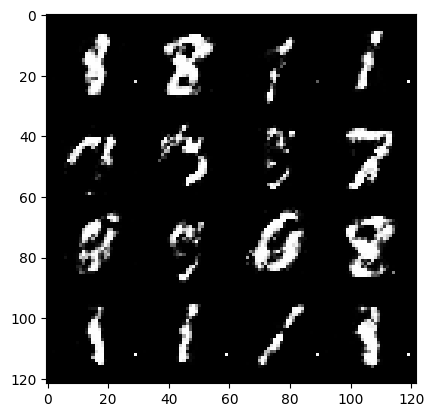

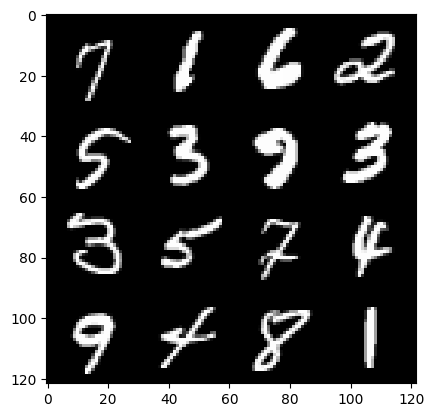

189: step 88800/ Gen loss: 1.409051683743794 / Disc loss: 0.3968718370795251
stepped in to the loop


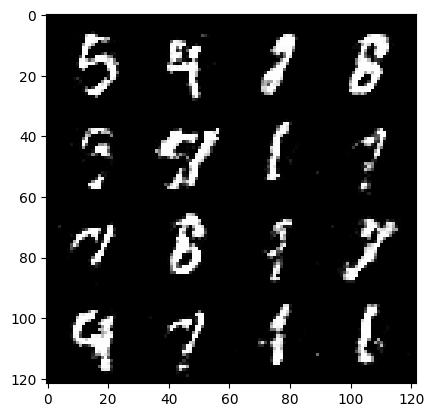

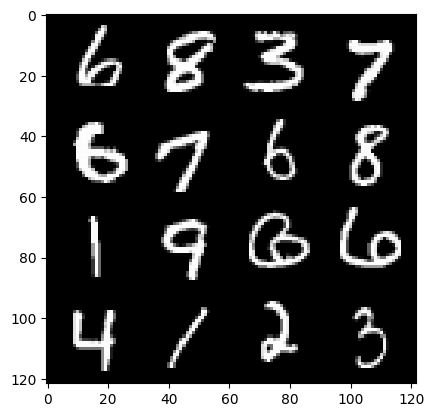

189: step 89100/ Gen loss: 1.5319775565465297 / Disc loss: 0.35557738671700184


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


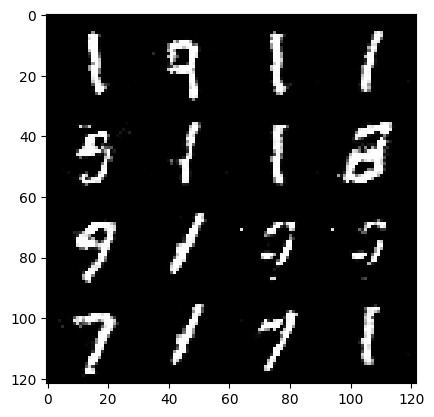

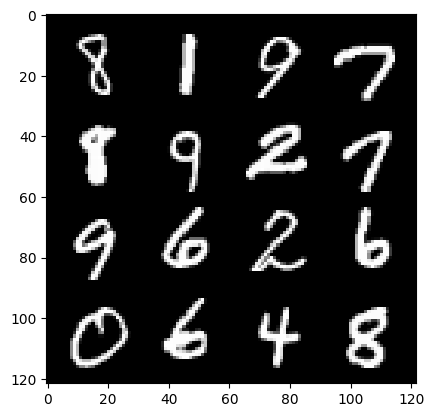

190: step 89400/ Gen loss: 1.5123472213745113 / Disc loss: 0.38182283133268347


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


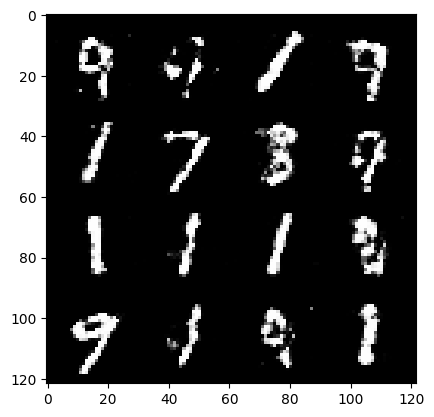

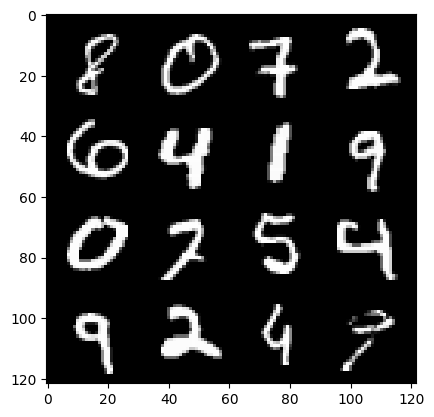

191: step 89700/ Gen loss: 1.5356922618548063 / Disc loss: 0.37276233345270143
stepped in to the loop


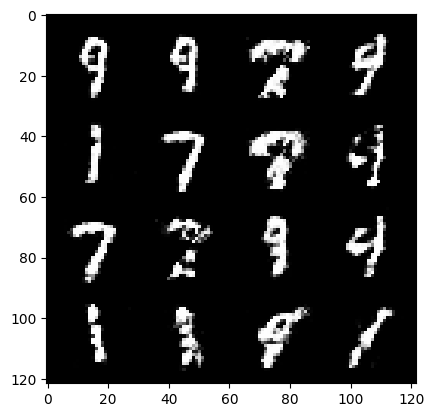

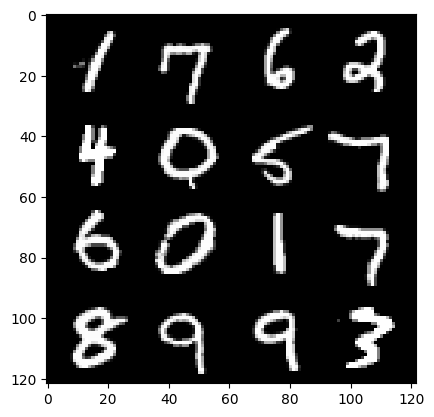

191: step 90000/ Gen loss: 1.6056745966275525 / Disc loss: 0.35679604361454625


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


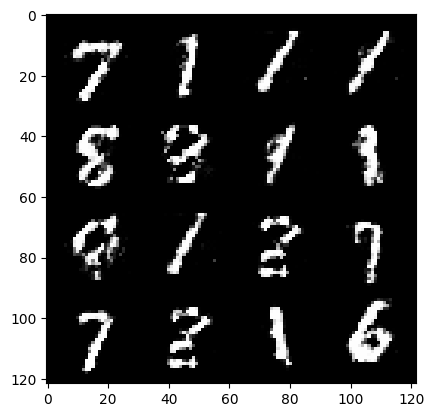

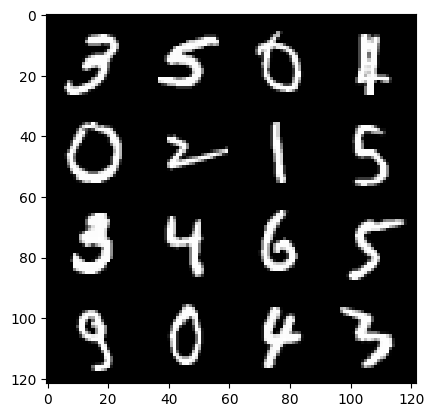

192: step 90300/ Gen loss: 1.5134141353766122 / Disc loss: 0.37204733222722997


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


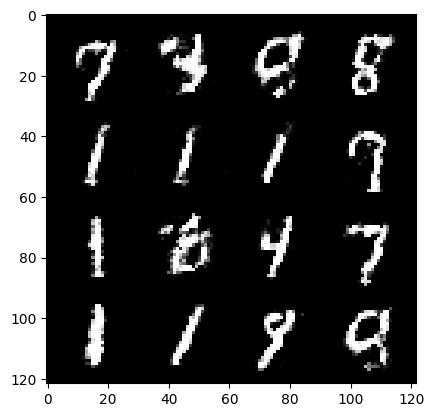

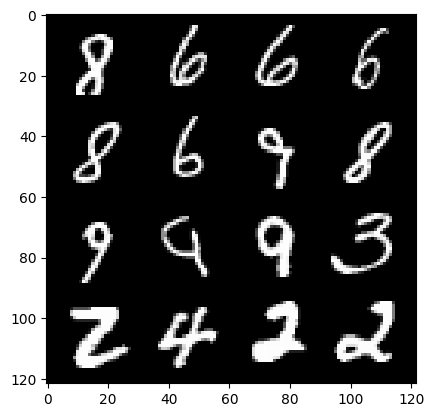

193: step 90600/ Gen loss: 1.4360024805863696 / Disc loss: 0.39979952673117347
stepped in to the loop


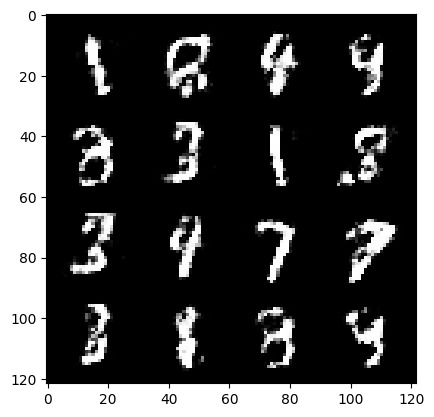

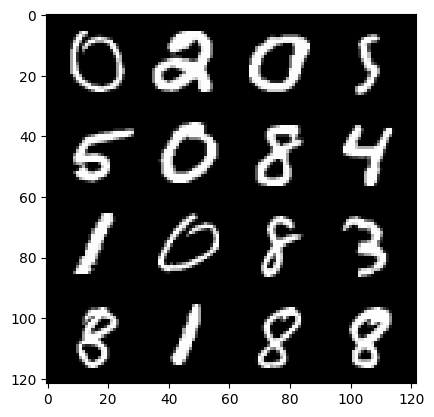

193: step 90900/ Gen loss: 1.4417593713601438 / Disc loss: 0.40074227432409926


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


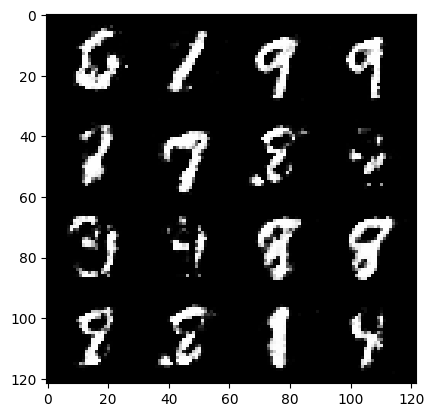

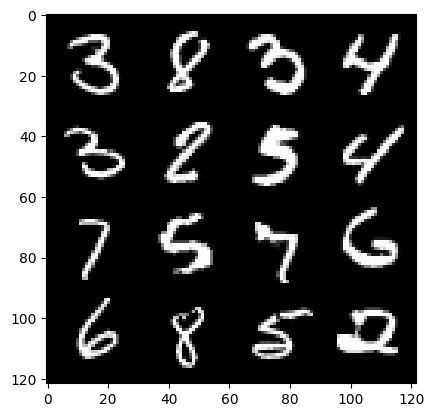

194: step 91200/ Gen loss: 1.4438731372356415 / Disc loss: 0.38925126175085684


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


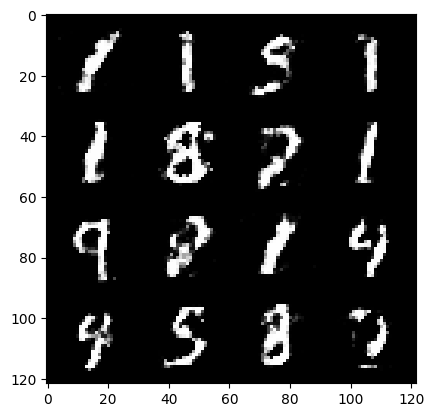

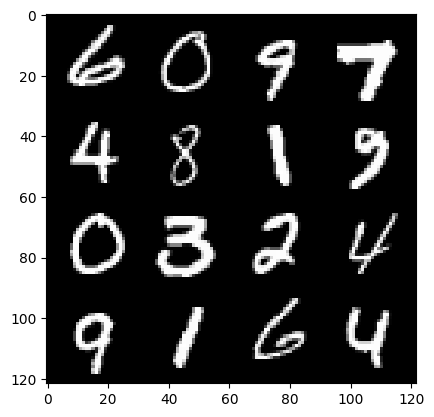

195: step 91500/ Gen loss: 1.4892657093207047 / Disc loss: 0.38971479813257864
stepped in to the loop


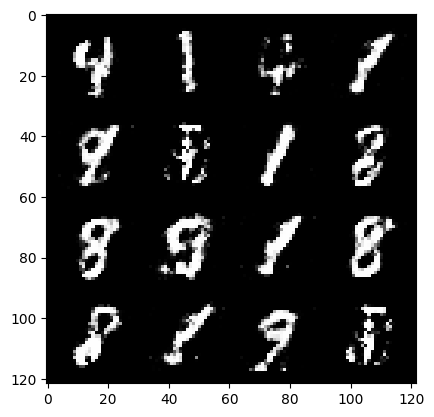

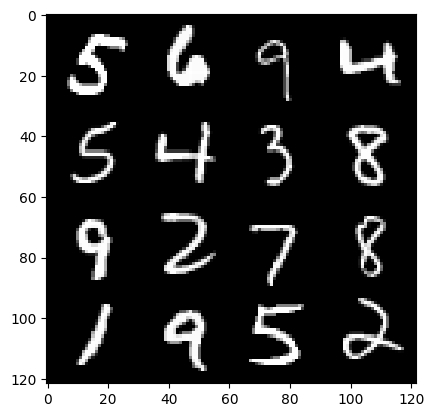

195: step 91800/ Gen loss: 1.4307447783152274 / Disc loss: 0.40539824138085034


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


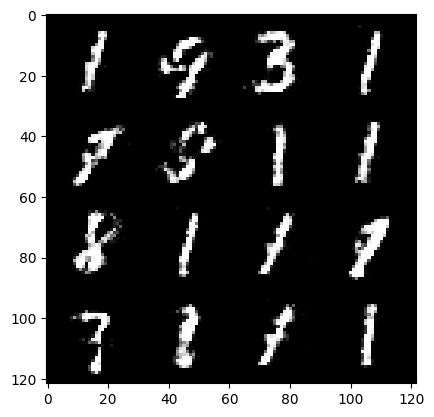

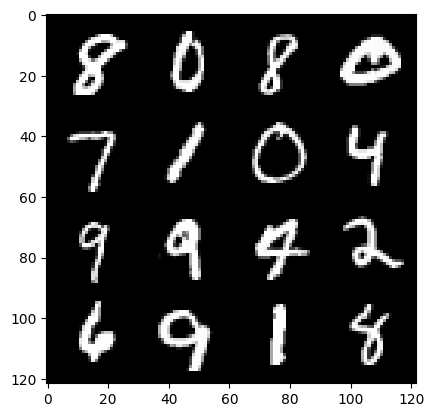

196: step 92100/ Gen loss: 1.4113270878791808 / Disc loss: 0.4040004282196361


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


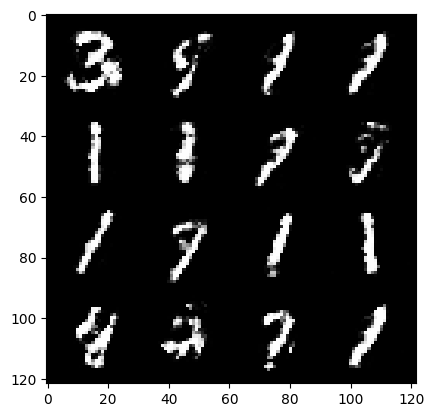

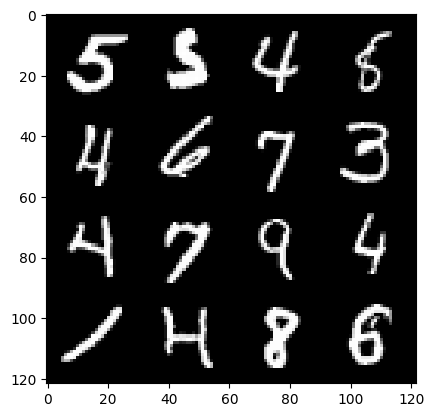

197: step 92400/ Gen loss: 1.3822847239176432 / Disc loss: 0.40686972747246397
stepped in to the loop


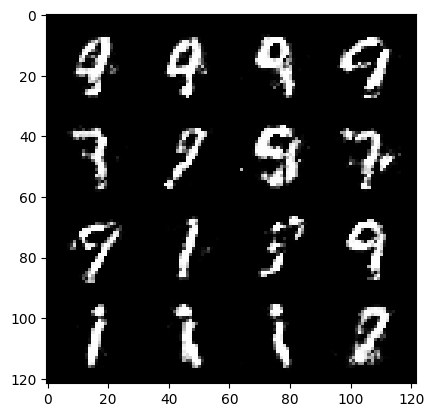

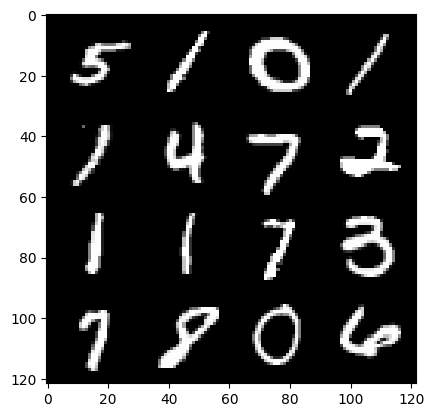

197: step 92700/ Gen loss: 1.3694497927029936 / Disc loss: 0.42063566048940015


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


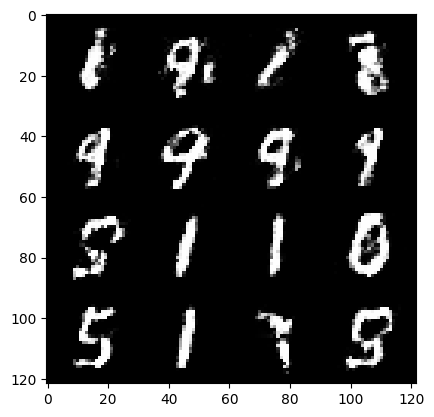

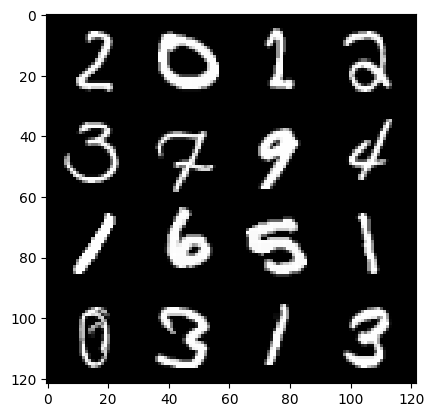

198: step 93000/ Gen loss: 1.3768292820453636 / Disc loss: 0.41891915460427587
stepped in to the loop


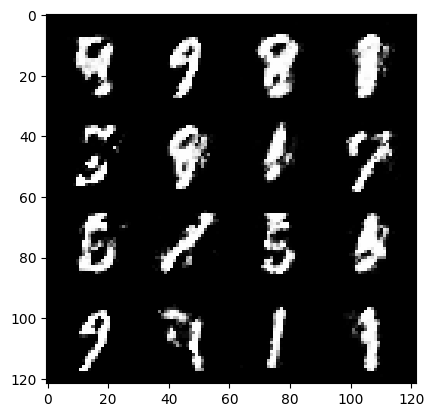

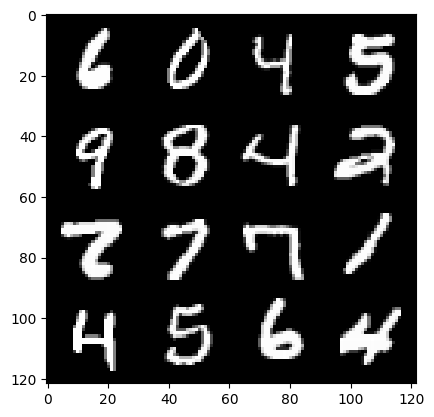

198: step 93300/ Gen loss: 1.4004278937975567 / Disc loss: 0.41688734690348317


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


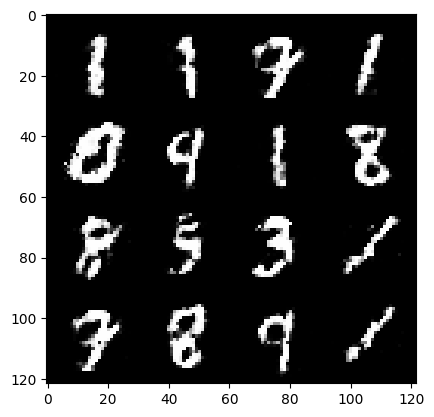

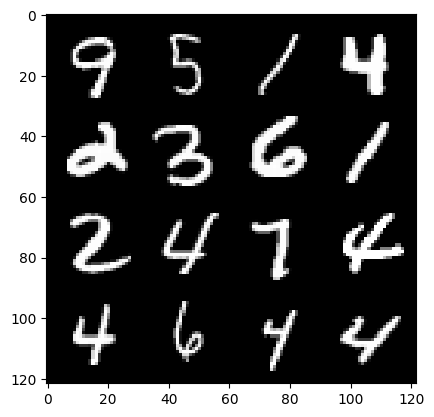

199: step 93600/ Gen loss: 1.4789471832911163 / Disc loss: 0.39228557934363684


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


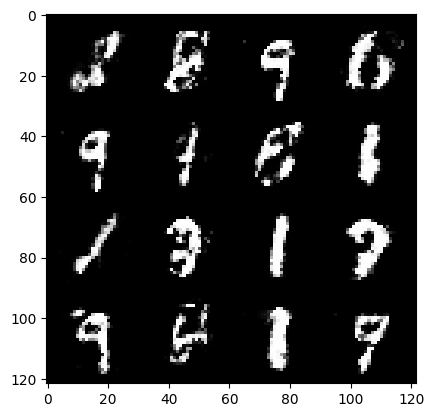

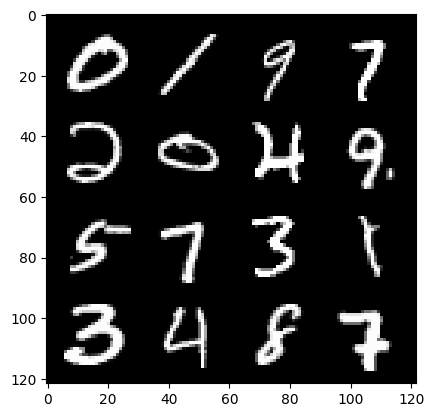

200: step 93900/ Gen loss: 1.478449460665386 / Disc loss: 0.3905126091837879
stepped in to the loop


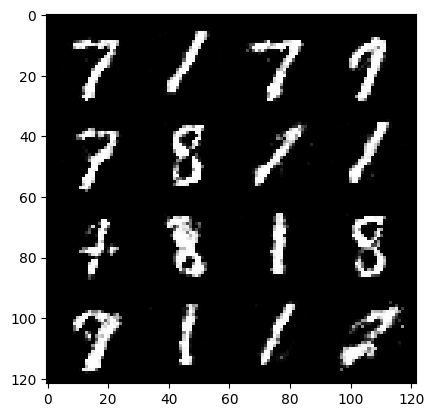

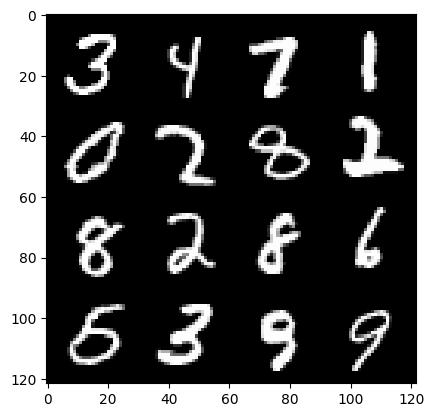

200: step 94200/ Gen loss: 1.439531646172206 / Disc loss: 0.39855924904346485


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


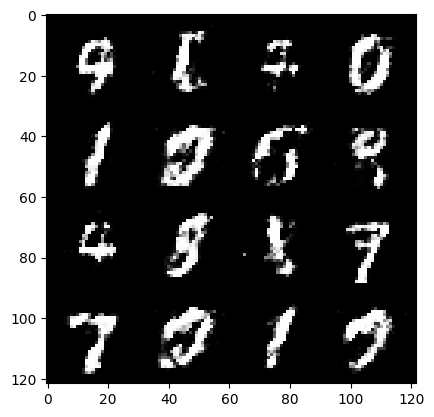

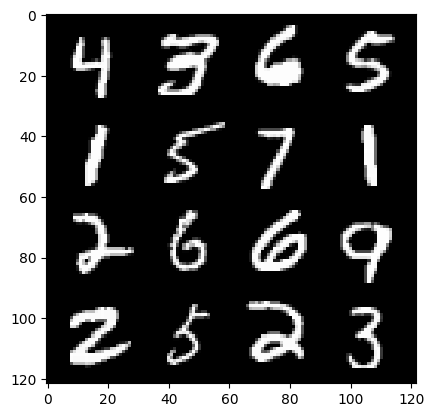

201: step 94500/ Gen loss: 1.5106634310881302 / Disc loss: 0.39381232271591826


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


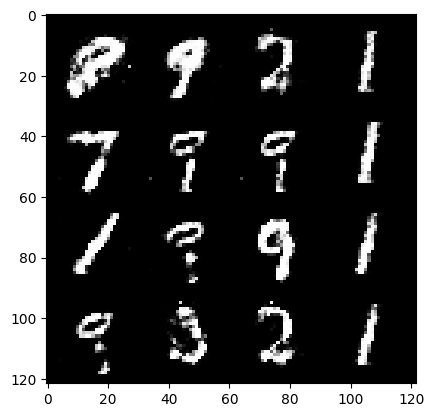

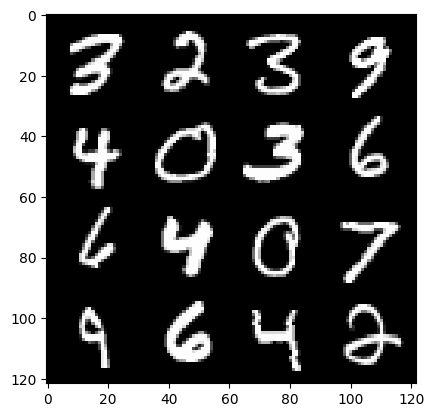

202: step 94800/ Gen loss: 1.4779711409409841 / Disc loss: 0.3947210085392
stepped in to the loop


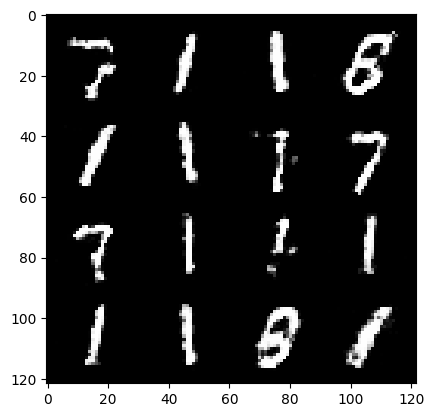

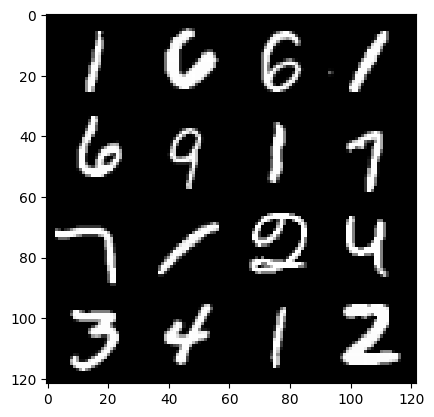

202: step 95100/ Gen loss: 1.482707694768905 / Disc loss: 0.3806969585021341


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


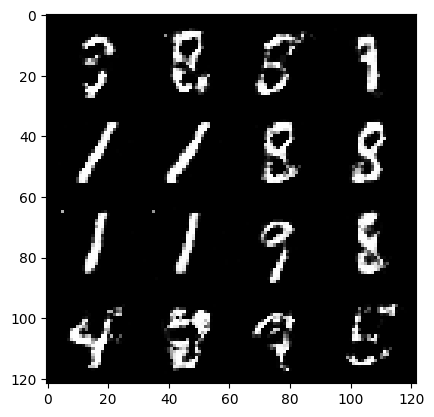

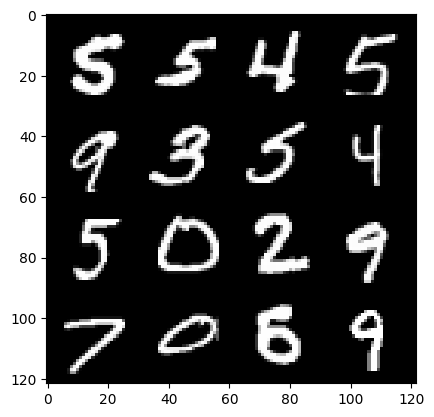

203: step 95400/ Gen loss: 1.5337599313259125 / Disc loss: 0.3865912601351737


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


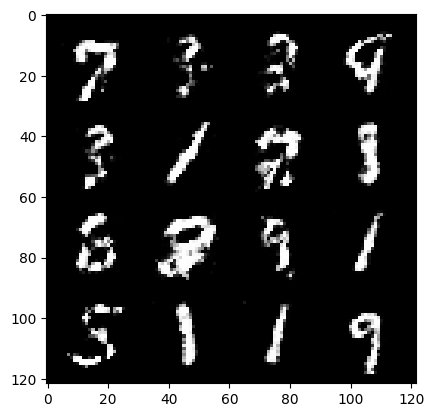

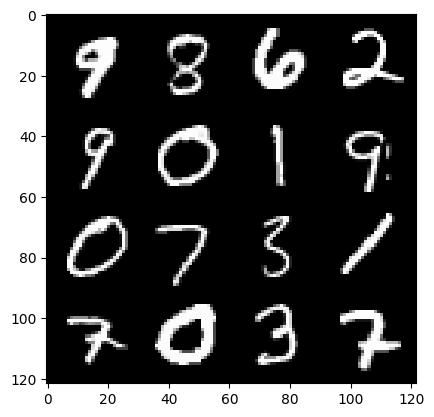

204: step 95700/ Gen loss: 1.480897134145101 / Disc loss: 0.3843684500455857
stepped in to the loop


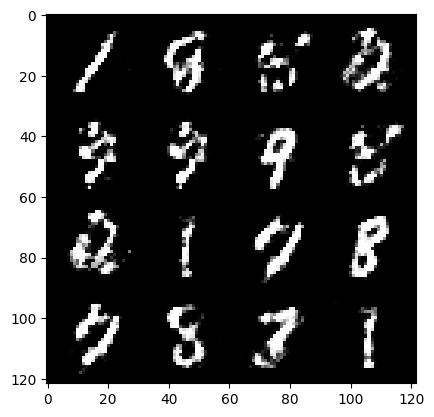

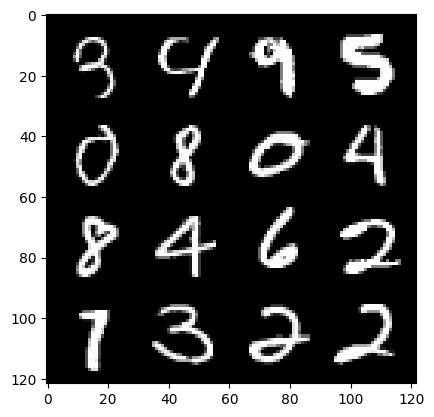

204: step 96000/ Gen loss: 1.4802428360780082 / Disc loss: 0.38668659110864007


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


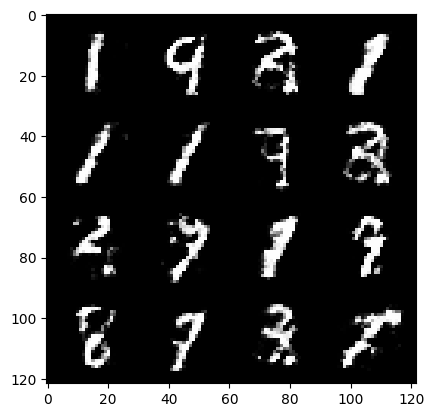

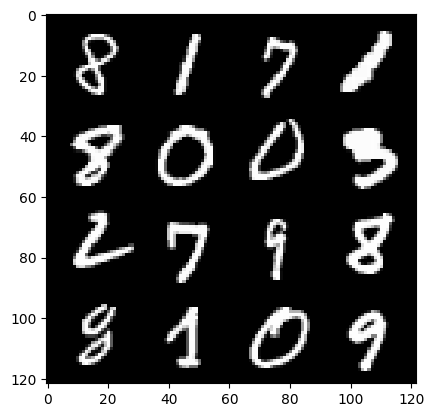

205: step 96300/ Gen loss: 1.40487336119016 / Disc loss: 0.403282627662023
stepped in to the loop


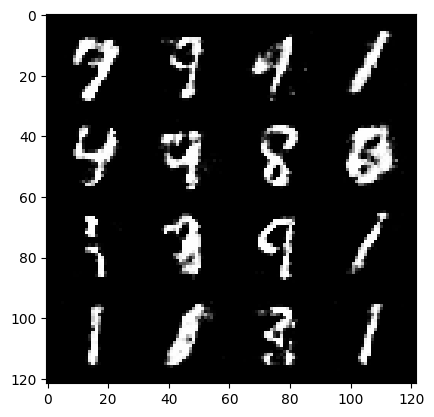

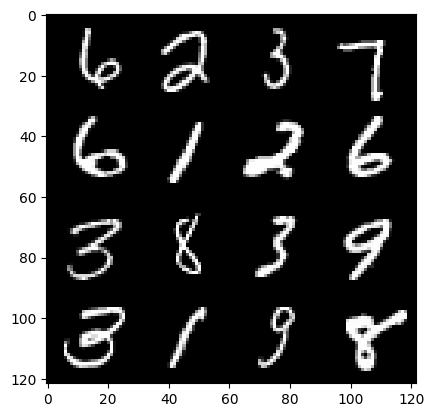

205: step 96600/ Gen loss: 1.4233829005559298 / Disc loss: 0.3941585979859036


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


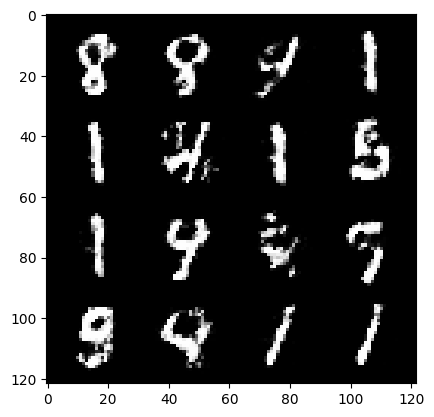

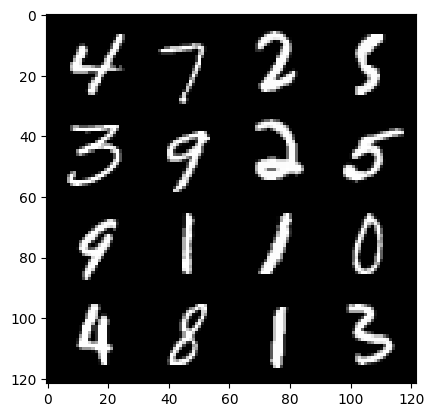

206: step 96900/ Gen loss: 1.4854464912414551 / Disc loss: 0.3897434134284657


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


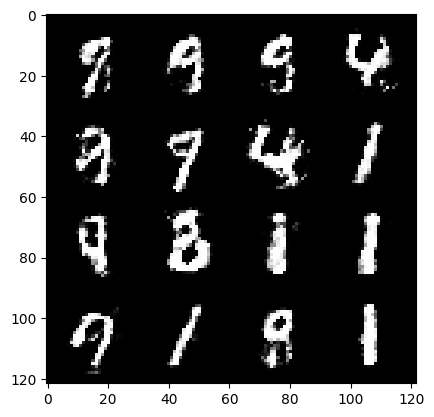

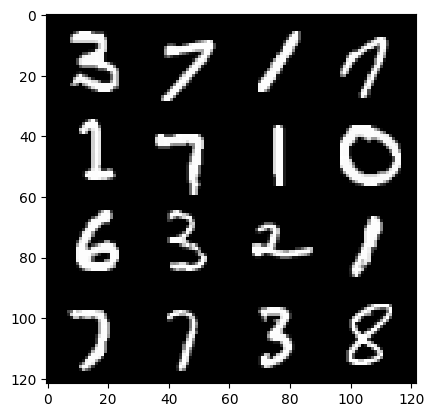

207: step 97200/ Gen loss: 1.514927064975103 / Disc loss: 0.38228530347347267
stepped in to the loop


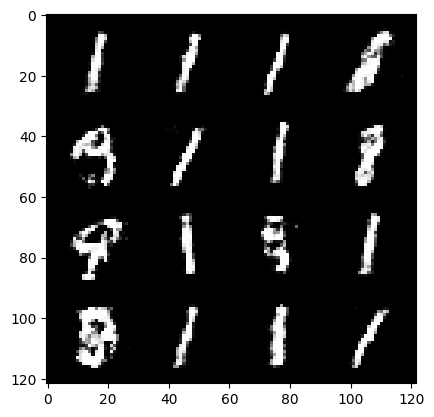

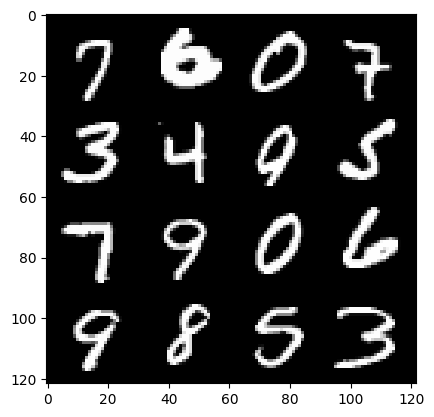

207: step 97500/ Gen loss: 1.5179707745711017 / Disc loss: 0.3826878904302916


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


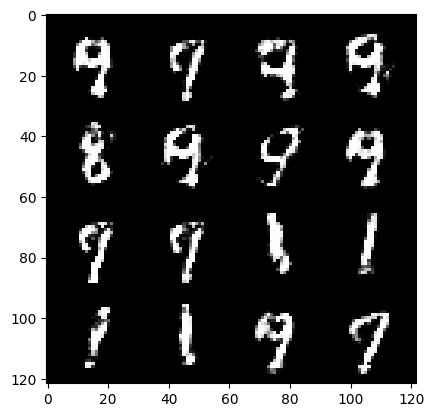

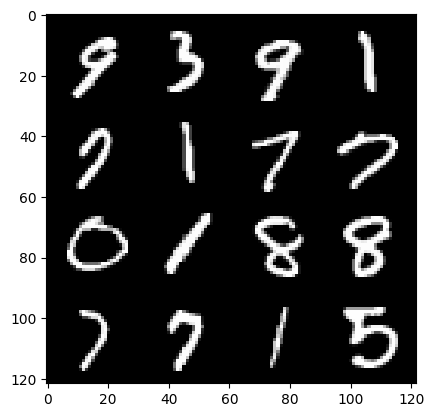

208: step 97800/ Gen loss: 1.554257479508718 / Disc loss: 0.3611633027593293


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


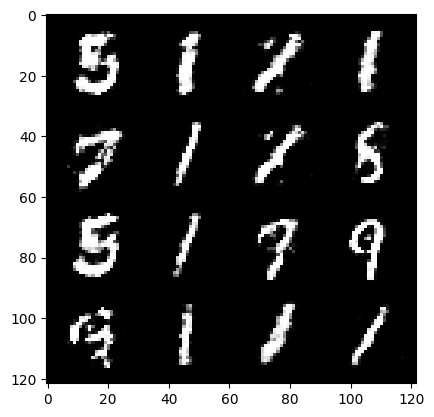

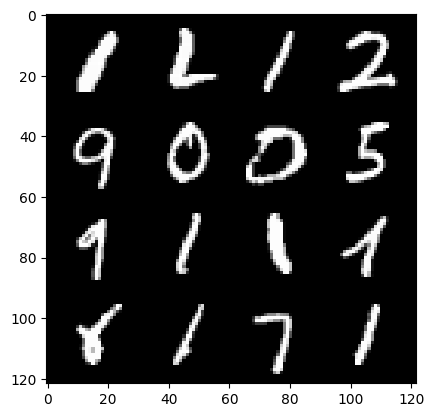

209: step 98100/ Gen loss: 1.4608619598547623 / Disc loss: 0.38846133212248485
stepped in to the loop


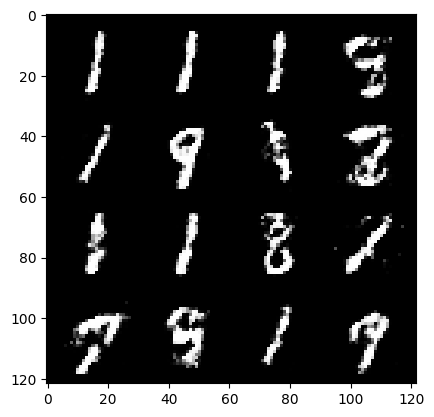

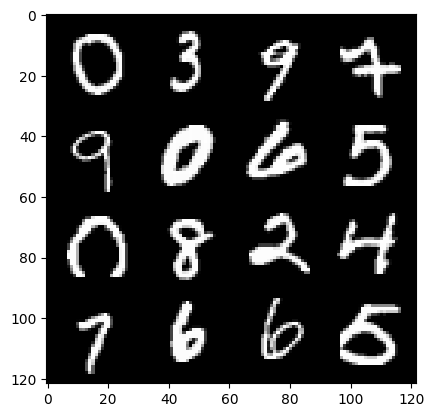

209: step 98400/ Gen loss: 1.3743565706411993 / Disc loss: 0.4144247241814934


  0%|          | 0/469 [00:00<?, ?it/s]

stepped in to the loop


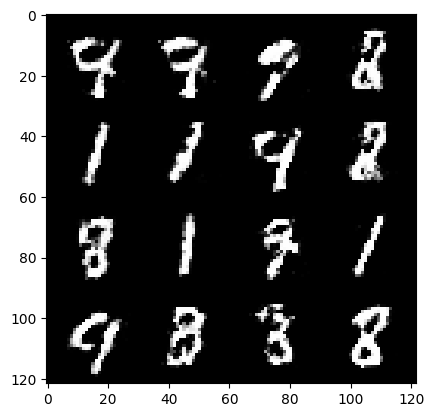

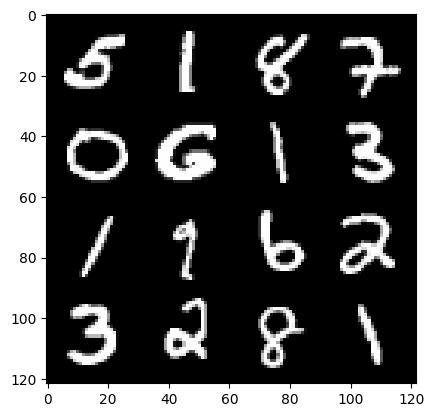

210: step 98700/ Gen loss: 1.4325802254676816 / Disc loss: 0.3964412727952001


In [ ]:
### 60000 / 128 = 468.75 = 469 steps in each epoch
### each step is going to process 128 images = size of the batch (except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ###discriminator
    disc_opt.zero_grad()

    cur_bs = len(real) #real: 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1) #128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)

    disc_loss.backward(retain_graph = True)
    disc_opt.step()

    ### generator
    gen_opt.zero_grad()

    gen_loss = calc_gen_loss(loss_func, gen, disc, cur_bs, z_dim)
    gen_loss.backward(retain_graph = True)
    gen_opt.step()

    ### Visualization & stats
    mean_disc_loss += disc_loss.item()/info_step
    mean_gen_loss += gen_loss.item()/info_step


    if cur_step % info_step == 0 and cur_step>0:
      print("stepped in to the loop")
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step}/ Gen loss: {mean_gen_loss} / Disc loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss = 0,0
    cur_step += 1

